# Reference
- Erik Linder-Norén, "PyTorch-GAN", GitHub repository, https://github.com/eriklindernoren/PyTorch-GAN


# WGAN

## Import libraries

In [1]:
import argparse
import os
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

os.makedirs("images", exist_ok=True)

def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)


## Option

In [2]:
class Option():
    n_epochs = 200 # number of epochs of training
    batch_size = 64 # size of the batches
    lr = 0.00005 # learning rate
    n_cpu = 8 # number of cpu threads to use during batch generation
    latent_dim = 100 # dimensionality of the latent space
    n_critic = 5 # number of critics
    img_size = 28 # size of each image dimension
    channels = 1 # number of image channels
    clip_value = 0.01  # lower and upper clip value for disc. weights
    sample_interval = 500 # interval between image sampling

opt = Option()
cuda = True if torch.cuda.is_available() else False
img_shape = (opt.channels, opt.img_size, opt.img_size)

## Models

In [3]:

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(opt.latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.shape[0], *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
        )

    def forward(self, img):
        img_flat = img.view(img.shape[0], -1)
        validity = self.model(img_flat)
        return validity

## Loss & Optimizer

In [4]:

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()

# Configure data loader
os.makedirs("../../data/mnist", exist_ok=True)
dataloader = torch.utils.data.DataLoader(
    datasets.MNIST(
        "../../data/mnist",
        train=True,
        download=True,
        transform=transforms.Compose([transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]),
    ),
    batch_size=opt.batch_size,
    shuffle=True,
)

# Optimizers
optimizer_G = torch.optim.RMSprop(generator.parameters(), lr=opt.lr)
optimizer_D = torch.optim.RMSprop(discriminator.parameters(), lr=opt.lr)

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor


100%|██████████| 9912422/9912422 [00:00<00:00, 191942527.85it/s]

Extracting ../../data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to ../../data/mnist/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 61025538.45it/s]


Extracting ../../data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to ../../data/mnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 35344669.07it/s]

Extracting ../../data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to ../../data/mnist/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 20244982.75it/s]


Extracting ../../data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../../data/mnist/MNIST/raw



## Training

<ipython-input-5-173b7177bbba>:20: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))


[Epoch 0/200] [Batch 0/938] [D loss: -0.002522] [G loss: 0.010416]


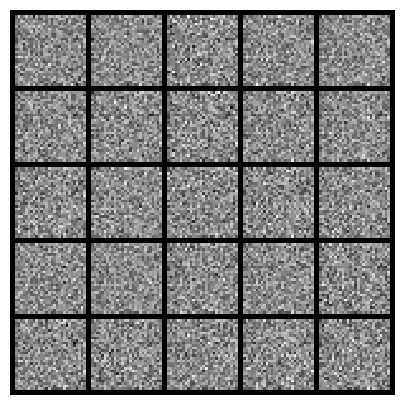

[Epoch 0/200] [Batch 500/938] [D loss: -1.756367] [G loss: -19.109001]


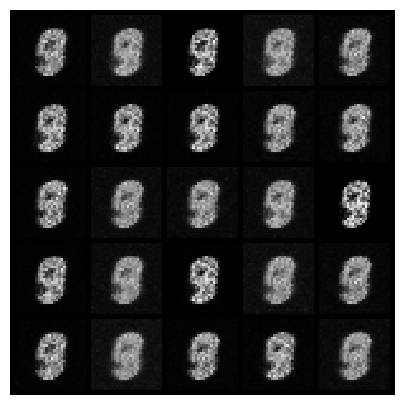

[Epoch 1/200] [Batch 62/938] [D loss: -0.657868] [G loss: -14.628361]


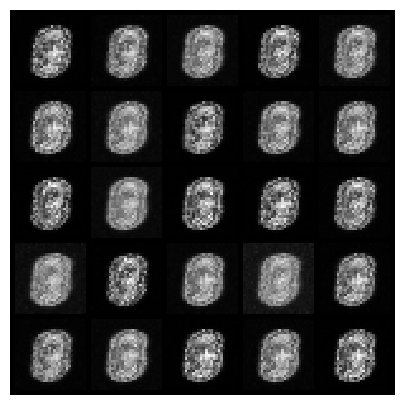

[Epoch 1/200] [Batch 562/938] [D loss: -0.054449] [G loss: -12.311502]


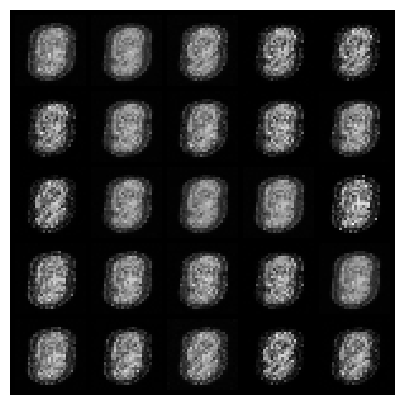

[Epoch 2/200] [Batch 124/938] [D loss: -0.015766] [G loss: -12.434243]


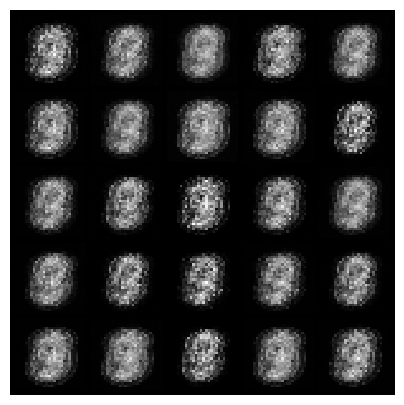

[Epoch 2/200] [Batch 624/938] [D loss: -0.043450] [G loss: -12.468624]


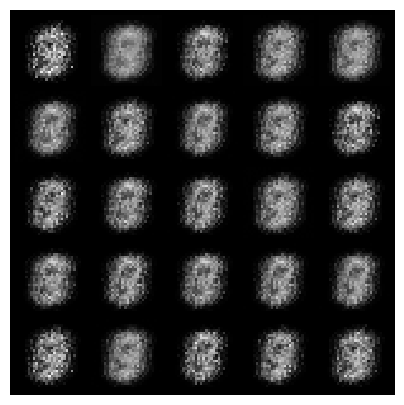

[Epoch 3/200] [Batch 186/938] [D loss: -0.072128] [G loss: -4.507562]


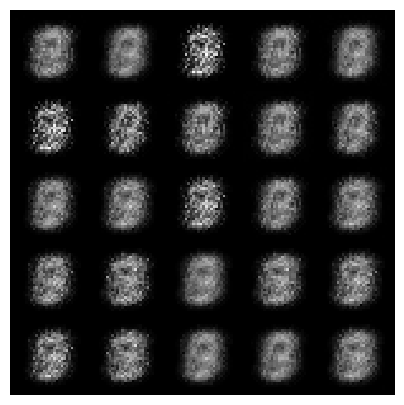

[Epoch 3/200] [Batch 686/938] [D loss: -0.343598] [G loss: -0.523819]


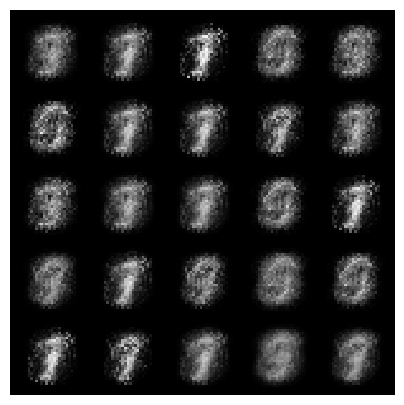

[Epoch 4/200] [Batch 248/938] [D loss: -0.142282] [G loss: -1.010452]


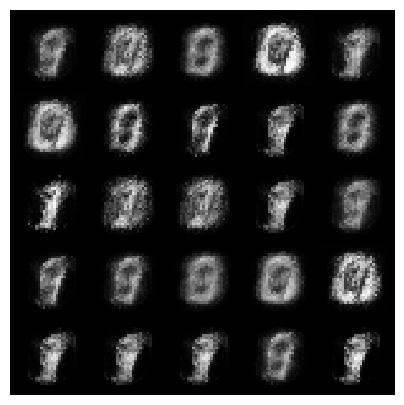

[Epoch 4/200] [Batch 748/938] [D loss: -0.411529] [G loss: -0.884951]


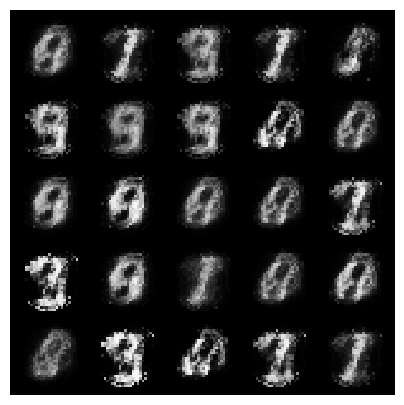

[Epoch 5/200] [Batch 310/938] [D loss: -0.786864] [G loss: -0.383725]


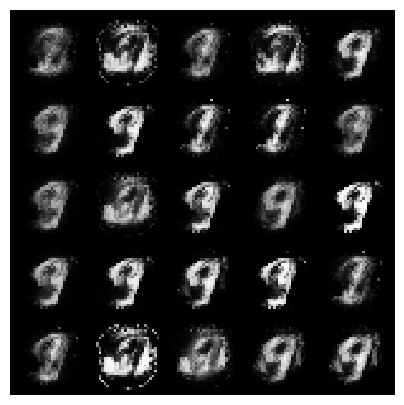

[Epoch 5/200] [Batch 810/938] [D loss: -0.560805] [G loss: -0.808187]


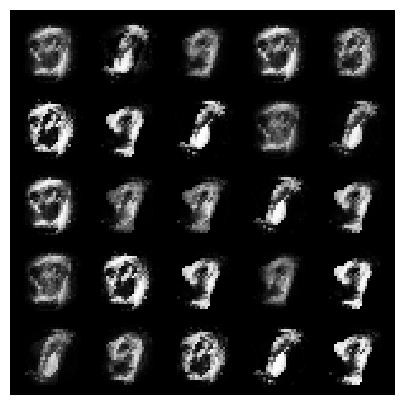

[Epoch 6/200] [Batch 372/938] [D loss: -0.409716] [G loss: -0.786441]


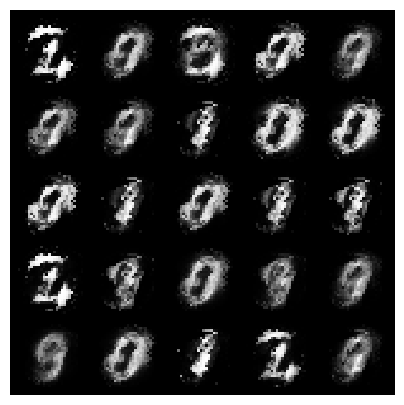

[Epoch 6/200] [Batch 872/938] [D loss: -0.448145] [G loss: -0.911427]


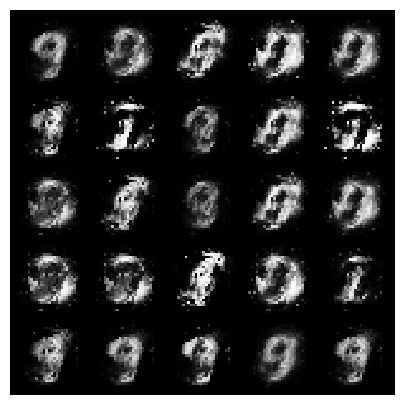

[Epoch 7/200] [Batch 434/938] [D loss: -0.365844] [G loss: -1.128777]


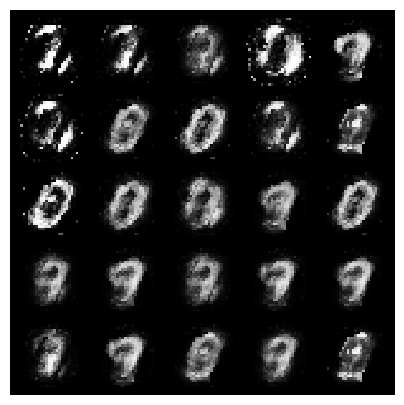

[Epoch 7/200] [Batch 934/938] [D loss: -0.212566] [G loss: -1.677129]


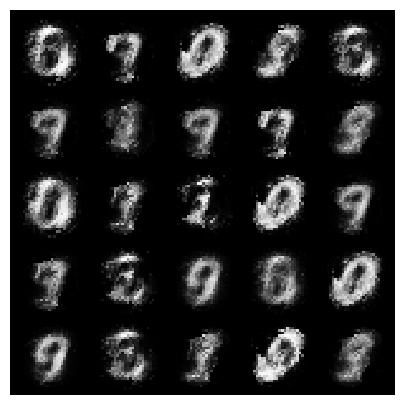

[Epoch 8/200] [Batch 496/938] [D loss: -0.489978] [G loss: -1.490731]


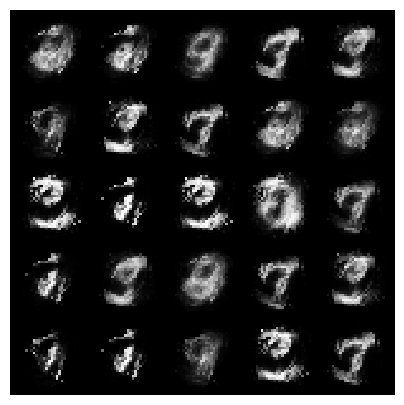

[Epoch 9/200] [Batch 58/938] [D loss: -0.458751] [G loss: -2.398598]


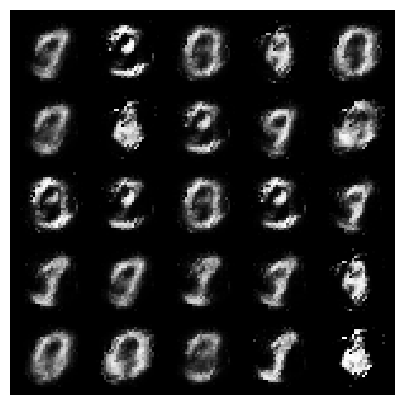

[Epoch 9/200] [Batch 558/938] [D loss: -0.393170] [G loss: -2.755572]


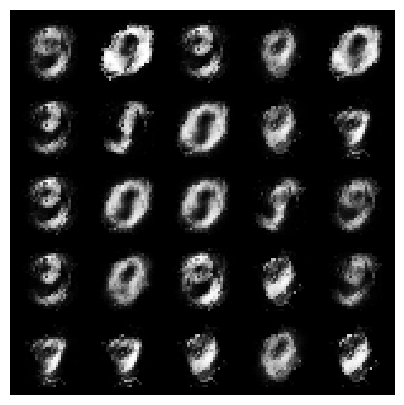

[Epoch 10/200] [Batch 120/938] [D loss: -0.341395] [G loss: -2.033537]


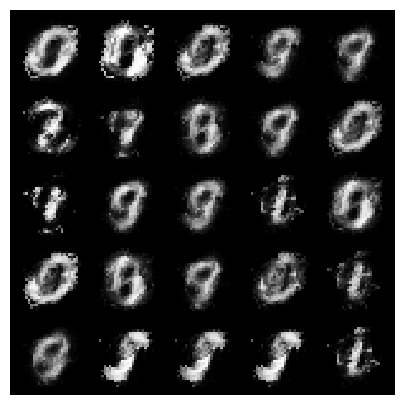

[Epoch 10/200] [Batch 620/938] [D loss: -0.669877] [G loss: -0.553155]


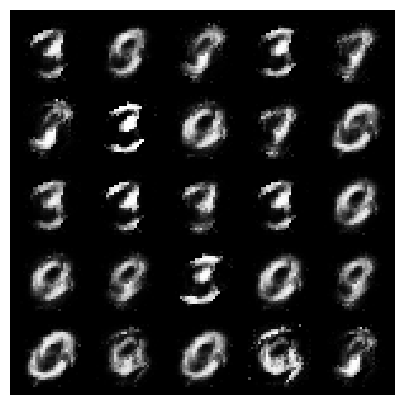

[Epoch 11/200] [Batch 182/938] [D loss: -0.608130] [G loss: -1.508963]


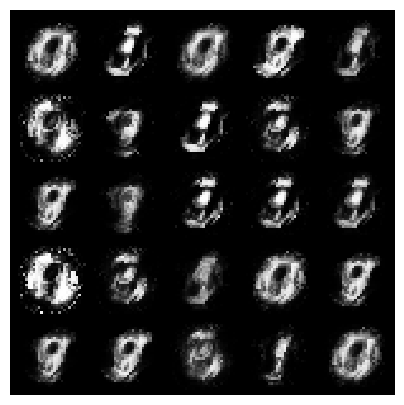

[Epoch 11/200] [Batch 682/938] [D loss: -0.467262] [G loss: -1.730173]


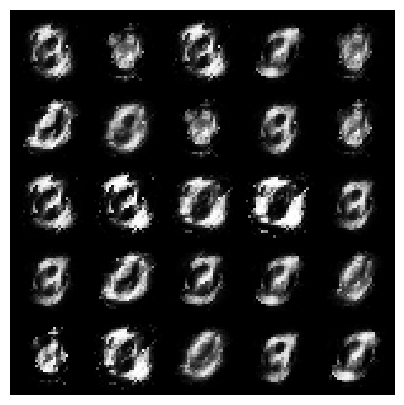

[Epoch 12/200] [Batch 244/938] [D loss: -0.586283] [G loss: -0.547505]


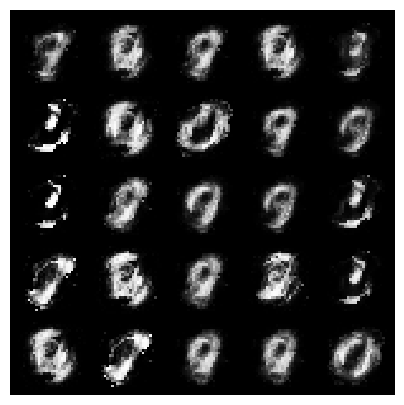

[Epoch 12/200] [Batch 744/938] [D loss: -0.864427] [G loss: -0.334363]


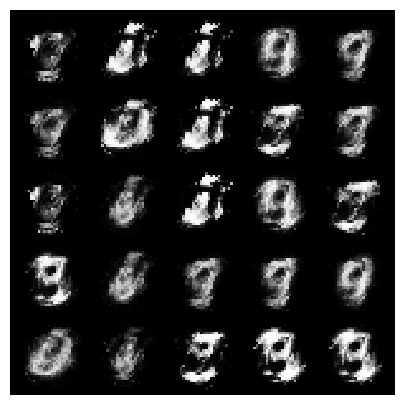

[Epoch 13/200] [Batch 306/938] [D loss: -0.548809] [G loss: -1.017478]


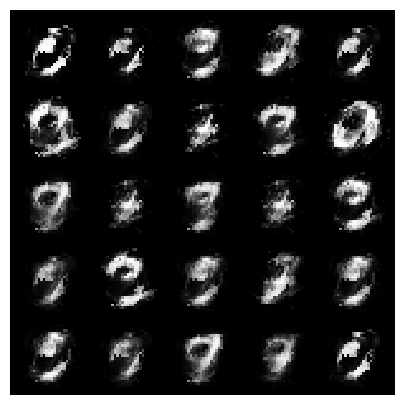

[Epoch 13/200] [Batch 806/938] [D loss: -0.963271] [G loss: -0.493904]


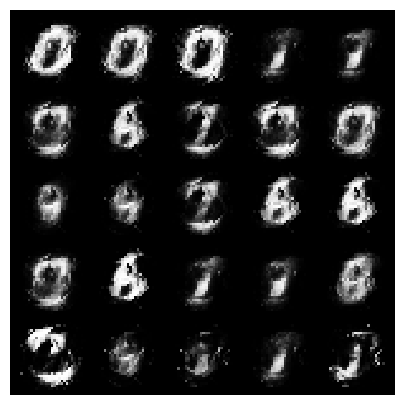

[Epoch 14/200] [Batch 368/938] [D loss: -0.609785] [G loss: -1.466456]


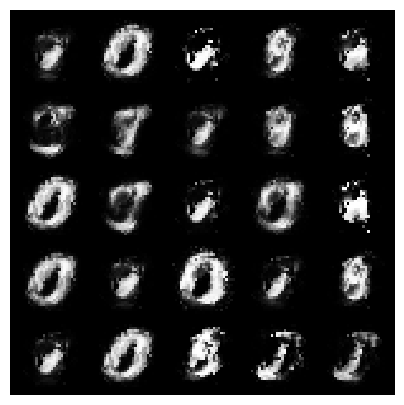

[Epoch 14/200] [Batch 868/938] [D loss: -0.824984] [G loss: -0.574037]


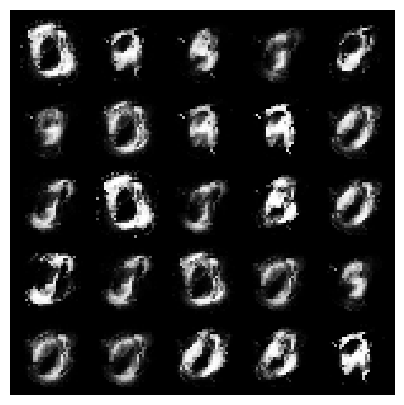

[Epoch 15/200] [Batch 430/938] [D loss: -0.437250] [G loss: -1.238408]


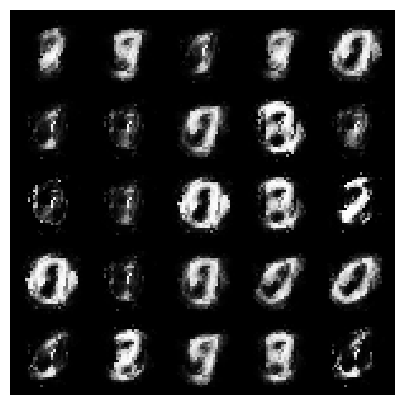

[Epoch 15/200] [Batch 930/938] [D loss: -1.033469] [G loss: -0.579423]


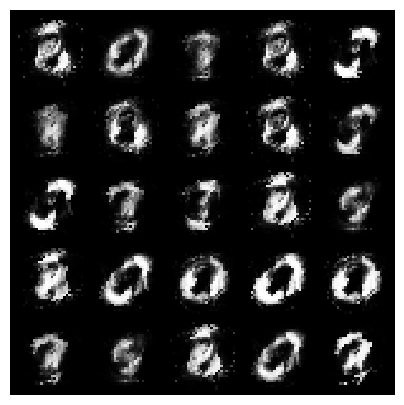

[Epoch 16/200] [Batch 492/938] [D loss: -0.626056] [G loss: -0.496670]


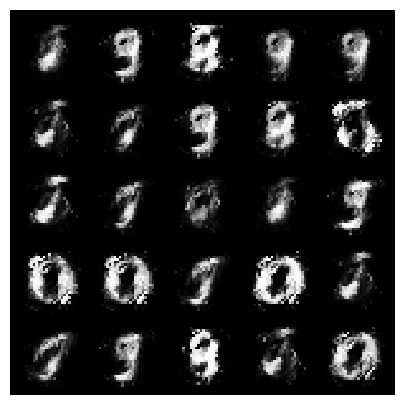

[Epoch 17/200] [Batch 54/938] [D loss: -0.577153] [G loss: -0.886794]


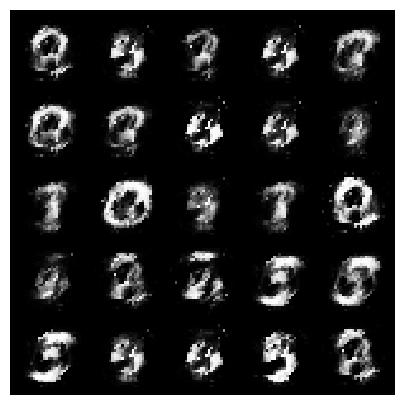

[Epoch 17/200] [Batch 554/938] [D loss: -0.674552] [G loss: -0.868580]


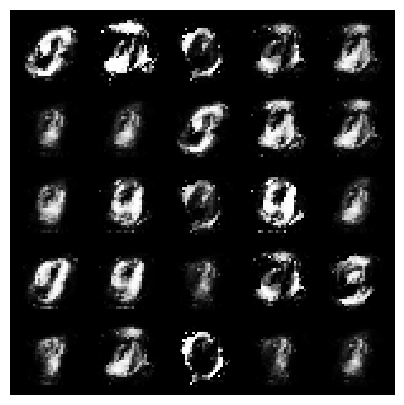

[Epoch 18/200] [Batch 116/938] [D loss: -0.821960] [G loss: -0.993461]


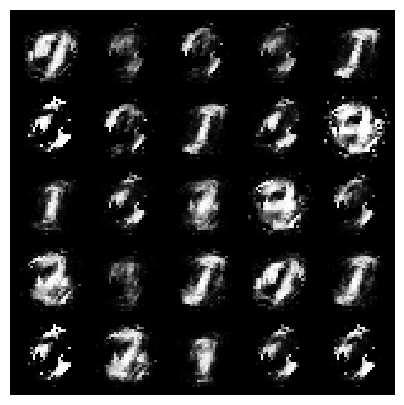

[Epoch 18/200] [Batch 616/938] [D loss: -0.664045] [G loss: -0.772673]


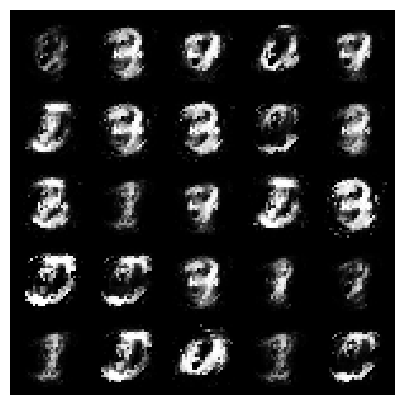

[Epoch 19/200] [Batch 178/938] [D loss: -0.752129] [G loss: -0.514831]


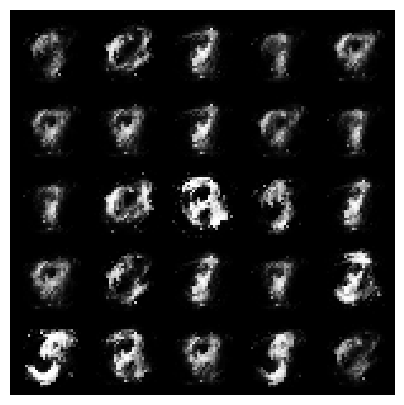

[Epoch 19/200] [Batch 678/938] [D loss: -0.610741] [G loss: -1.414128]


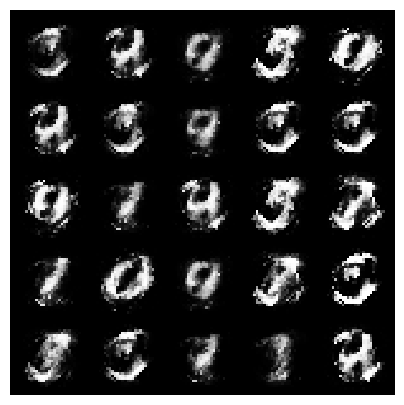

[Epoch 20/200] [Batch 240/938] [D loss: -0.702754] [G loss: -1.315978]


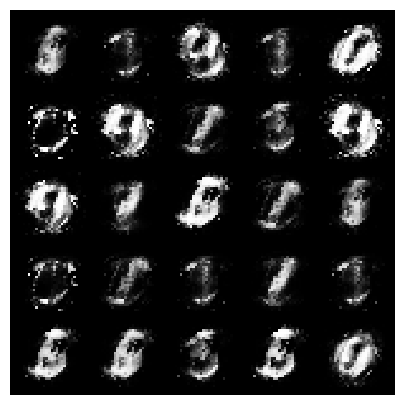

[Epoch 20/200] [Batch 740/938] [D loss: -0.588895] [G loss: -0.867010]


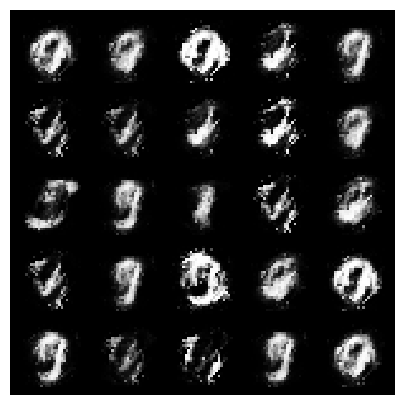

[Epoch 21/200] [Batch 302/938] [D loss: -0.551699] [G loss: -2.403113]


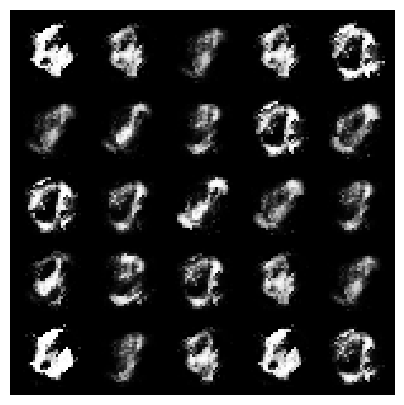

[Epoch 21/200] [Batch 802/938] [D loss: -0.888661] [G loss: -0.518825]


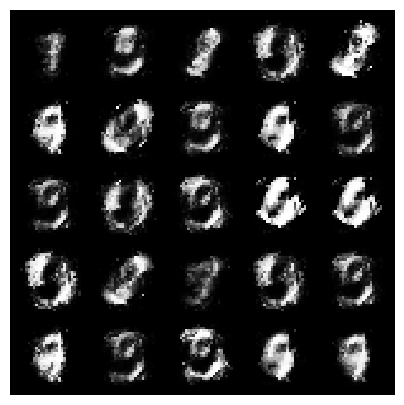

[Epoch 22/200] [Batch 364/938] [D loss: -0.747828] [G loss: -0.629475]


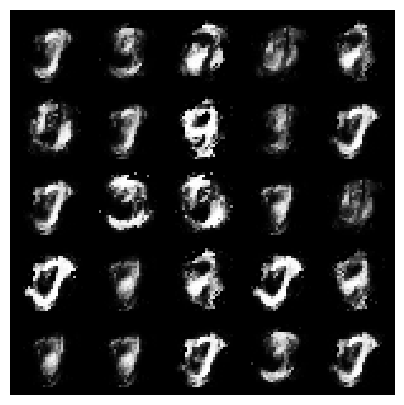

[Epoch 22/200] [Batch 864/938] [D loss: -0.734063] [G loss: -0.453630]


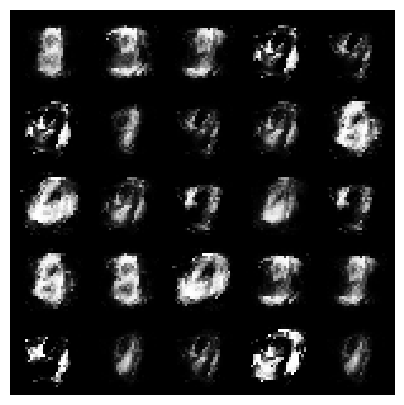

[Epoch 23/200] [Batch 426/938] [D loss: -0.666983] [G loss: -0.351750]


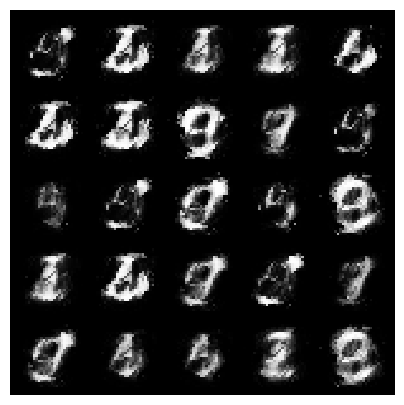

[Epoch 23/200] [Batch 926/938] [D loss: -0.675118] [G loss: -0.545460]


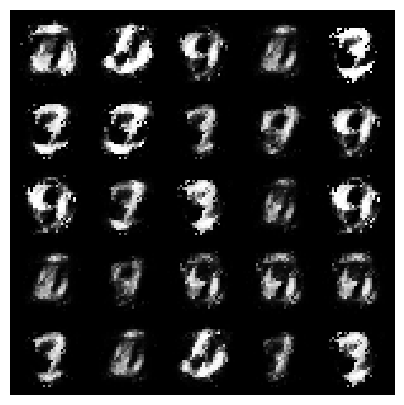

[Epoch 24/200] [Batch 488/938] [D loss: -0.810223] [G loss: -0.528708]


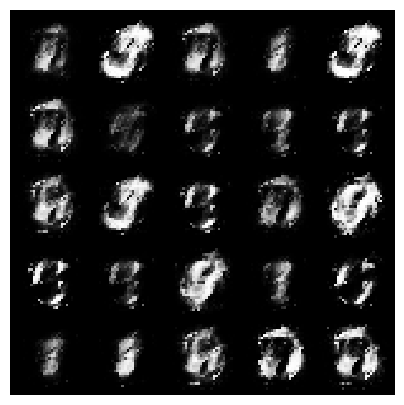

[Epoch 25/200] [Batch 50/938] [D loss: -0.819727] [G loss: -0.674498]


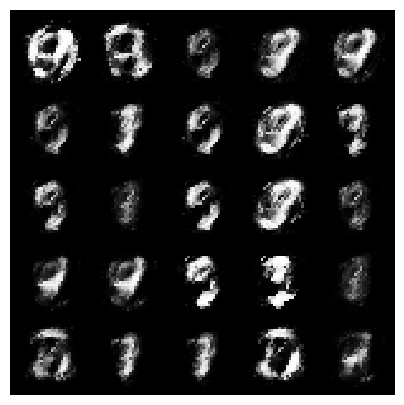

[Epoch 25/200] [Batch 550/938] [D loss: -0.442000] [G loss: -2.712806]


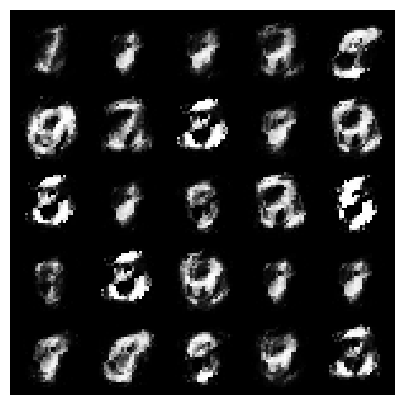

[Epoch 26/200] [Batch 112/938] [D loss: -0.632749] [G loss: -0.736139]


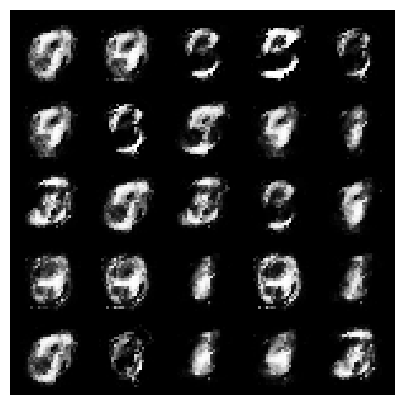

[Epoch 26/200] [Batch 612/938] [D loss: -0.649061] [G loss: -0.354203]


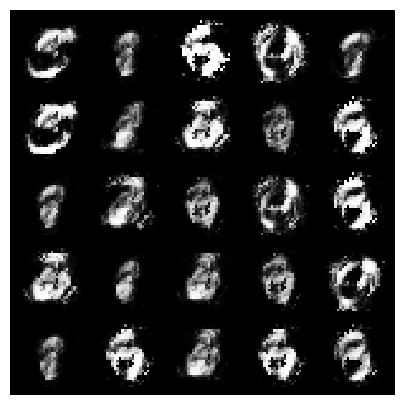

[Epoch 27/200] [Batch 174/938] [D loss: -0.370543] [G loss: -2.506042]


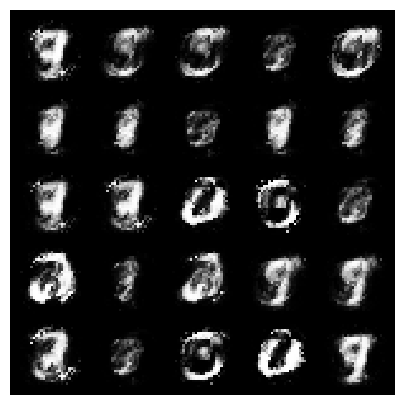

[Epoch 27/200] [Batch 674/938] [D loss: -0.651441] [G loss: -0.992021]


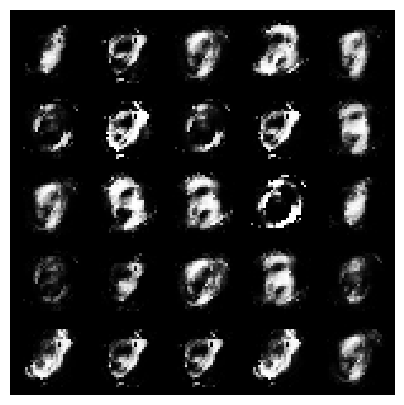

[Epoch 28/200] [Batch 236/938] [D loss: -0.416583] [G loss: -4.566123]


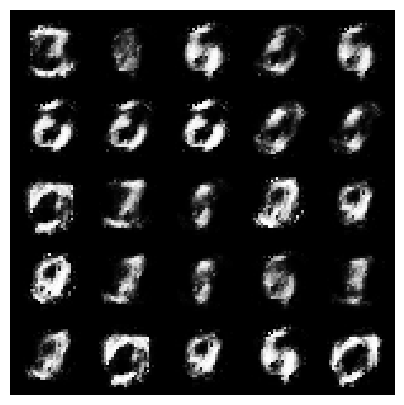

[Epoch 28/200] [Batch 736/938] [D loss: -0.357060] [G loss: -3.086342]


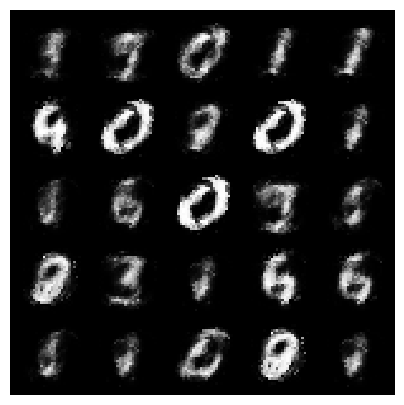

[Epoch 29/200] [Batch 298/938] [D loss: -0.328737] [G loss: -3.332422]


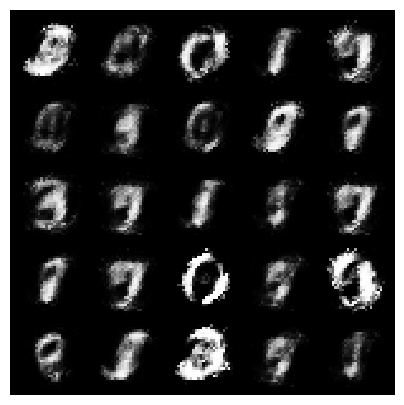

[Epoch 29/200] [Batch 798/938] [D loss: -0.241828] [G loss: -2.306055]


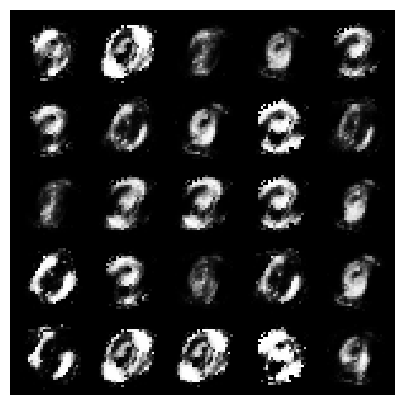

[Epoch 30/200] [Batch 360/938] [D loss: -0.375521] [G loss: -3.374959]


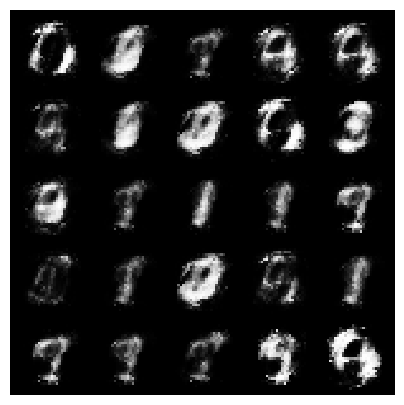

[Epoch 30/200] [Batch 860/938] [D loss: -0.423552] [G loss: -3.465811]


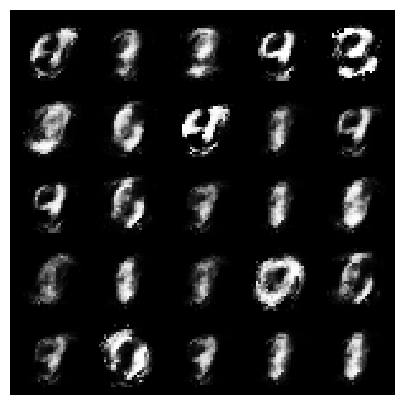

[Epoch 31/200] [Batch 422/938] [D loss: -0.339830] [G loss: -2.410283]


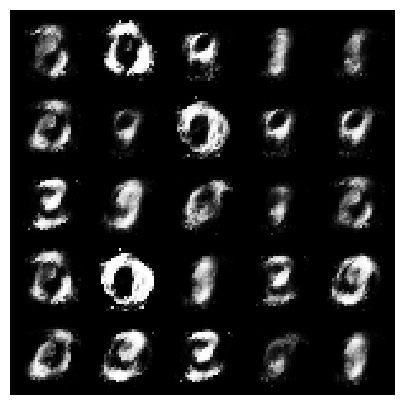

[Epoch 31/200] [Batch 922/938] [D loss: -0.269452] [G loss: -3.428795]


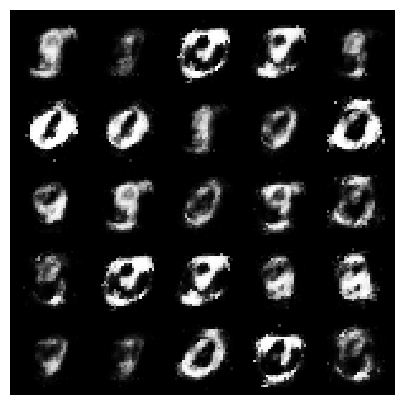

[Epoch 32/200] [Batch 484/938] [D loss: -0.277565] [G loss: -2.066403]


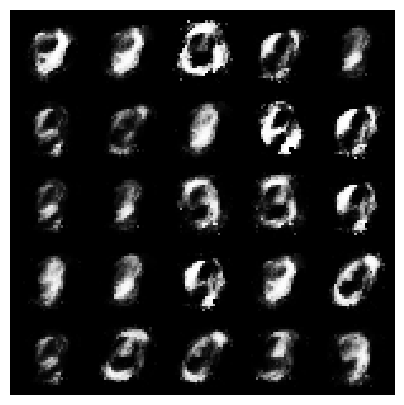

[Epoch 33/200] [Batch 46/938] [D loss: -0.506918] [G loss: -0.767694]


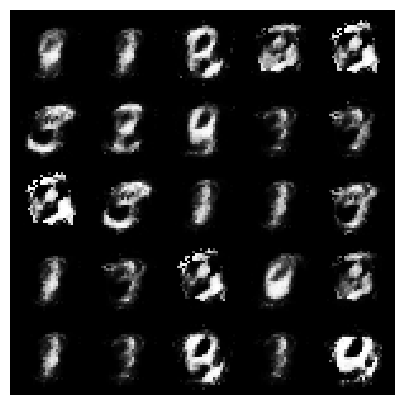

[Epoch 33/200] [Batch 546/938] [D loss: -0.580358] [G loss: -0.893254]


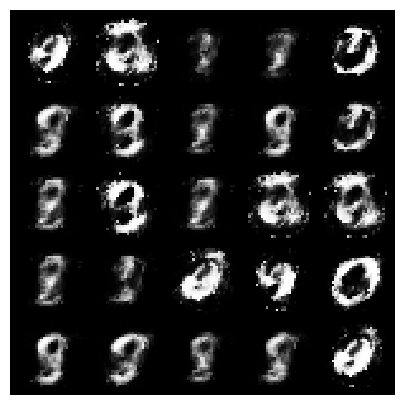

[Epoch 34/200] [Batch 108/938] [D loss: -0.669209] [G loss: -0.853493]


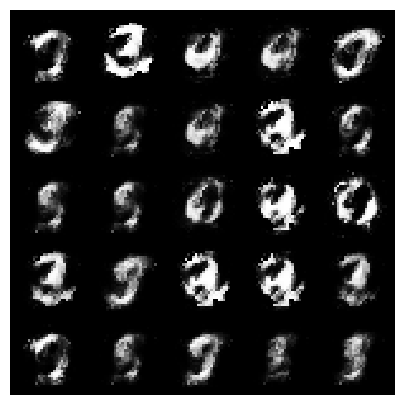

[Epoch 34/200] [Batch 608/938] [D loss: -0.367711] [G loss: -1.085744]


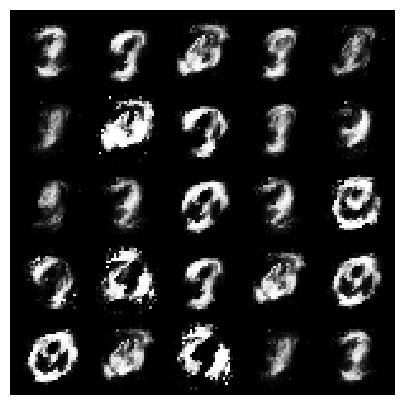

[Epoch 35/200] [Batch 170/938] [D loss: -0.693908] [G loss: -0.506201]


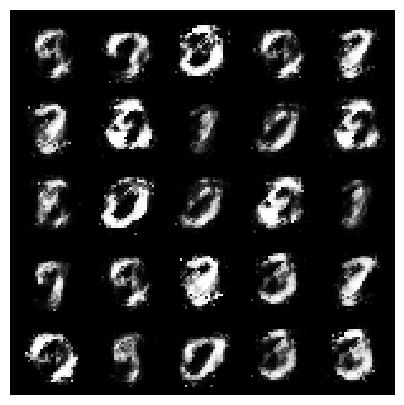

[Epoch 35/200] [Batch 670/938] [D loss: -0.480345] [G loss: -2.760305]


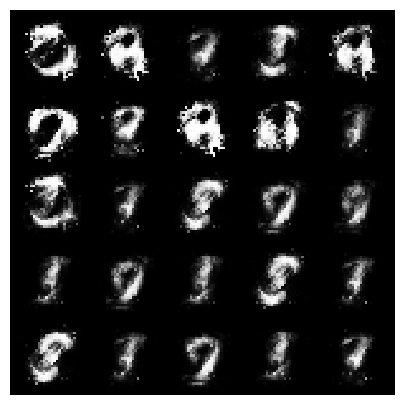

[Epoch 36/200] [Batch 232/938] [D loss: -0.391043] [G loss: -2.192301]


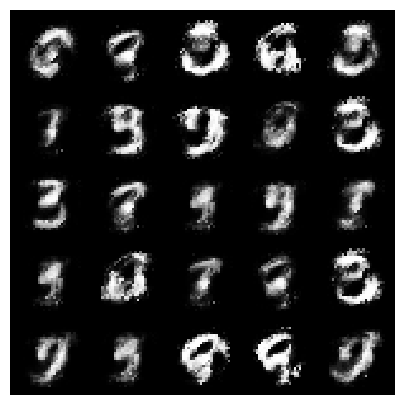

[Epoch 36/200] [Batch 732/938] [D loss: -0.277070] [G loss: -3.993250]


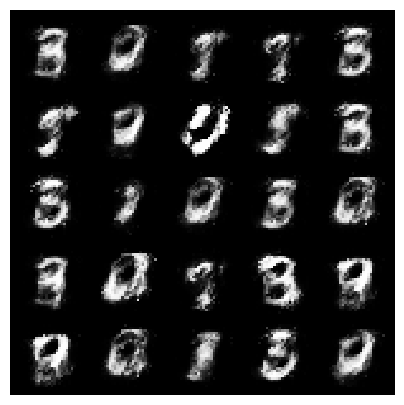

[Epoch 37/200] [Batch 294/938] [D loss: -0.360310] [G loss: -2.838739]


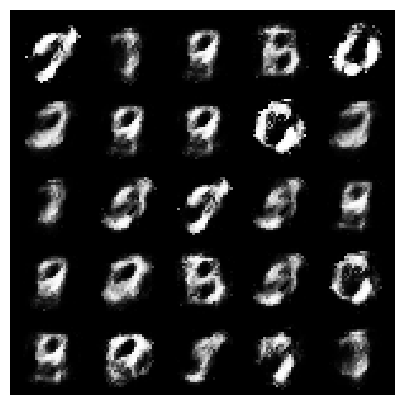

[Epoch 37/200] [Batch 794/938] [D loss: -0.304703] [G loss: -3.720319]


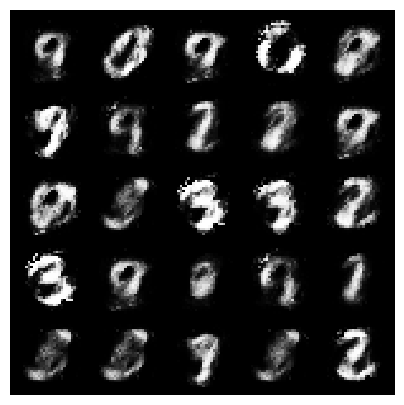

[Epoch 38/200] [Batch 356/938] [D loss: -0.334997] [G loss: -3.513422]


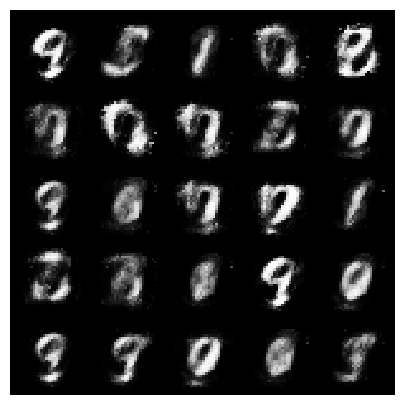

[Epoch 38/200] [Batch 856/938] [D loss: -0.252743] [G loss: -3.147965]


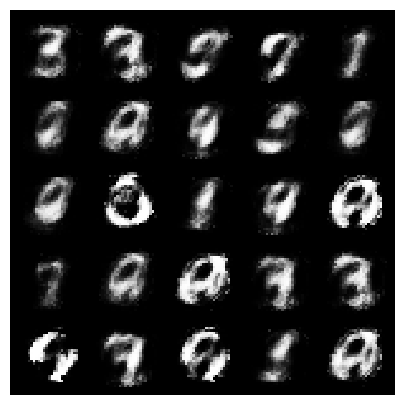

[Epoch 39/200] [Batch 418/938] [D loss: -0.350714] [G loss: -4.284936]


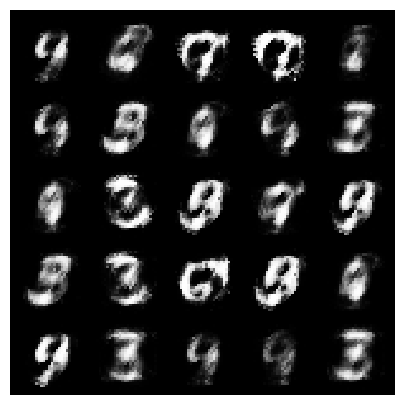

[Epoch 39/200] [Batch 918/938] [D loss: -0.232596] [G loss: -3.866484]


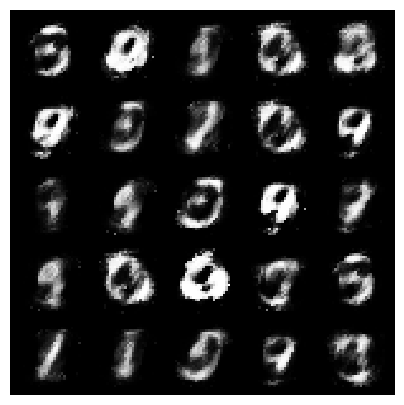

[Epoch 40/200] [Batch 480/938] [D loss: -0.300118] [G loss: -4.261154]


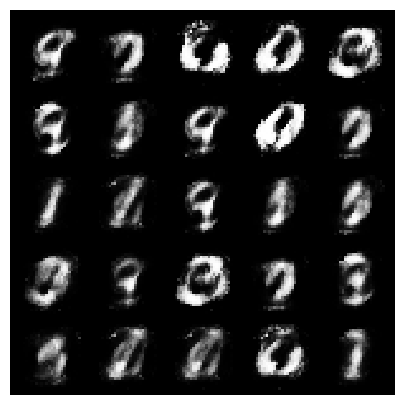

[Epoch 41/200] [Batch 42/938] [D loss: -0.248558] [G loss: -4.109397]


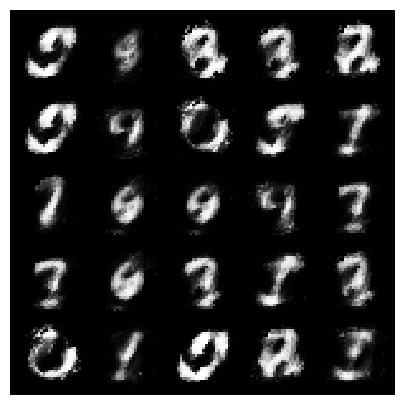

[Epoch 41/200] [Batch 542/938] [D loss: -0.245443] [G loss: -4.101246]


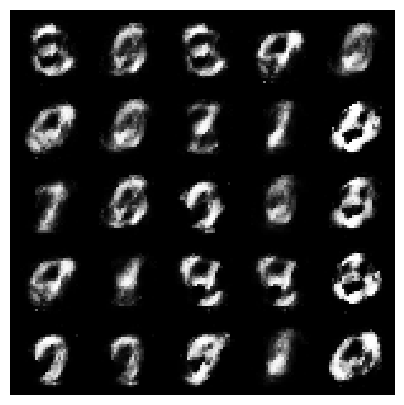

[Epoch 42/200] [Batch 104/938] [D loss: -0.304200] [G loss: -3.597631]


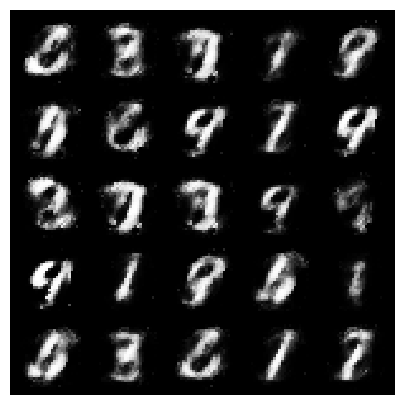

[Epoch 42/200] [Batch 604/938] [D loss: -0.257363] [G loss: -2.893029]


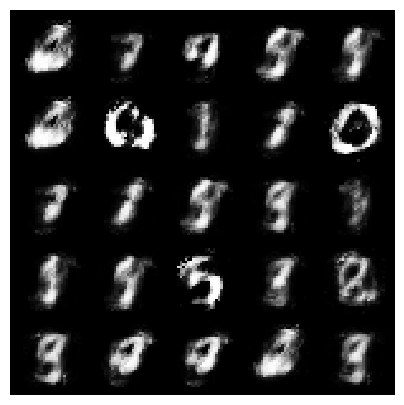

[Epoch 43/200] [Batch 166/938] [D loss: -0.241558] [G loss: -2.049103]


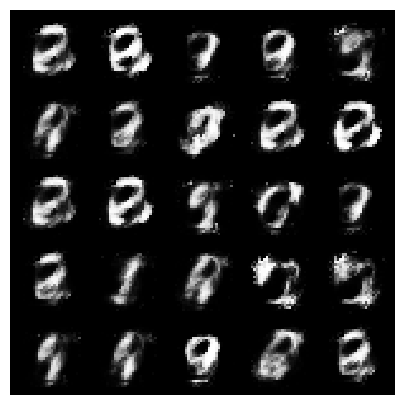

[Epoch 43/200] [Batch 666/938] [D loss: -0.291545] [G loss: -2.173616]


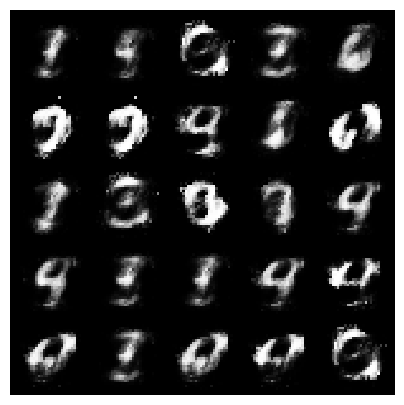

[Epoch 44/200] [Batch 228/938] [D loss: -0.404147] [G loss: -1.894531]


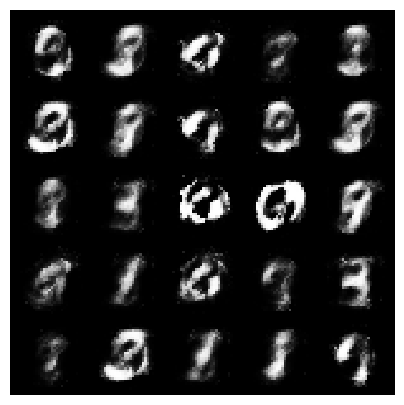

[Epoch 44/200] [Batch 728/938] [D loss: -0.366259] [G loss: -1.804617]


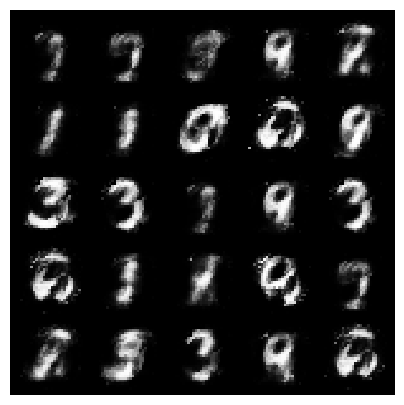

[Epoch 45/200] [Batch 290/938] [D loss: -0.342933] [G loss: -1.313170]


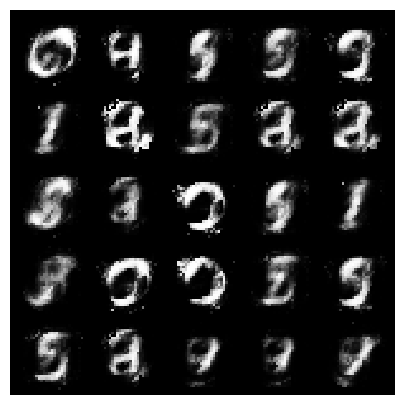

[Epoch 45/200] [Batch 790/938] [D loss: -0.387097] [G loss: -1.122923]


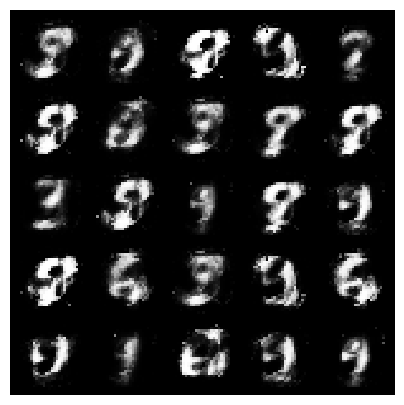

[Epoch 46/200] [Batch 352/938] [D loss: -0.250118] [G loss: -3.073639]


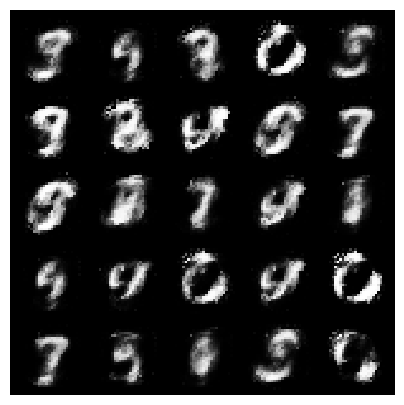

[Epoch 46/200] [Batch 852/938] [D loss: -0.287631] [G loss: -3.110222]


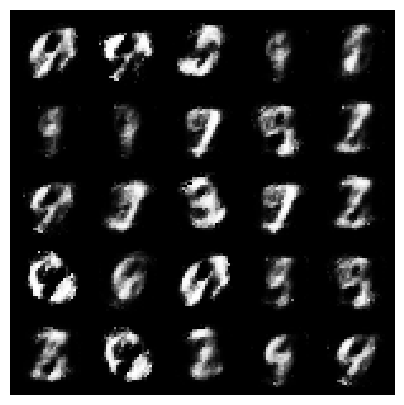

[Epoch 47/200] [Batch 414/938] [D loss: -0.284784] [G loss: -2.609860]


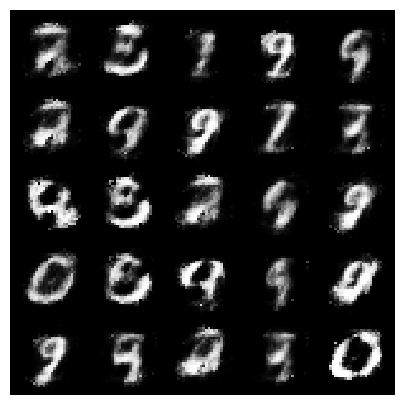

[Epoch 47/200] [Batch 914/938] [D loss: -0.316529] [G loss: -2.194305]


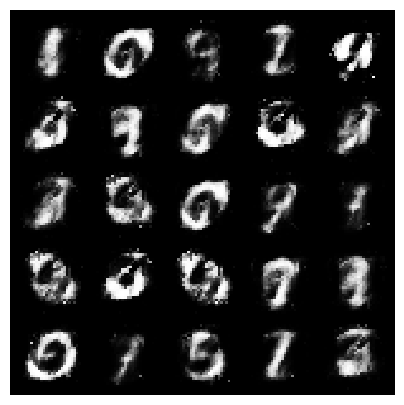

[Epoch 48/200] [Batch 476/938] [D loss: -0.315152] [G loss: -2.525846]


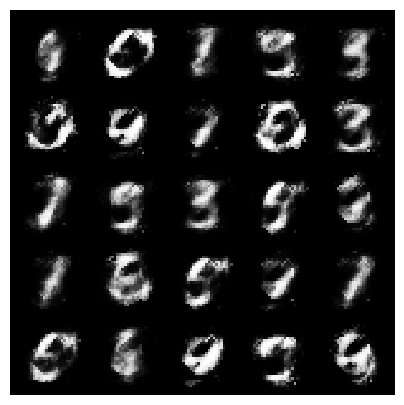

[Epoch 49/200] [Batch 38/938] [D loss: -0.272338] [G loss: -2.666872]


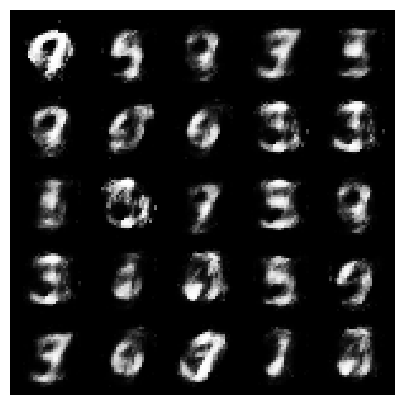

[Epoch 49/200] [Batch 538/938] [D loss: -0.264127] [G loss: -2.816926]


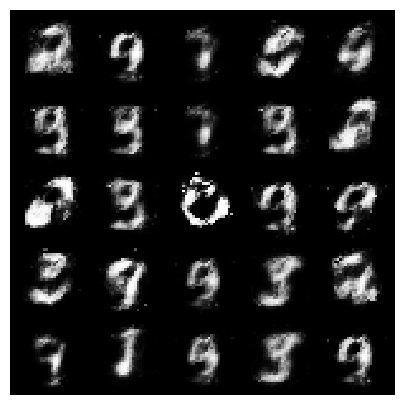

[Epoch 50/200] [Batch 100/938] [D loss: -0.279124] [G loss: -3.069254]


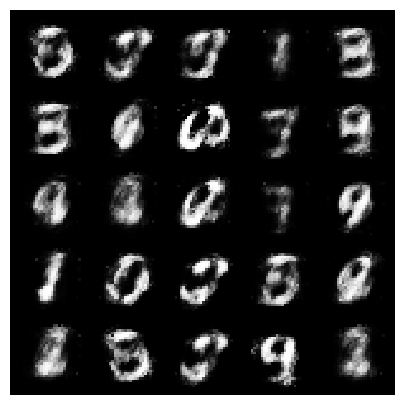

[Epoch 50/200] [Batch 600/938] [D loss: -0.232269] [G loss: -3.445710]


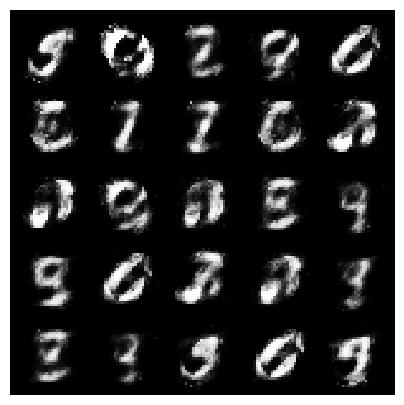

[Epoch 51/200] [Batch 162/938] [D loss: -0.241733] [G loss: -3.597558]


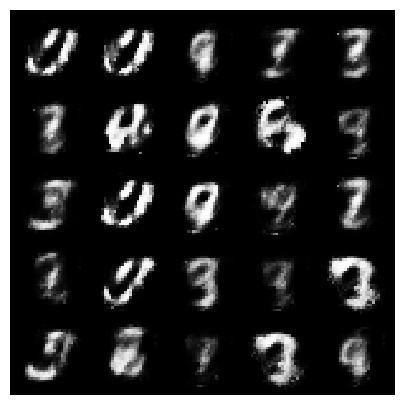

[Epoch 51/200] [Batch 662/938] [D loss: -0.287944] [G loss: -3.811441]


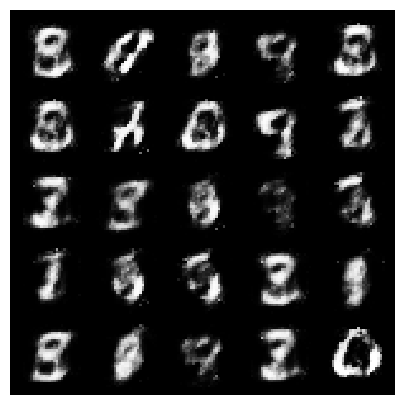

[Epoch 52/200] [Batch 224/938] [D loss: -0.216733] [G loss: -2.142777]


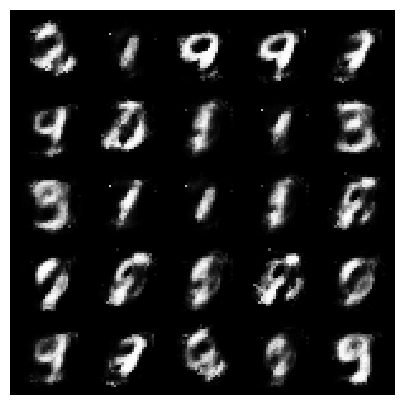

[Epoch 52/200] [Batch 724/938] [D loss: -0.305644] [G loss: -3.563474]


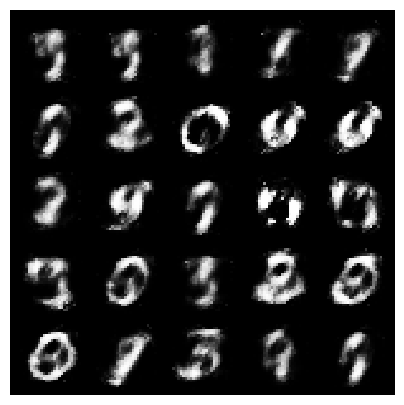

[Epoch 53/200] [Batch 286/938] [D loss: -0.191308] [G loss: -4.182423]


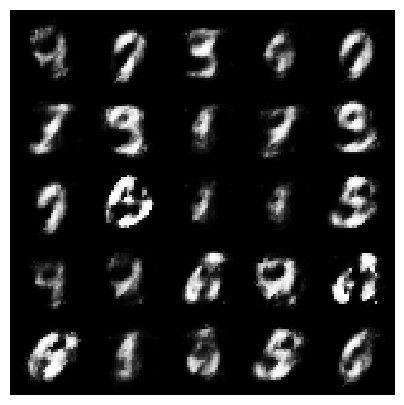

[Epoch 53/200] [Batch 786/938] [D loss: -0.213902] [G loss: -3.520652]


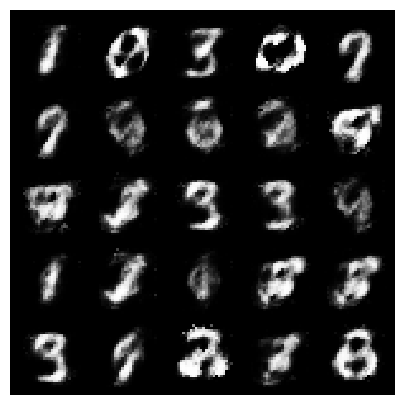

[Epoch 54/200] [Batch 348/938] [D loss: -0.165608] [G loss: -3.505435]


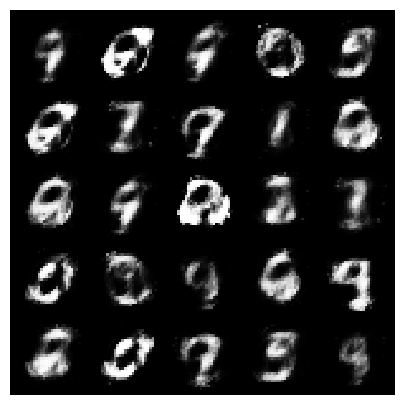

[Epoch 54/200] [Batch 848/938] [D loss: -0.198297] [G loss: -3.661851]


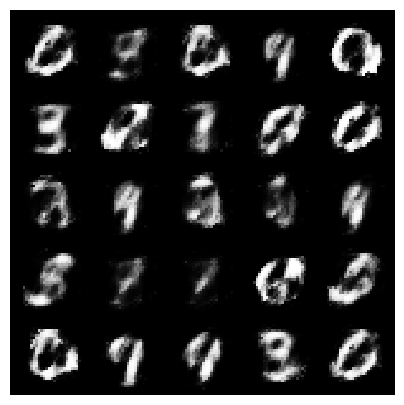

[Epoch 55/200] [Batch 410/938] [D loss: -0.226111] [G loss: -3.242201]


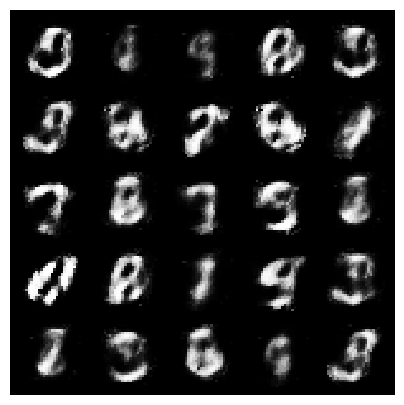

[Epoch 55/200] [Batch 910/938] [D loss: -0.232433] [G loss: -4.258153]


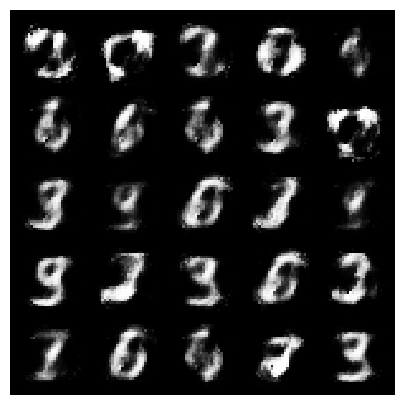

[Epoch 56/200] [Batch 472/938] [D loss: -0.274258] [G loss: -4.384624]


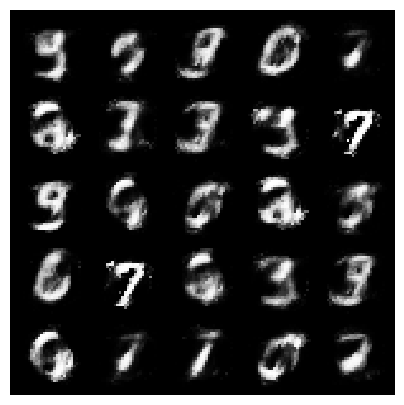

[Epoch 57/200] [Batch 34/938] [D loss: -0.284774] [G loss: -4.382177]


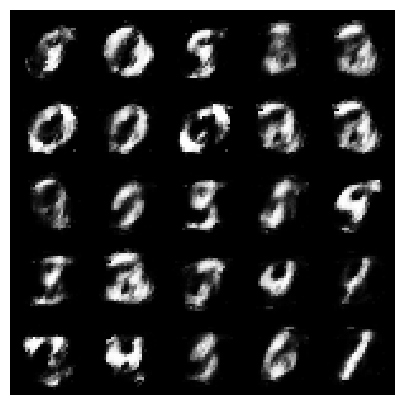

[Epoch 57/200] [Batch 534/938] [D loss: -0.275031] [G loss: -4.592588]


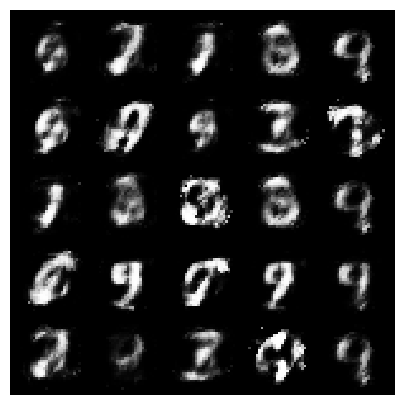

[Epoch 58/200] [Batch 96/938] [D loss: -0.192676] [G loss: -4.479343]


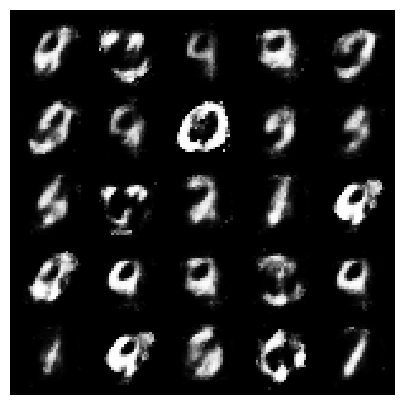

[Epoch 58/200] [Batch 596/938] [D loss: -0.211144] [G loss: -3.771209]


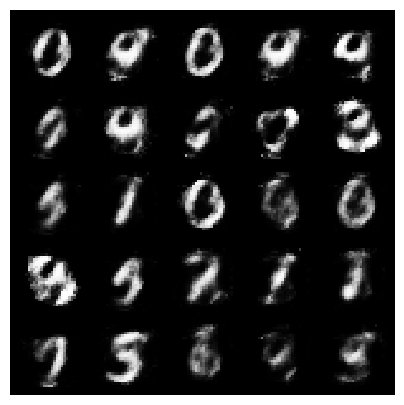

[Epoch 59/200] [Batch 158/938] [D loss: -0.197193] [G loss: -3.031301]


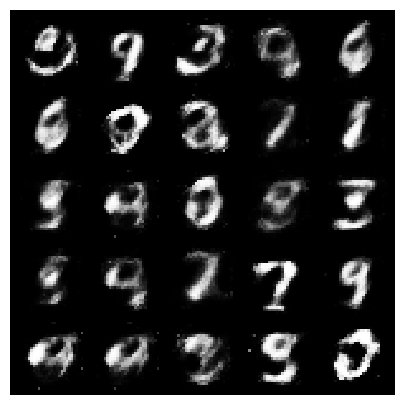

[Epoch 59/200] [Batch 658/938] [D loss: -0.265826] [G loss: -3.476936]


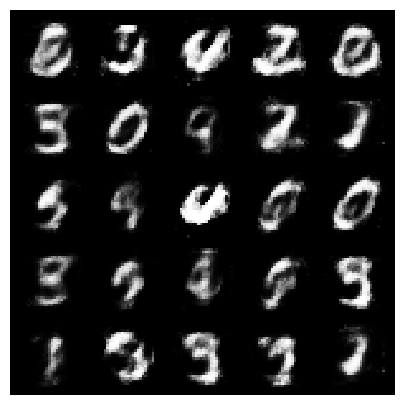

[Epoch 60/200] [Batch 220/938] [D loss: -0.281149] [G loss: -3.124855]


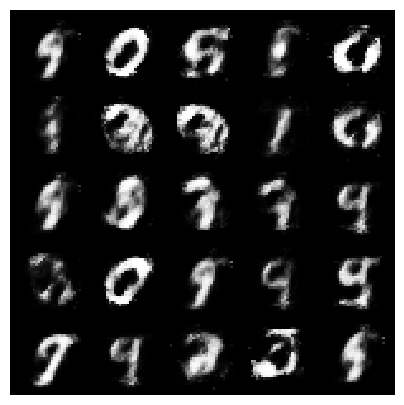

[Epoch 60/200] [Batch 720/938] [D loss: -0.221190] [G loss: -2.837796]


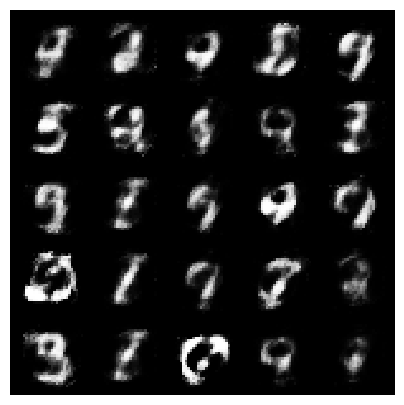

[Epoch 61/200] [Batch 282/938] [D loss: -0.189287] [G loss: -3.334050]


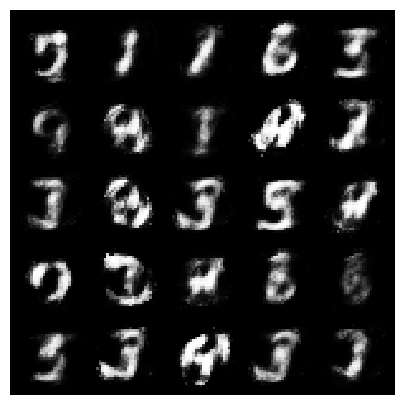

[Epoch 61/200] [Batch 782/938] [D loss: -0.223583] [G loss: -2.820085]


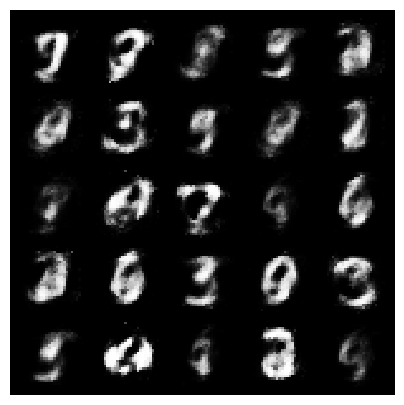

[Epoch 62/200] [Batch 344/938] [D loss: -0.171957] [G loss: -4.005122]


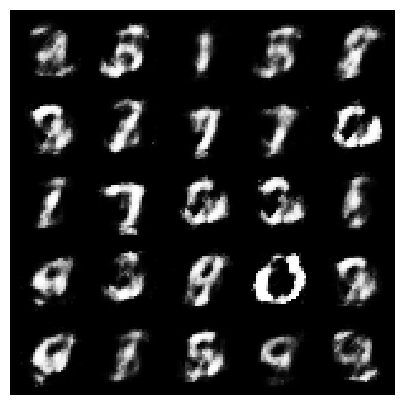

[Epoch 62/200] [Batch 844/938] [D loss: -0.166485] [G loss: -3.561550]


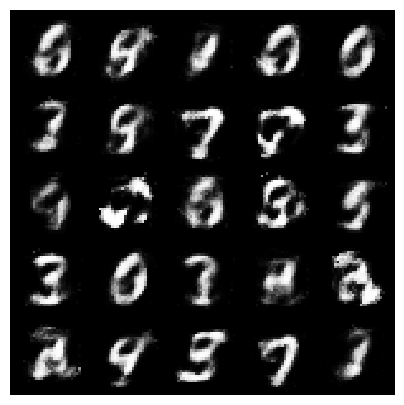

[Epoch 63/200] [Batch 406/938] [D loss: -0.157825] [G loss: -2.797442]


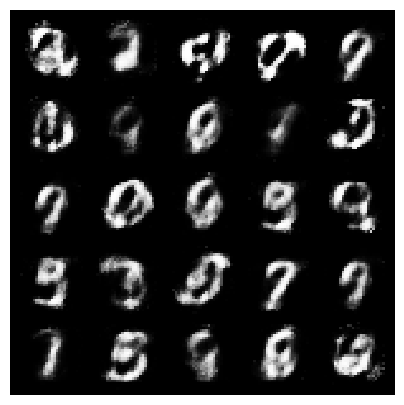

[Epoch 63/200] [Batch 906/938] [D loss: -0.191473] [G loss: -3.540522]


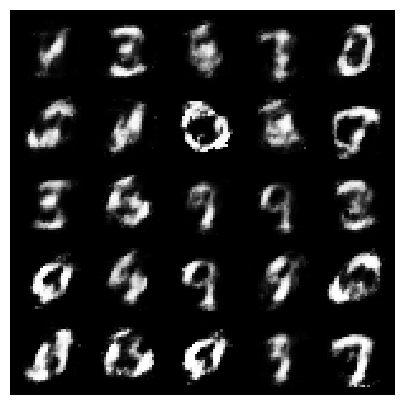

[Epoch 64/200] [Batch 468/938] [D loss: -0.184990] [G loss: -3.177190]


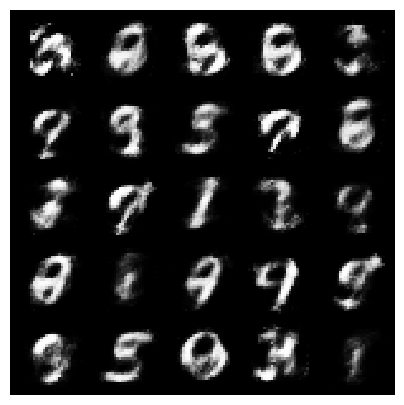

[Epoch 65/200] [Batch 30/938] [D loss: -0.190506] [G loss: -3.430624]


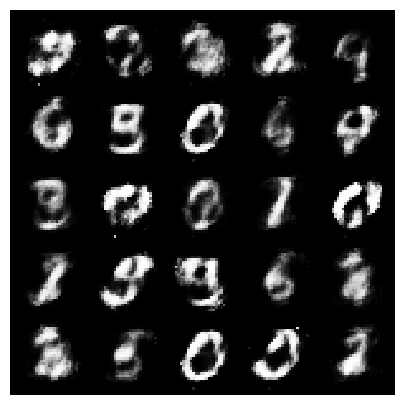

[Epoch 65/200] [Batch 530/938] [D loss: -0.191623] [G loss: -4.187830]


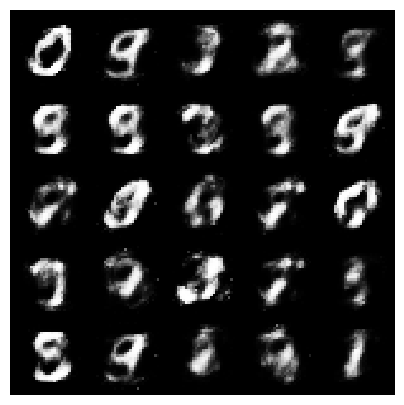

[Epoch 66/200] [Batch 92/938] [D loss: -0.185258] [G loss: -3.161025]


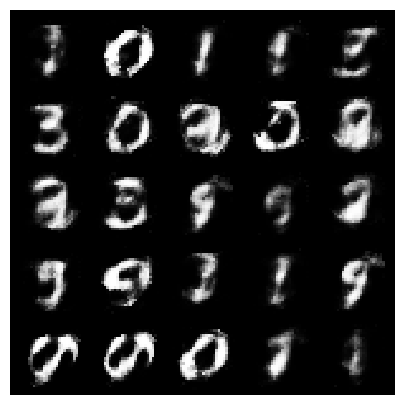

[Epoch 66/200] [Batch 592/938] [D loss: -0.144958] [G loss: -4.513762]


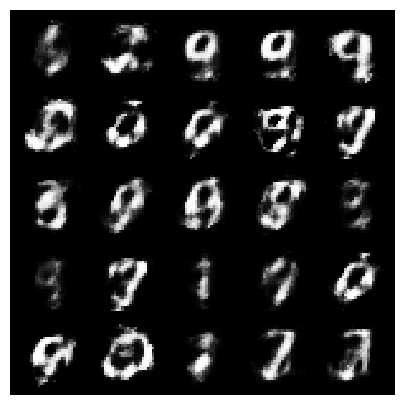

[Epoch 67/200] [Batch 154/938] [D loss: -0.164100] [G loss: -3.944257]


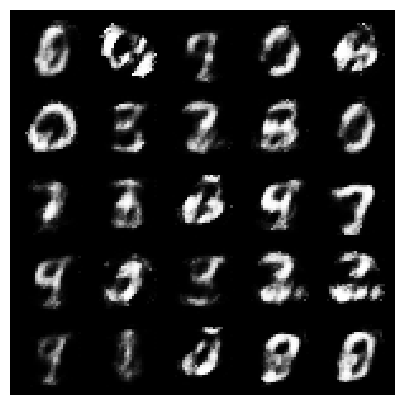

[Epoch 67/200] [Batch 654/938] [D loss: -0.189238] [G loss: -3.743164]


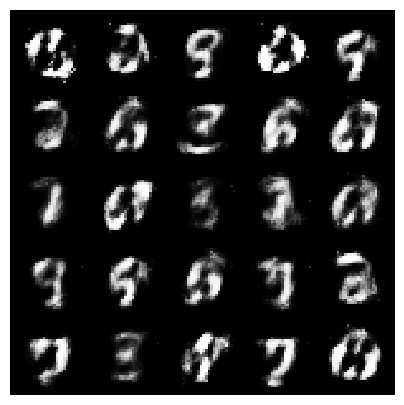

[Epoch 68/200] [Batch 216/938] [D loss: -0.162791] [G loss: -4.103240]


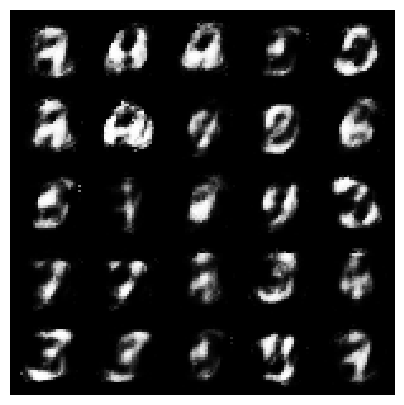

[Epoch 68/200] [Batch 716/938] [D loss: -0.194600] [G loss: -4.211327]


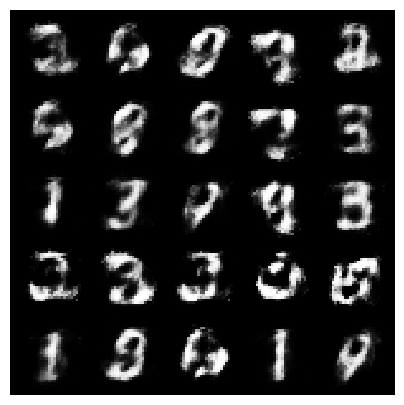

[Epoch 69/200] [Batch 278/938] [D loss: -0.181612] [G loss: -4.228100]


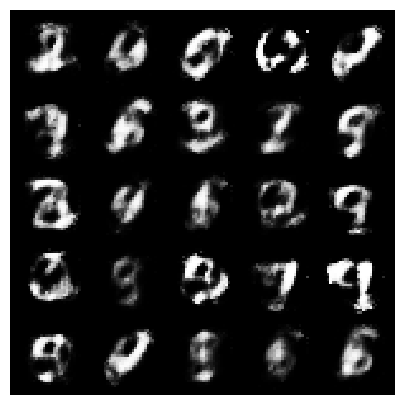

[Epoch 69/200] [Batch 778/938] [D loss: -0.205478] [G loss: -4.519751]


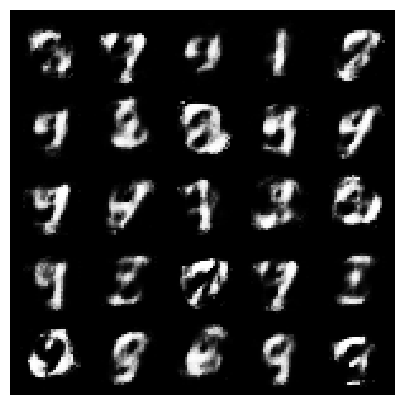

[Epoch 70/200] [Batch 340/938] [D loss: -0.218082] [G loss: -4.678823]


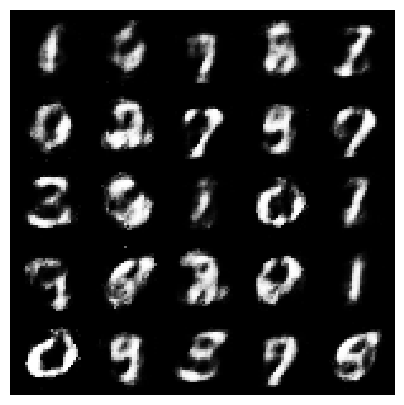

[Epoch 70/200] [Batch 840/938] [D loss: -0.187201] [G loss: -4.491607]


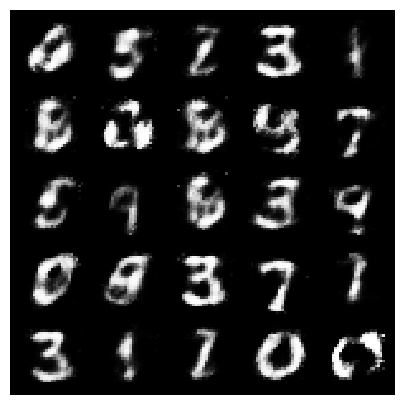

[Epoch 71/200] [Batch 402/938] [D loss: -0.142167] [G loss: -4.548139]


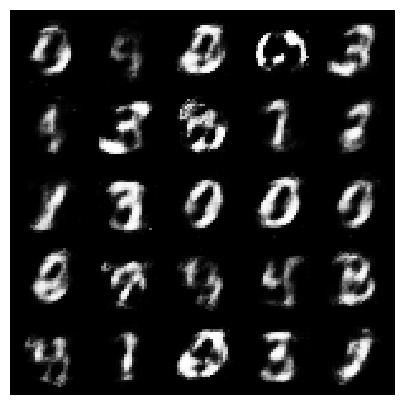

[Epoch 71/200] [Batch 902/938] [D loss: -0.167606] [G loss: -4.793099]


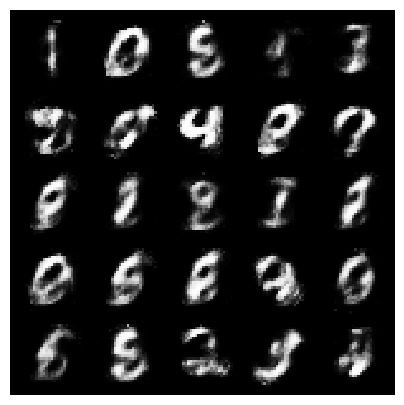

[Epoch 72/200] [Batch 464/938] [D loss: -0.150728] [G loss: -4.116234]


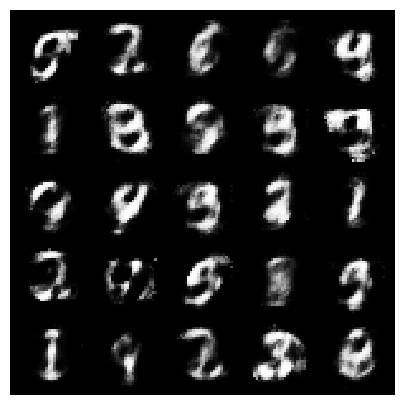

[Epoch 73/200] [Batch 26/938] [D loss: -0.194616] [G loss: -4.710905]


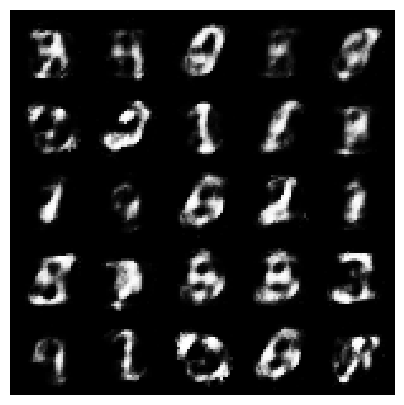

[Epoch 73/200] [Batch 526/938] [D loss: -0.106046] [G loss: -4.801780]


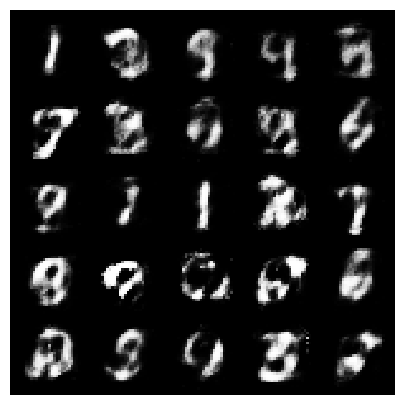

[Epoch 74/200] [Batch 88/938] [D loss: -0.130024] [G loss: -4.717573]


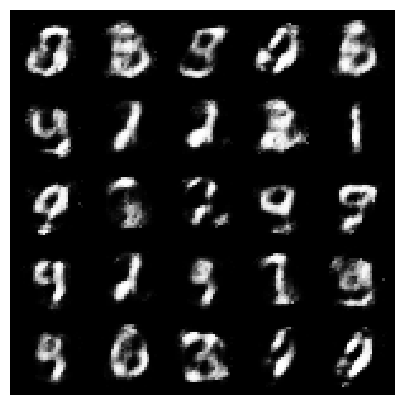

[Epoch 74/200] [Batch 588/938] [D loss: -0.173835] [G loss: -4.649644]


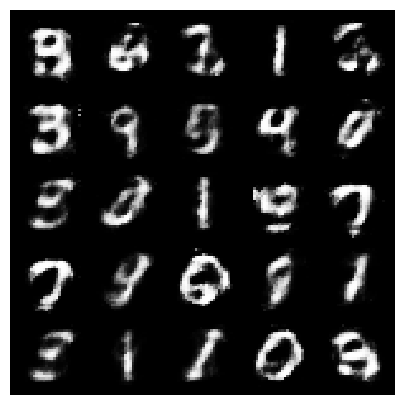

[Epoch 75/200] [Batch 150/938] [D loss: -0.167877] [G loss: -4.499935]


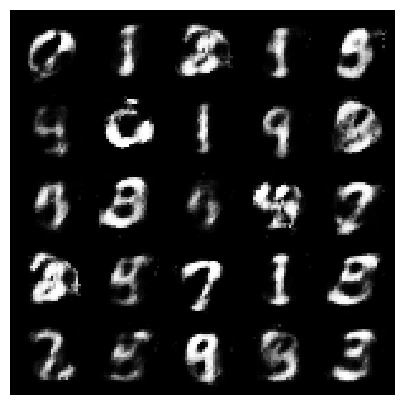

[Epoch 75/200] [Batch 650/938] [D loss: -0.181431] [G loss: -4.782634]


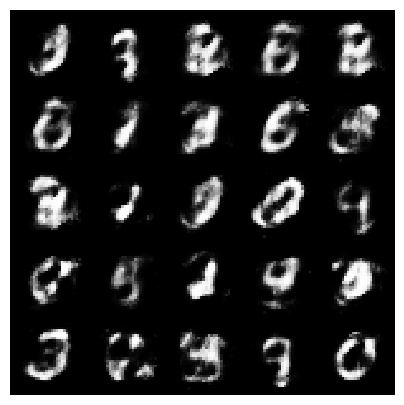

[Epoch 76/200] [Batch 212/938] [D loss: -0.132374] [G loss: -5.050508]


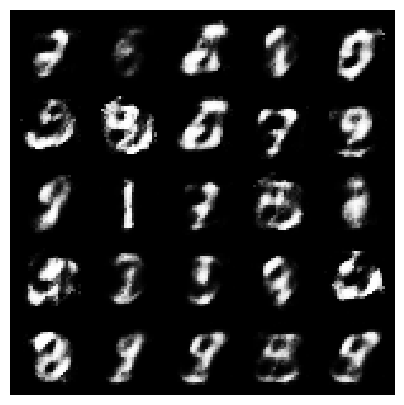

[Epoch 76/200] [Batch 712/938] [D loss: -0.136943] [G loss: -5.142308]


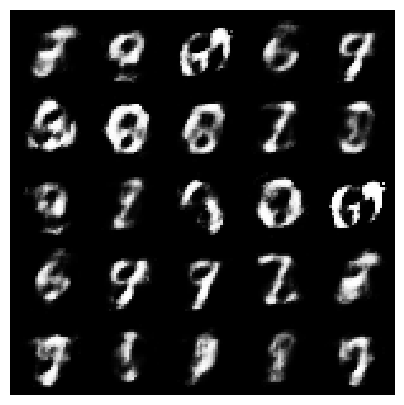

[Epoch 77/200] [Batch 274/938] [D loss: -0.109912] [G loss: -4.127256]


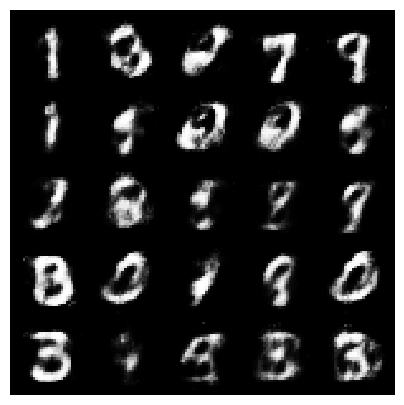

[Epoch 77/200] [Batch 774/938] [D loss: -0.155176] [G loss: -4.405518]


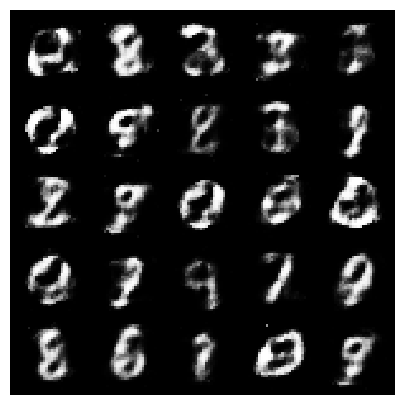

[Epoch 78/200] [Batch 336/938] [D loss: -0.162429] [G loss: -3.614927]


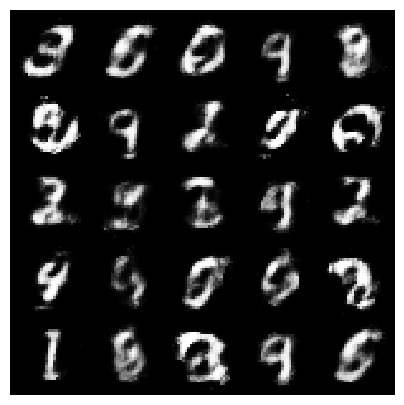

[Epoch 78/200] [Batch 836/938] [D loss: -0.156999] [G loss: -4.763999]


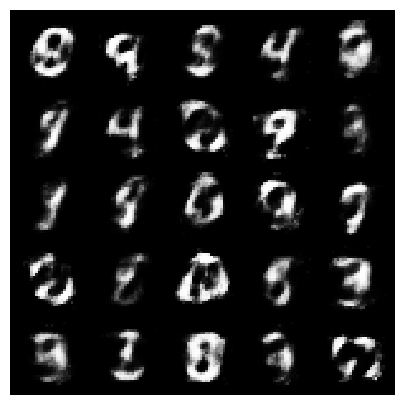

[Epoch 79/200] [Batch 398/938] [D loss: -0.216570] [G loss: -4.498606]


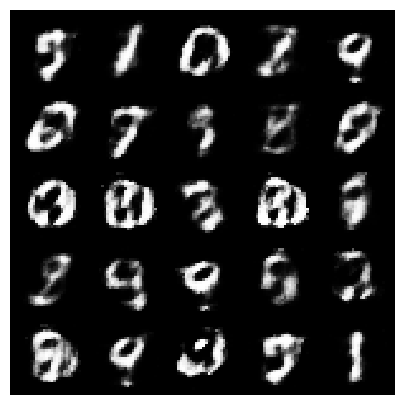

[Epoch 79/200] [Batch 898/938] [D loss: -0.124717] [G loss: -4.551280]


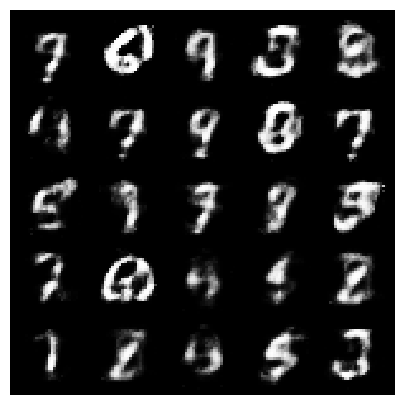

[Epoch 80/200] [Batch 460/938] [D loss: -0.125457] [G loss: -5.030302]


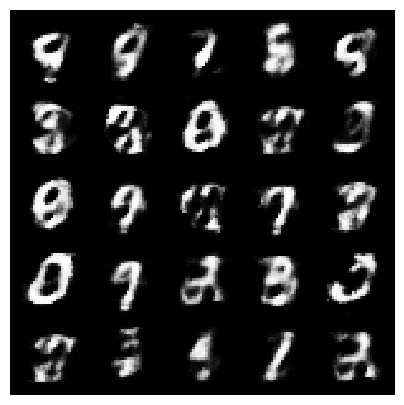

[Epoch 81/200] [Batch 22/938] [D loss: -0.188290] [G loss: -4.048461]


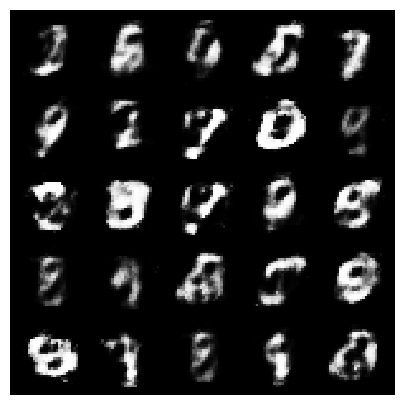

[Epoch 81/200] [Batch 522/938] [D loss: -0.181953] [G loss: -3.386497]


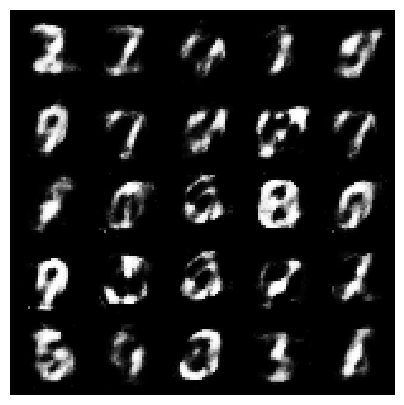

[Epoch 82/200] [Batch 84/938] [D loss: -0.151404] [G loss: -3.738971]


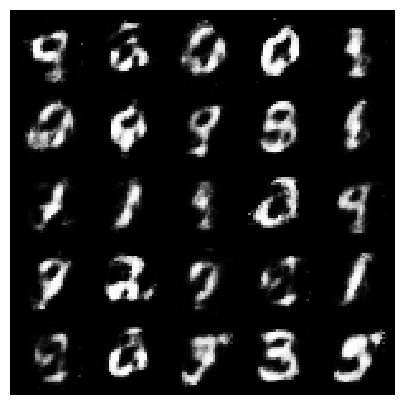

[Epoch 82/200] [Batch 584/938] [D loss: -0.180054] [G loss: -3.704653]


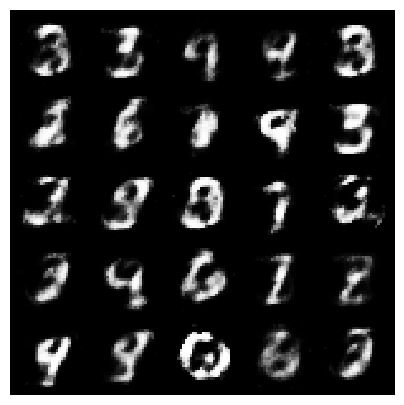

[Epoch 83/200] [Batch 146/938] [D loss: -0.147535] [G loss: -3.035321]


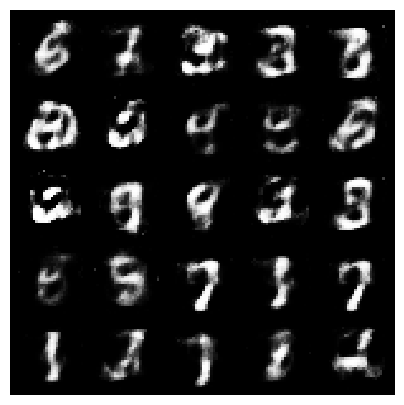

[Epoch 83/200] [Batch 646/938] [D loss: -0.164487] [G loss: -4.148470]


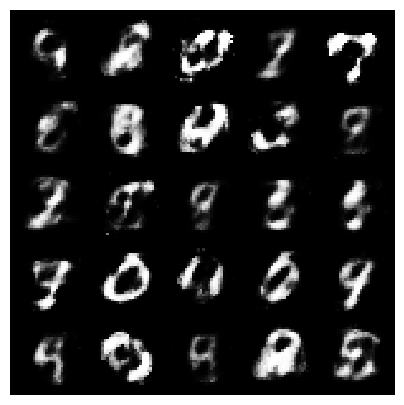

[Epoch 84/200] [Batch 208/938] [D loss: -0.133643] [G loss: -4.031403]


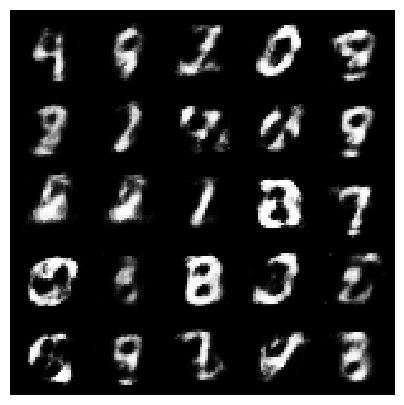

[Epoch 84/200] [Batch 708/938] [D loss: -0.140533] [G loss: -3.782279]


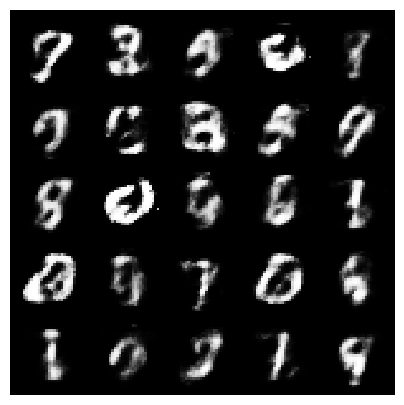

[Epoch 85/200] [Batch 270/938] [D loss: -0.140407] [G loss: -3.392121]


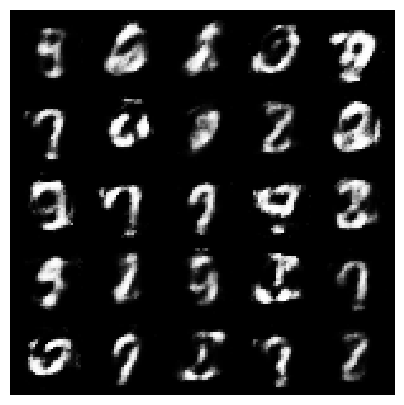

[Epoch 85/200] [Batch 770/938] [D loss: -0.133768] [G loss: -4.126522]


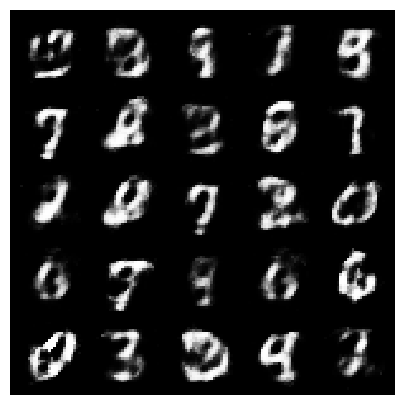

[Epoch 86/200] [Batch 332/938] [D loss: -0.127343] [G loss: -3.751041]


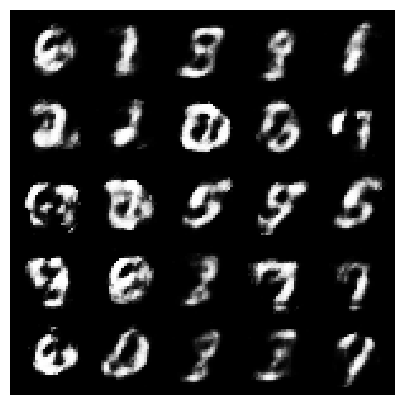

[Epoch 86/200] [Batch 832/938] [D loss: -0.124952] [G loss: -3.888916]


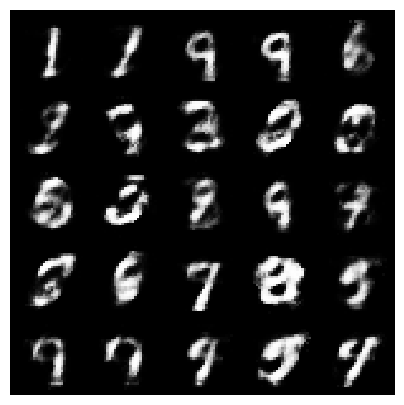

[Epoch 87/200] [Batch 394/938] [D loss: -0.134700] [G loss: -4.421402]


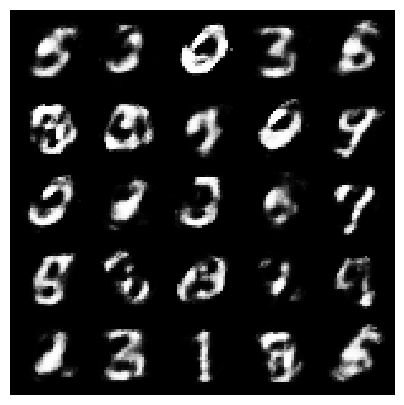

[Epoch 87/200] [Batch 894/938] [D loss: -0.156721] [G loss: -4.090829]


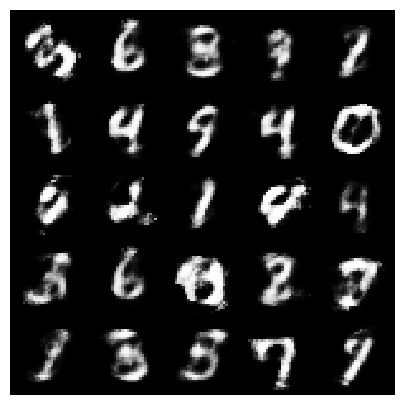

[Epoch 88/200] [Batch 456/938] [D loss: -0.114038] [G loss: -3.961365]


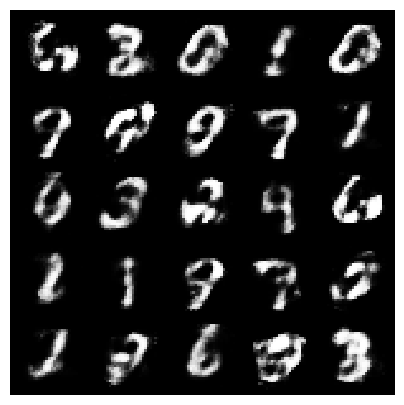

[Epoch 89/200] [Batch 18/938] [D loss: -0.147096] [G loss: -4.660903]


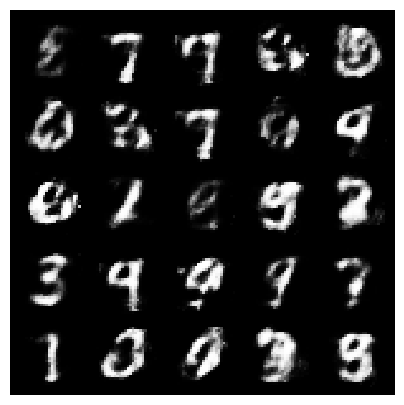

[Epoch 89/200] [Batch 518/938] [D loss: -0.130707] [G loss: -4.034579]


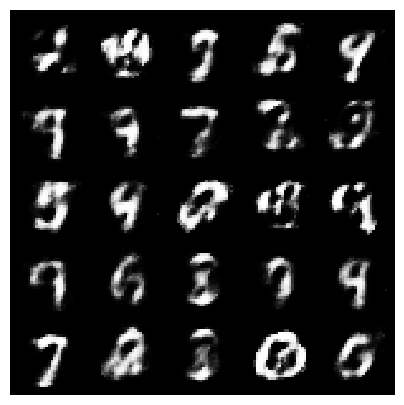

[Epoch 90/200] [Batch 80/938] [D loss: -0.148150] [G loss: -3.464492]


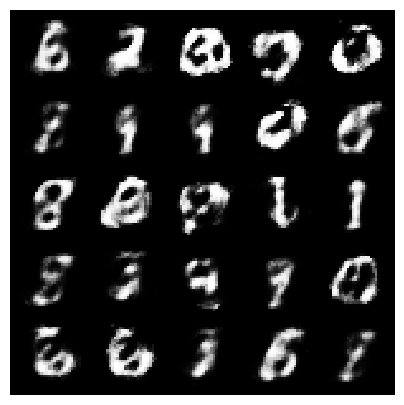

[Epoch 90/200] [Batch 580/938] [D loss: -0.136310] [G loss: -4.192008]


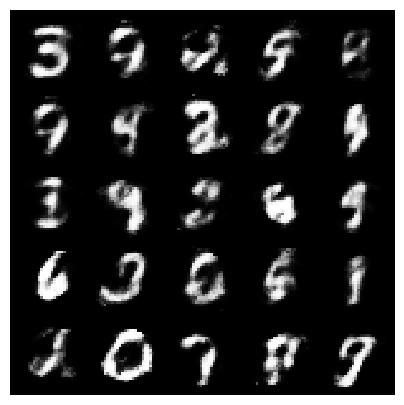

[Epoch 91/200] [Batch 142/938] [D loss: -0.137899] [G loss: -3.811539]


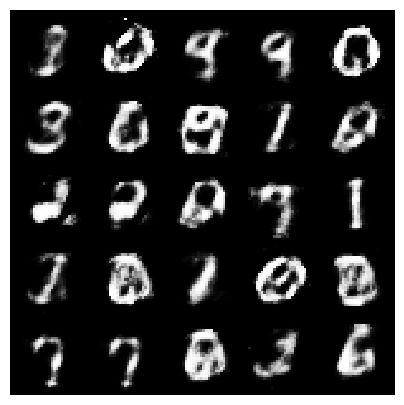

[Epoch 91/200] [Batch 642/938] [D loss: -0.116328] [G loss: -3.387240]


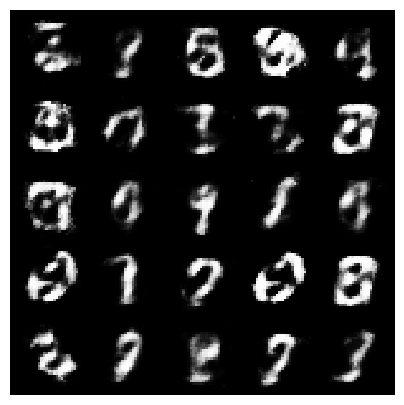

[Epoch 92/200] [Batch 204/938] [D loss: -0.114544] [G loss: -3.621434]


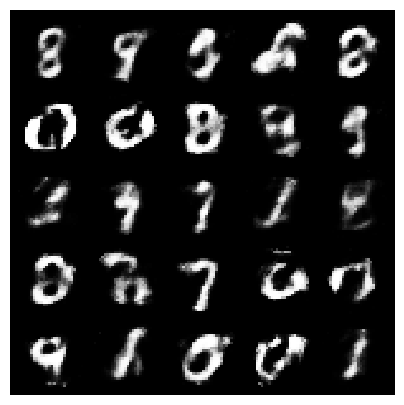

[Epoch 92/200] [Batch 704/938] [D loss: -0.133267] [G loss: -3.360898]


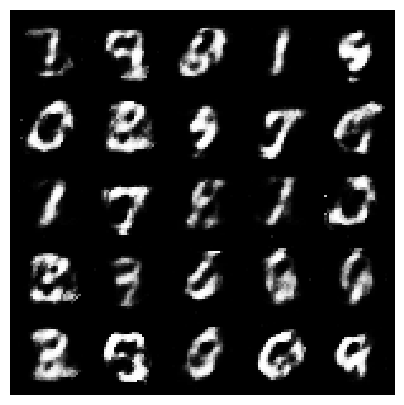

[Epoch 93/200] [Batch 266/938] [D loss: -0.137804] [G loss: -3.897723]


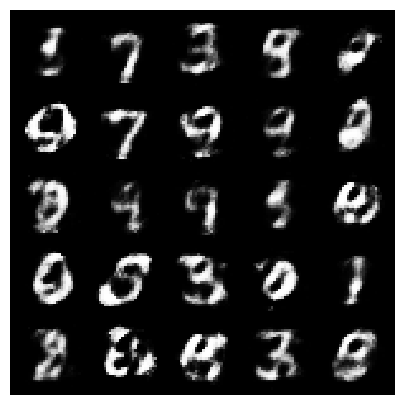

[Epoch 93/200] [Batch 766/938] [D loss: -0.130236] [G loss: -3.841212]


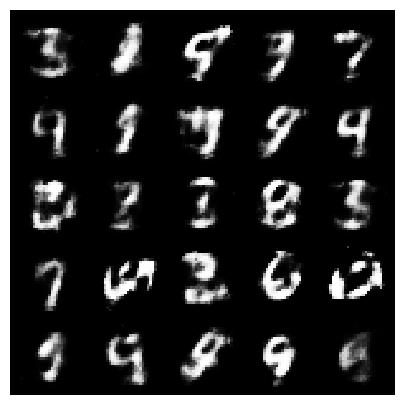

[Epoch 94/200] [Batch 328/938] [D loss: -0.136167] [G loss: -3.466473]


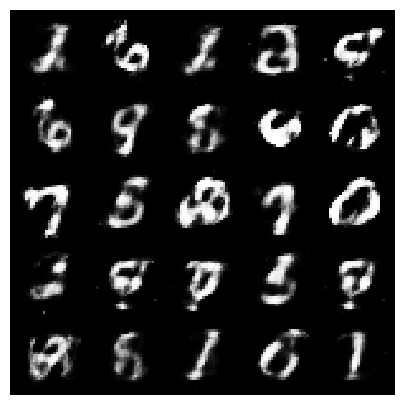

[Epoch 94/200] [Batch 828/938] [D loss: -0.124113] [G loss: -3.751715]


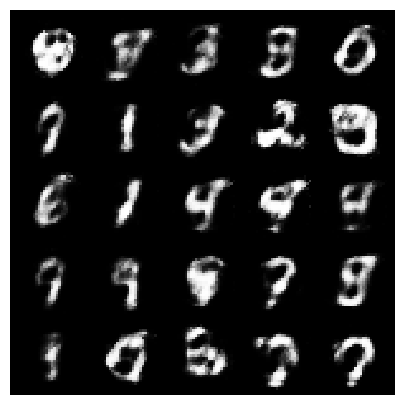

[Epoch 95/200] [Batch 390/938] [D loss: -0.097740] [G loss: -3.709918]


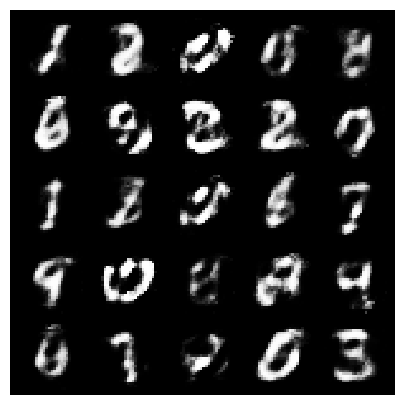

[Epoch 95/200] [Batch 890/938] [D loss: -0.111387] [G loss: -3.344726]


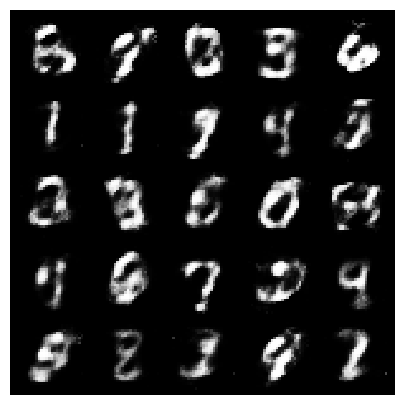

[Epoch 96/200] [Batch 452/938] [D loss: -0.118300] [G loss: -3.272062]


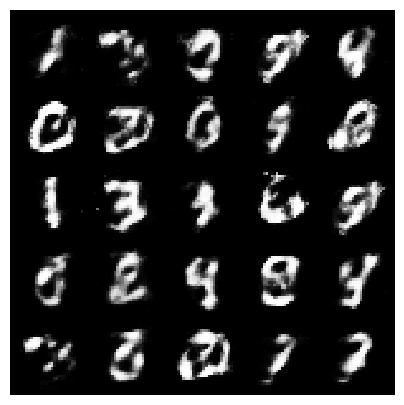

[Epoch 97/200] [Batch 14/938] [D loss: -0.139907] [G loss: -3.486379]


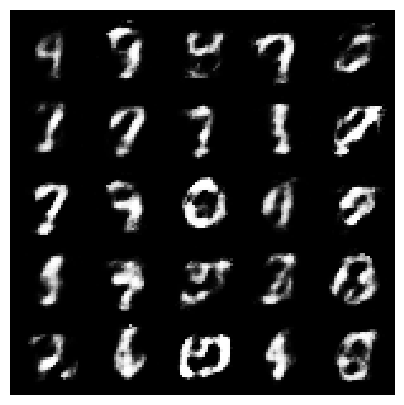

[Epoch 97/200] [Batch 514/938] [D loss: -0.108458] [G loss: -3.063905]


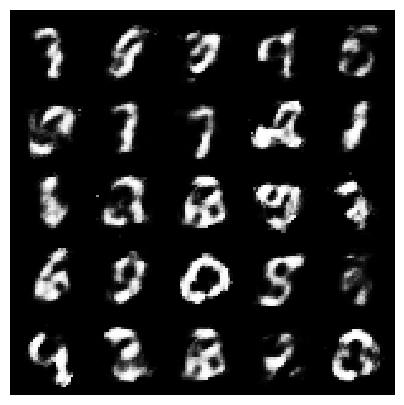

[Epoch 98/200] [Batch 76/938] [D loss: -0.131114] [G loss: -3.258337]


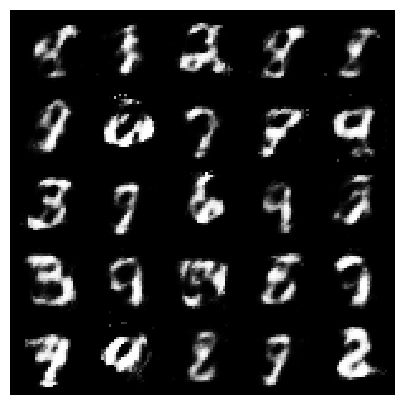

[Epoch 98/200] [Batch 576/938] [D loss: -0.113204] [G loss: -2.852127]


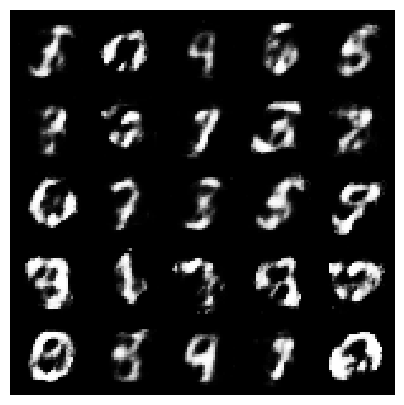

[Epoch 99/200] [Batch 138/938] [D loss: -0.120475] [G loss: -2.655931]


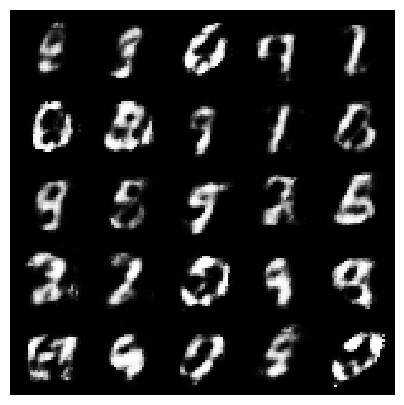

[Epoch 99/200] [Batch 638/938] [D loss: -0.110148] [G loss: -3.231841]


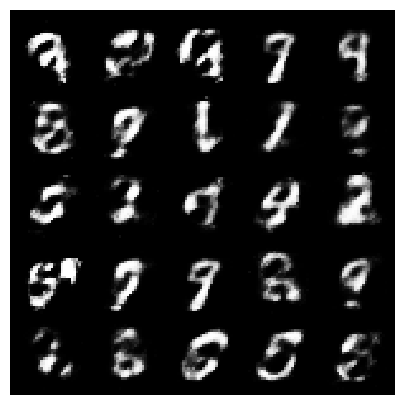

[Epoch 100/200] [Batch 200/938] [D loss: -0.118219] [G loss: -2.844955]


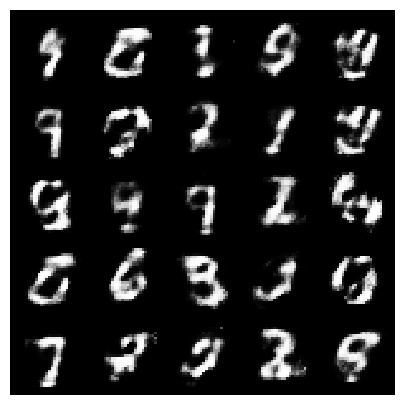

[Epoch 100/200] [Batch 700/938] [D loss: -0.127315] [G loss: -3.124195]


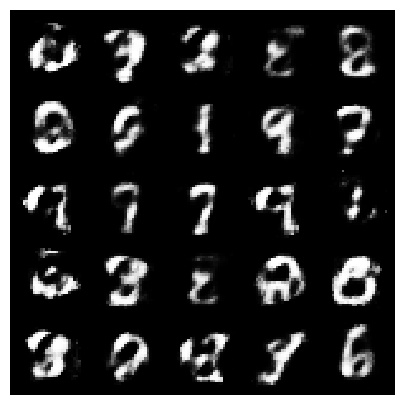

[Epoch 101/200] [Batch 262/938] [D loss: -0.104881] [G loss: -2.588333]


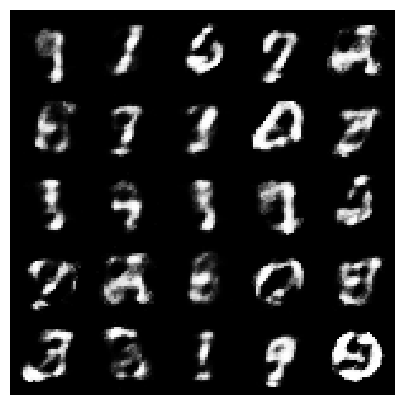

[Epoch 101/200] [Batch 762/938] [D loss: -0.125282] [G loss: -3.110993]


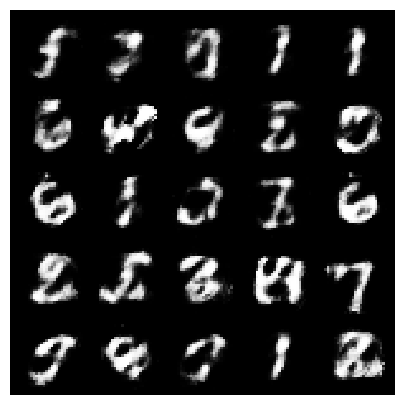

[Epoch 102/200] [Batch 324/938] [D loss: -0.149214] [G loss: -3.144822]


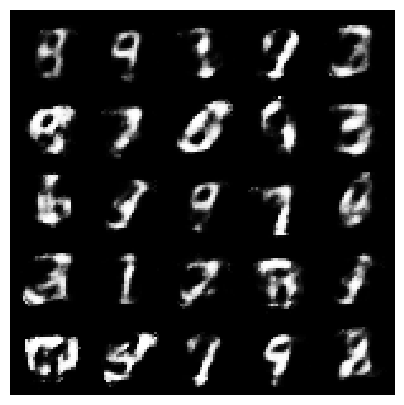

[Epoch 102/200] [Batch 824/938] [D loss: -0.118880] [G loss: -3.292541]


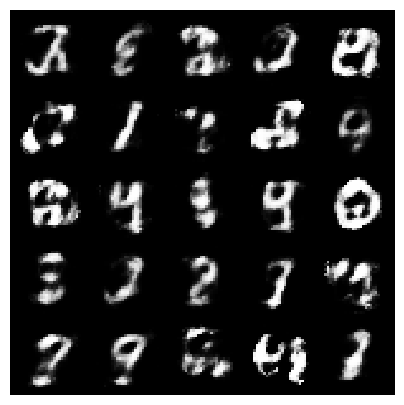

[Epoch 103/200] [Batch 386/938] [D loss: -0.106302] [G loss: -2.993748]


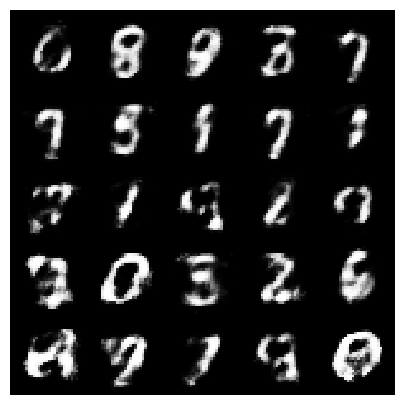

[Epoch 103/200] [Batch 886/938] [D loss: -0.119867] [G loss: -3.635733]


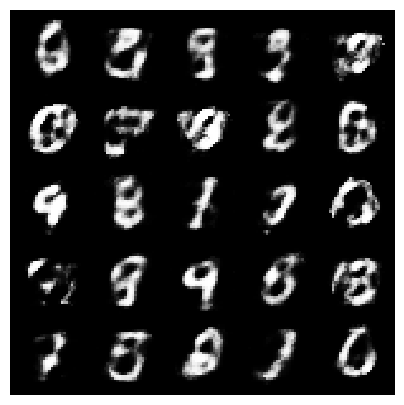

[Epoch 104/200] [Batch 448/938] [D loss: -0.125682] [G loss: -3.852804]


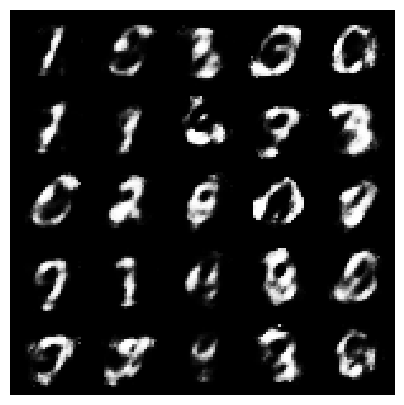

[Epoch 105/200] [Batch 10/938] [D loss: -0.109595] [G loss: -3.241215]


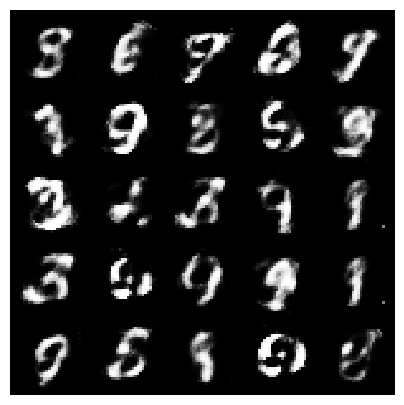

[Epoch 105/200] [Batch 510/938] [D loss: -0.105885] [G loss: -3.762444]


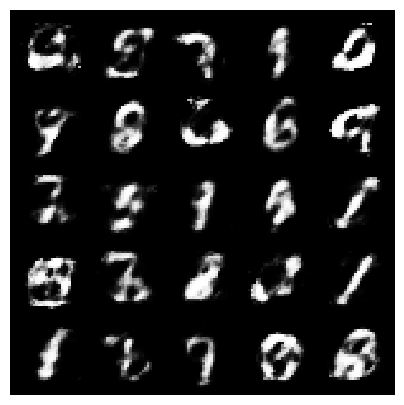

[Epoch 106/200] [Batch 72/938] [D loss: -0.118253] [G loss: -3.839131]


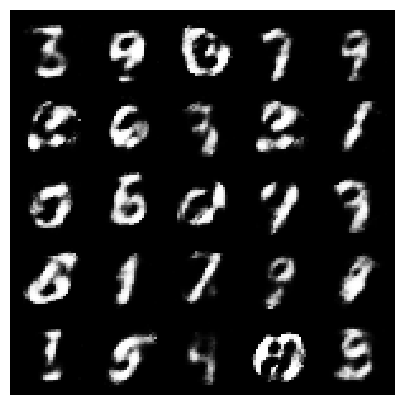

[Epoch 106/200] [Batch 572/938] [D loss: -0.092792] [G loss: -4.014191]


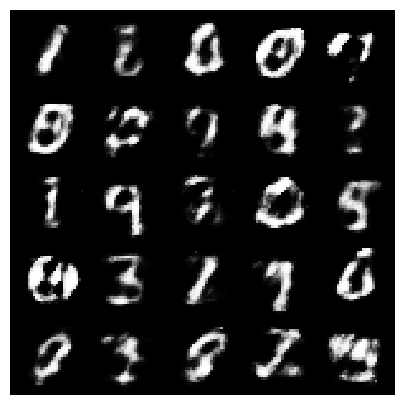

[Epoch 107/200] [Batch 134/938] [D loss: -0.101584] [G loss: -3.776499]


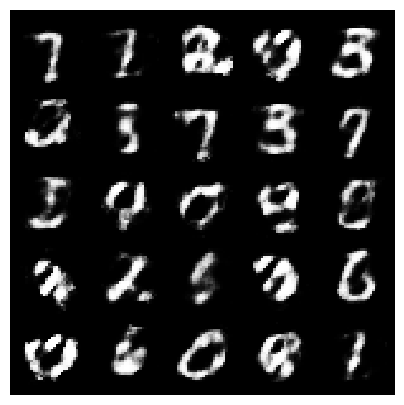

[Epoch 107/200] [Batch 634/938] [D loss: -0.088532] [G loss: -3.832967]


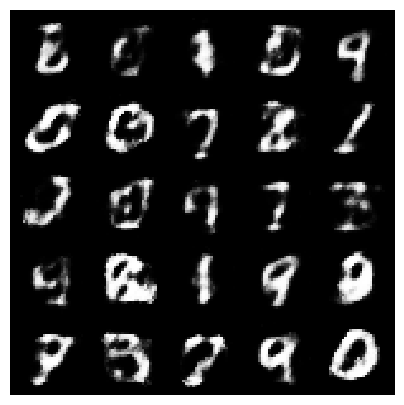

[Epoch 108/200] [Batch 196/938] [D loss: -0.096566] [G loss: -4.290102]


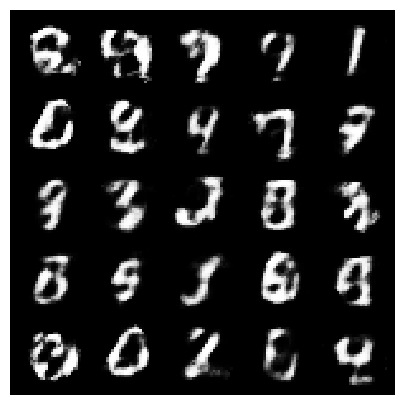

[Epoch 108/200] [Batch 696/938] [D loss: -0.088599] [G loss: -3.823772]


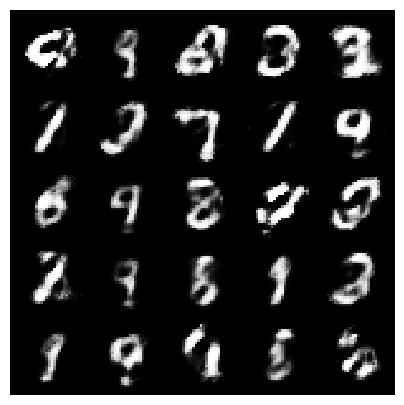

[Epoch 109/200] [Batch 258/938] [D loss: -0.117846] [G loss: -4.117982]


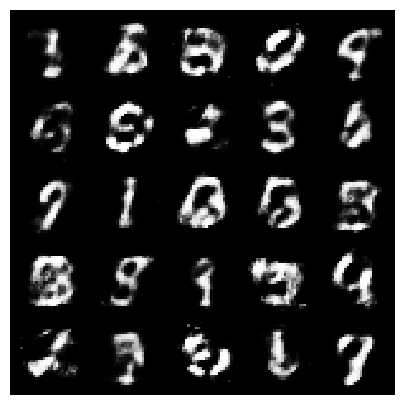

[Epoch 109/200] [Batch 758/938] [D loss: -0.119395] [G loss: -3.754492]


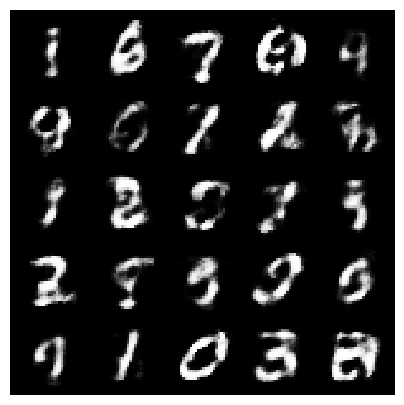

[Epoch 110/200] [Batch 320/938] [D loss: -0.098525] [G loss: -3.580319]


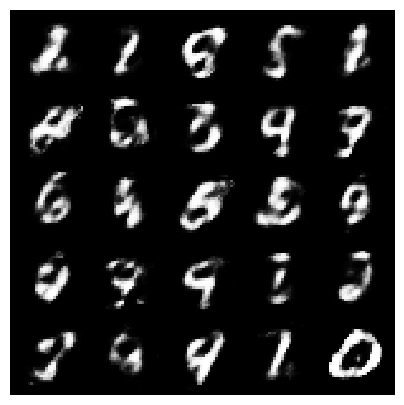

[Epoch 110/200] [Batch 820/938] [D loss: -0.104256] [G loss: -3.142591]


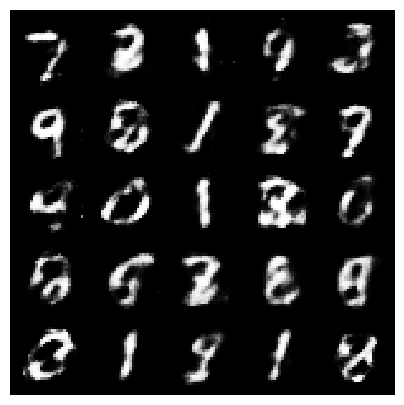

[Epoch 111/200] [Batch 382/938] [D loss: -0.118169] [G loss: -3.185320]


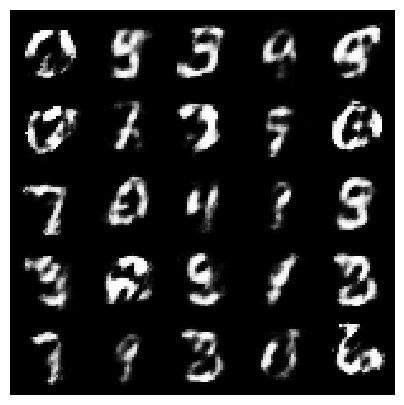

[Epoch 111/200] [Batch 882/938] [D loss: -0.129001] [G loss: -2.976437]


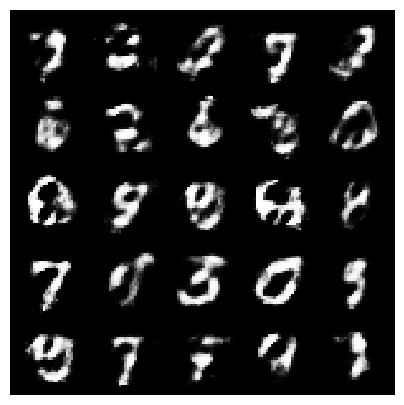

[Epoch 112/200] [Batch 444/938] [D loss: -0.097311] [G loss: -3.317161]


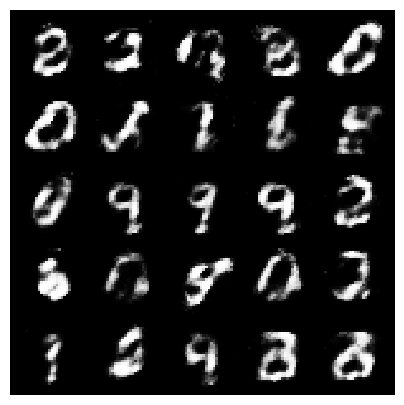

[Epoch 113/200] [Batch 6/938] [D loss: -0.097556] [G loss: -2.974499]


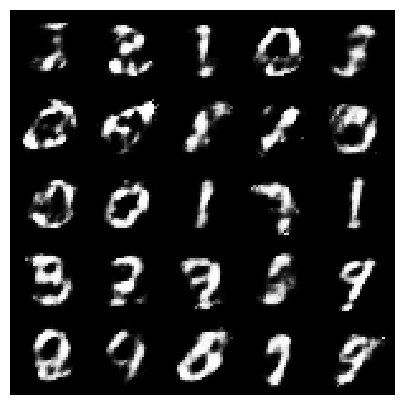

[Epoch 113/200] [Batch 506/938] [D loss: -0.119464] [G loss: -3.263956]


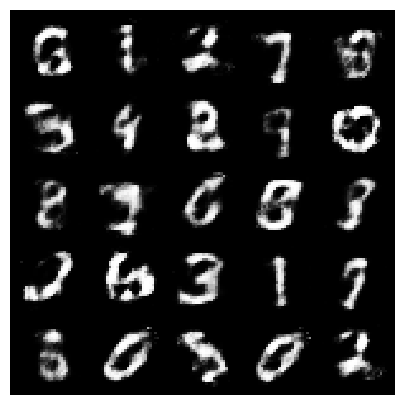

[Epoch 114/200] [Batch 68/938] [D loss: -0.087262] [G loss: -3.006959]


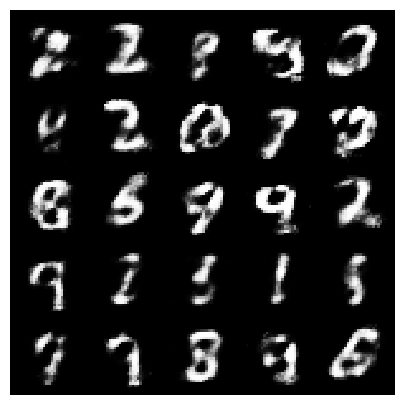

[Epoch 114/200] [Batch 568/938] [D loss: -0.098051] [G loss: -3.441279]


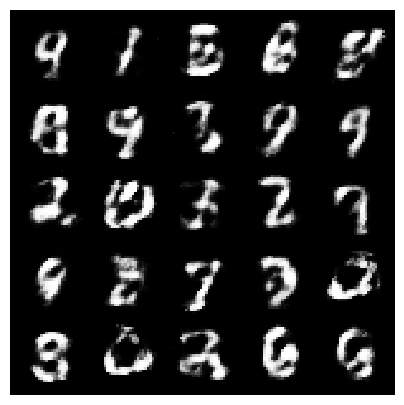

[Epoch 115/200] [Batch 130/938] [D loss: -0.084370] [G loss: -3.475218]


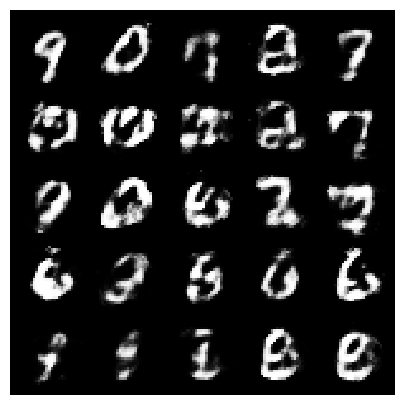

[Epoch 115/200] [Batch 630/938] [D loss: -0.140646] [G loss: -3.543450]


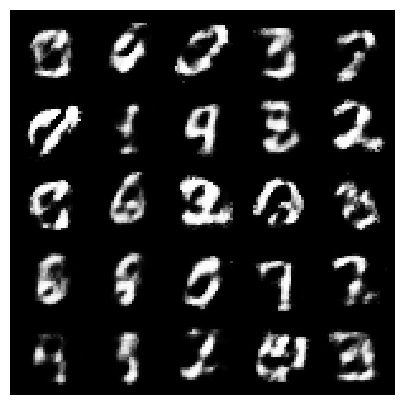

[Epoch 116/200] [Batch 192/938] [D loss: -0.118185] [G loss: -3.680314]


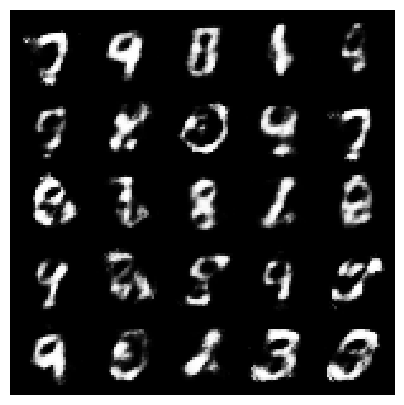

[Epoch 116/200] [Batch 692/938] [D loss: -0.116323] [G loss: -3.742560]


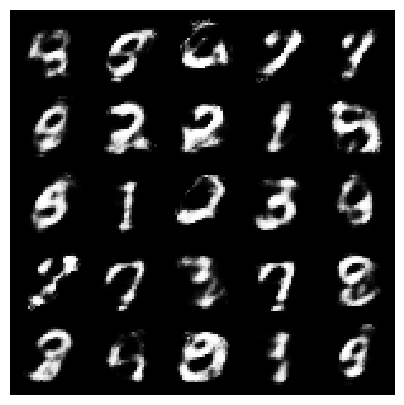

[Epoch 117/200] [Batch 254/938] [D loss: -0.074547] [G loss: -3.115971]


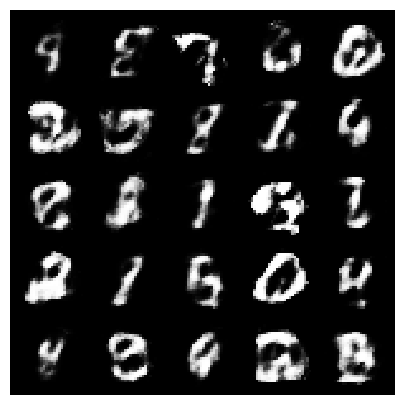

[Epoch 117/200] [Batch 754/938] [D loss: -0.114087] [G loss: -3.362946]


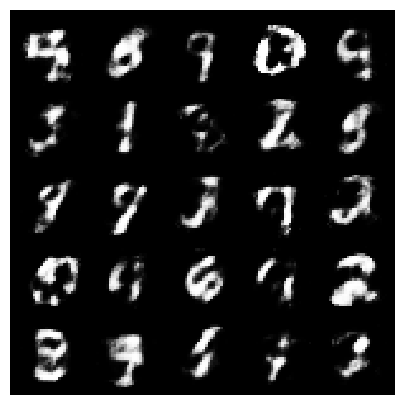

[Epoch 118/200] [Batch 316/938] [D loss: -0.104302] [G loss: -3.842037]


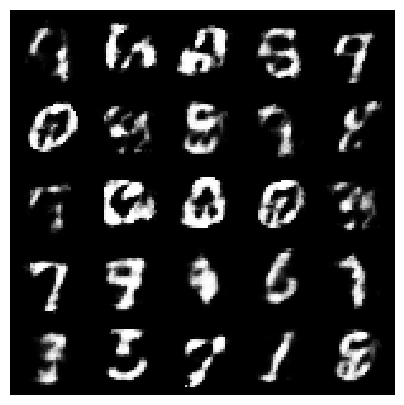

[Epoch 118/200] [Batch 816/938] [D loss: -0.086229] [G loss: -3.412259]


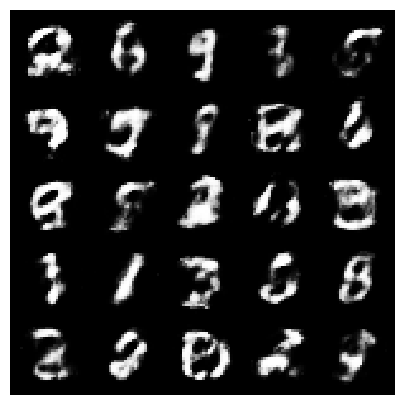

[Epoch 119/200] [Batch 378/938] [D loss: -0.089293] [G loss: -3.249795]


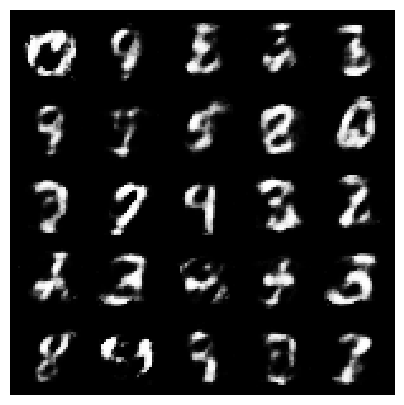

[Epoch 119/200] [Batch 878/938] [D loss: -0.085777] [G loss: -3.279089]


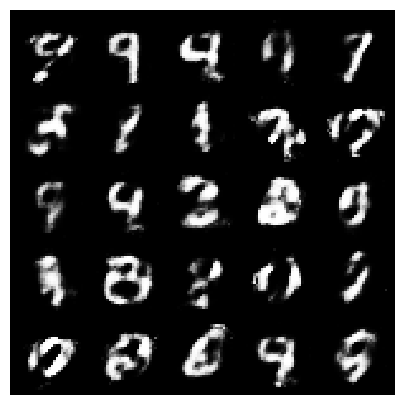

[Epoch 120/200] [Batch 440/938] [D loss: -0.105189] [G loss: -3.117098]


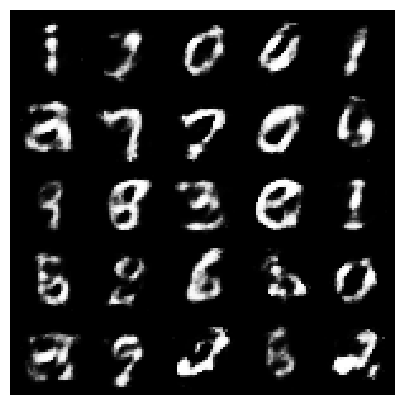

[Epoch 121/200] [Batch 2/938] [D loss: -0.082734] [G loss: -3.789956]


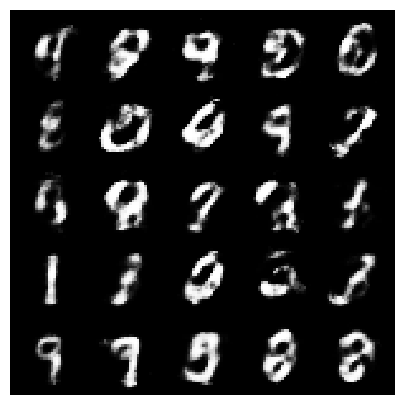

[Epoch 121/200] [Batch 502/938] [D loss: -0.106751] [G loss: -3.570778]


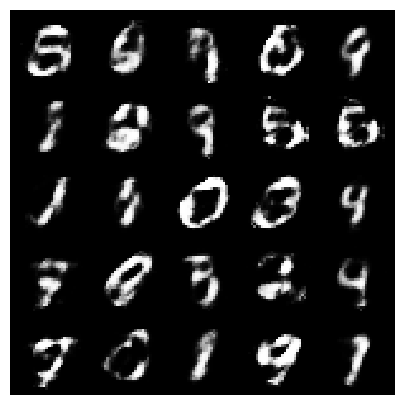

[Epoch 122/200] [Batch 64/938] [D loss: -0.111608] [G loss: -3.403826]


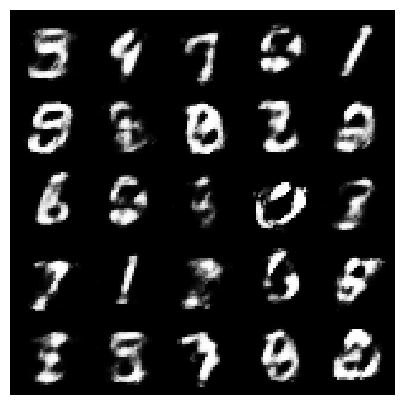

[Epoch 122/200] [Batch 564/938] [D loss: -0.113625] [G loss: -3.661083]


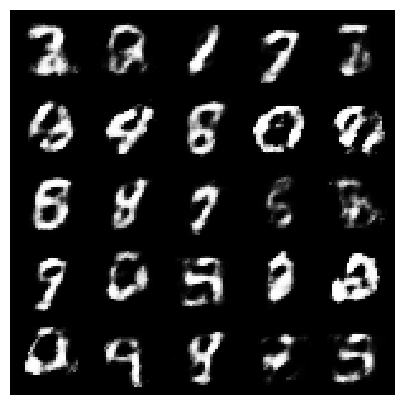

[Epoch 123/200] [Batch 126/938] [D loss: -0.117104] [G loss: -3.323848]


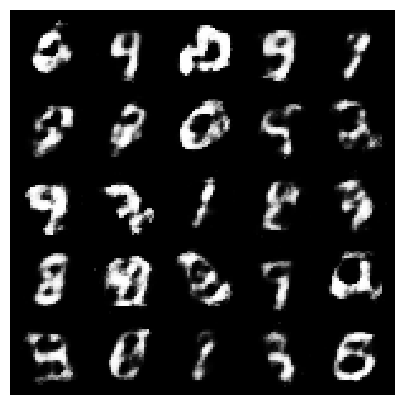

[Epoch 123/200] [Batch 626/938] [D loss: -0.099166] [G loss: -3.531464]


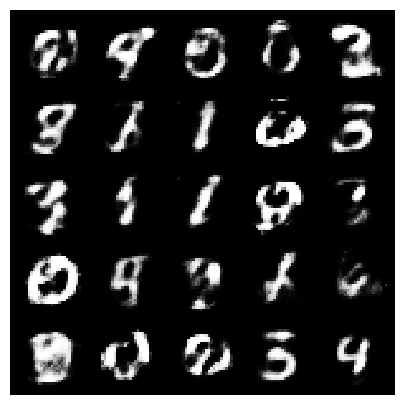

[Epoch 124/200] [Batch 188/938] [D loss: -0.076366] [G loss: -3.523147]


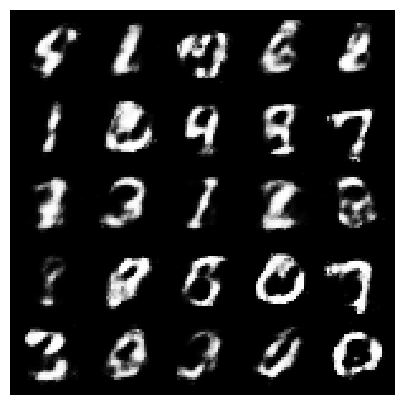

[Epoch 124/200] [Batch 688/938] [D loss: -0.110683] [G loss: -3.639686]


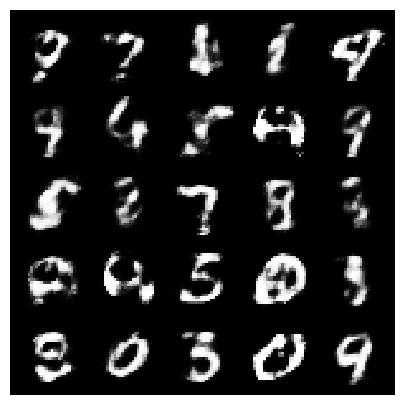

[Epoch 125/200] [Batch 250/938] [D loss: -0.086565] [G loss: -3.842932]


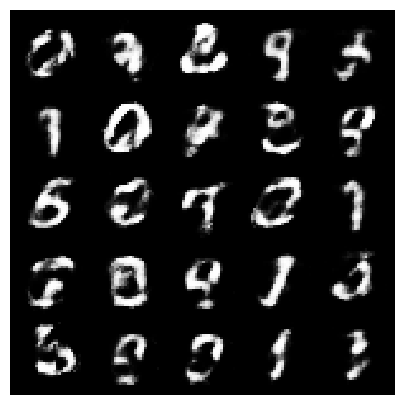

[Epoch 125/200] [Batch 750/938] [D loss: -0.107743] [G loss: -3.119174]


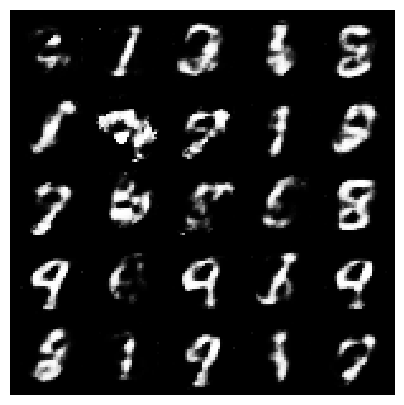

[Epoch 126/200] [Batch 312/938] [D loss: -0.103734] [G loss: -2.778727]


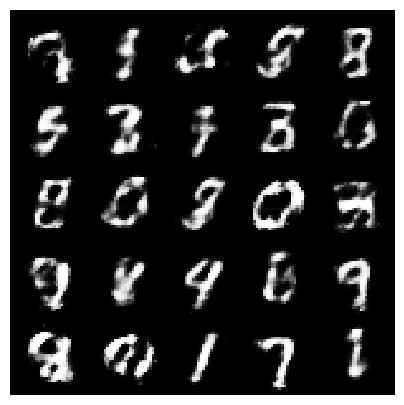

[Epoch 126/200] [Batch 812/938] [D loss: -0.084765] [G loss: -3.225469]


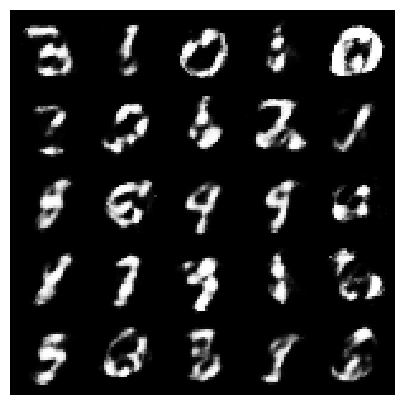

[Epoch 127/200] [Batch 374/938] [D loss: -0.100136] [G loss: -3.009714]


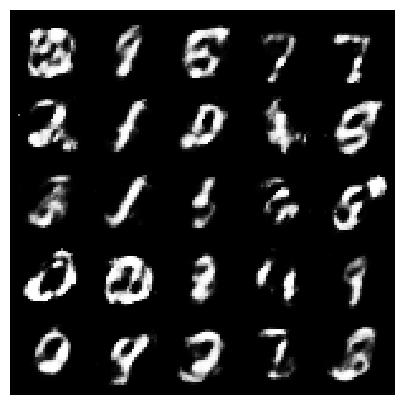

[Epoch 127/200] [Batch 874/938] [D loss: -0.115221] [G loss: -3.164932]


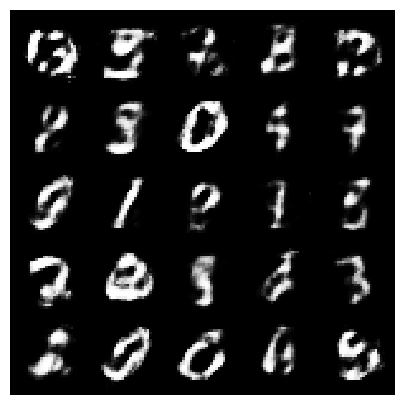

[Epoch 128/200] [Batch 436/938] [D loss: -0.117067] [G loss: -3.406648]


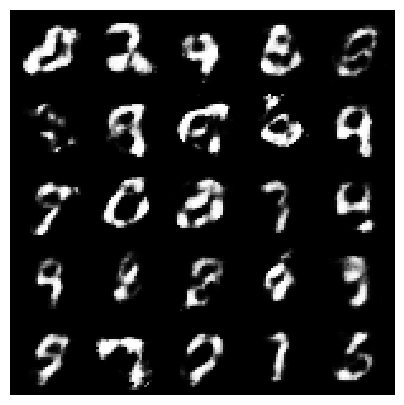

[Epoch 128/200] [Batch 936/938] [D loss: -0.116221] [G loss: -3.120578]


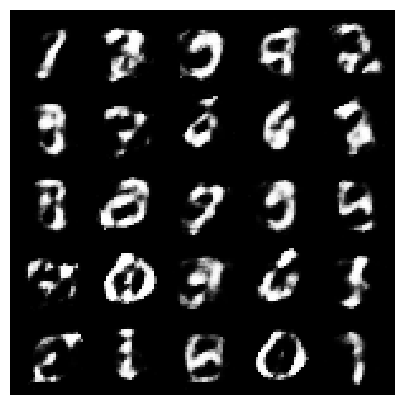

[Epoch 129/200] [Batch 498/938] [D loss: -0.082270] [G loss: -3.423357]


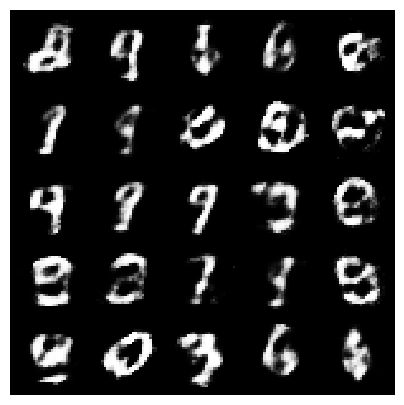

[Epoch 130/200] [Batch 60/938] [D loss: -0.106815] [G loss: -3.831089]


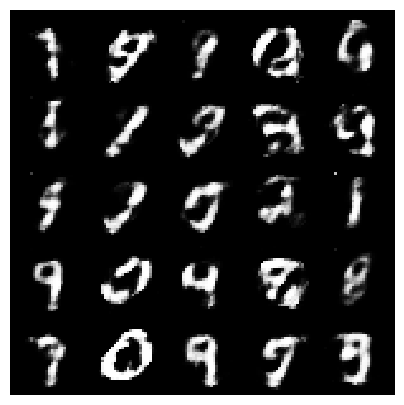

[Epoch 130/200] [Batch 560/938] [D loss: -0.071433] [G loss: -3.409227]


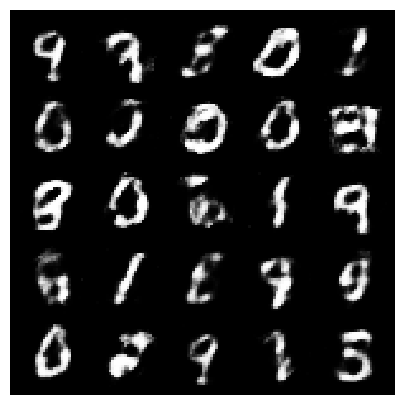

[Epoch 131/200] [Batch 122/938] [D loss: -0.076431] [G loss: -3.071527]


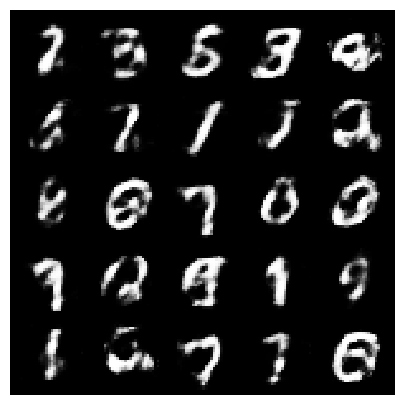

[Epoch 131/200] [Batch 622/938] [D loss: -0.062503] [G loss: -3.705322]


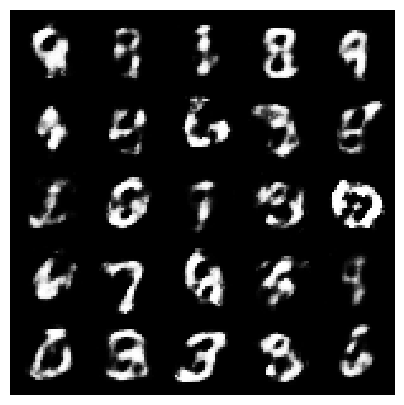

[Epoch 132/200] [Batch 184/938] [D loss: -0.104286] [G loss: -2.832338]


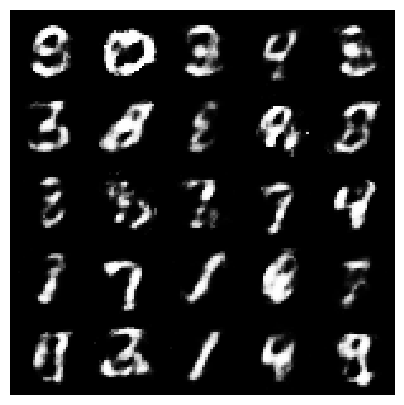

[Epoch 132/200] [Batch 684/938] [D loss: -0.091012] [G loss: -3.537898]


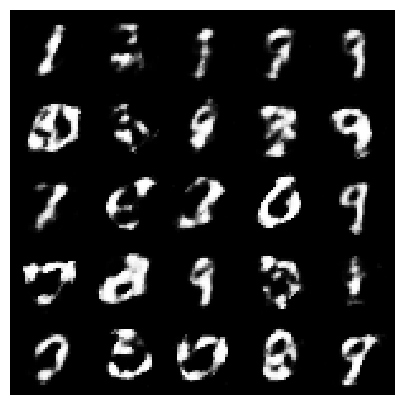

[Epoch 133/200] [Batch 246/938] [D loss: -0.084874] [G loss: -2.848410]


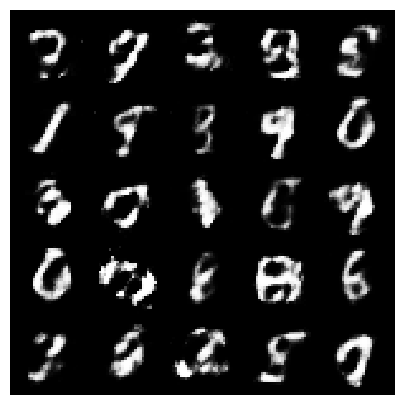

[Epoch 133/200] [Batch 746/938] [D loss: -0.071311] [G loss: -3.424700]


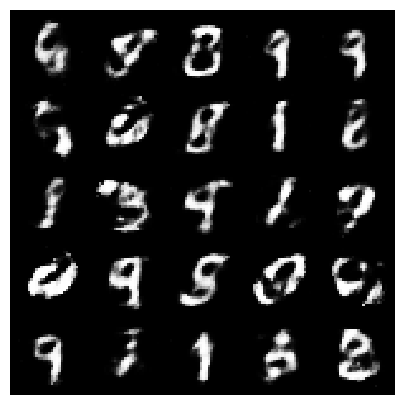

[Epoch 134/200] [Batch 308/938] [D loss: -0.062275] [G loss: -2.900559]


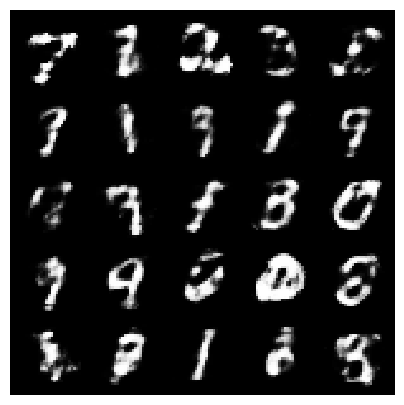

[Epoch 134/200] [Batch 808/938] [D loss: -0.100430] [G loss: -3.583499]


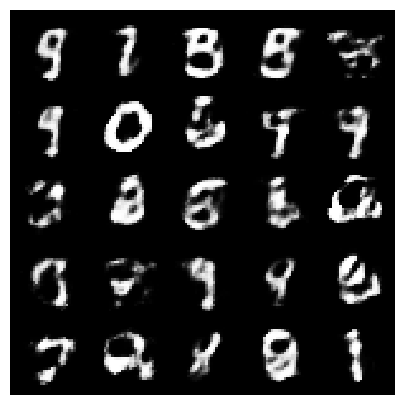

[Epoch 135/200] [Batch 370/938] [D loss: -0.110264] [G loss: -3.345438]


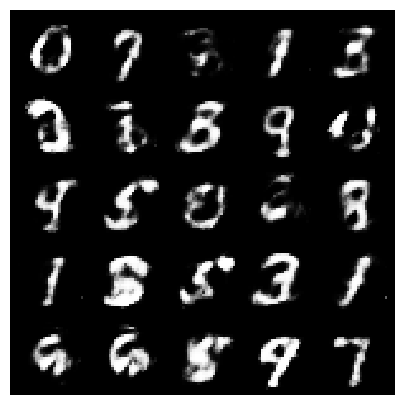

[Epoch 135/200] [Batch 870/938] [D loss: -0.086220] [G loss: -2.976884]


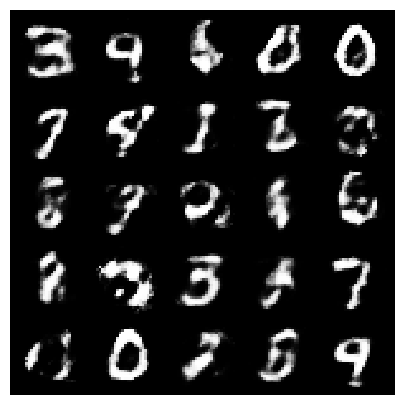

[Epoch 136/200] [Batch 432/938] [D loss: -0.081505] [G loss: -2.436813]


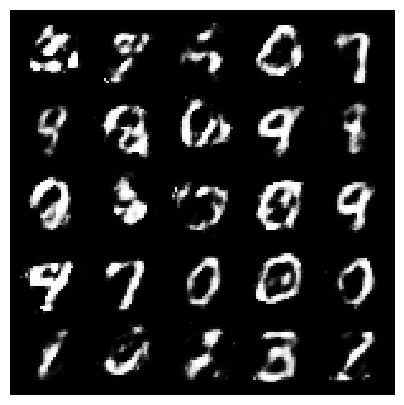

[Epoch 136/200] [Batch 932/938] [D loss: -0.126084] [G loss: -3.474248]


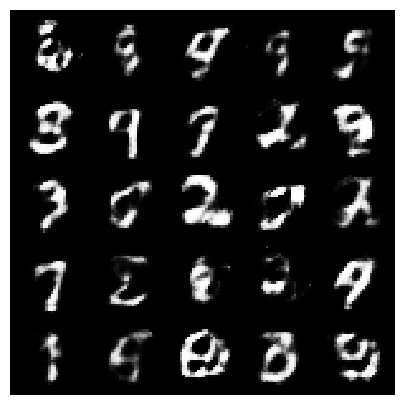

[Epoch 137/200] [Batch 494/938] [D loss: -0.097312] [G loss: -2.862928]


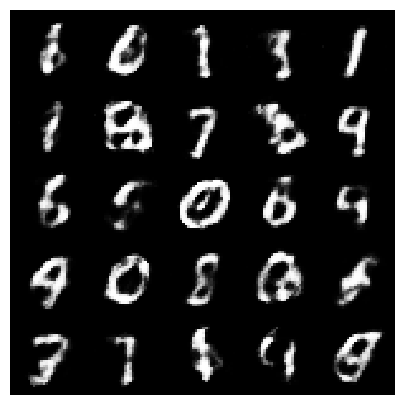

[Epoch 138/200] [Batch 56/938] [D loss: -0.076374] [G loss: -3.034142]


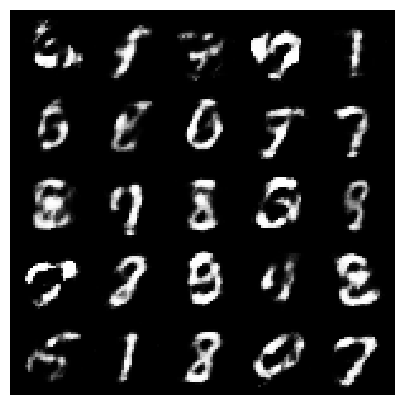

[Epoch 138/200] [Batch 556/938] [D loss: -0.073411] [G loss: -3.243676]


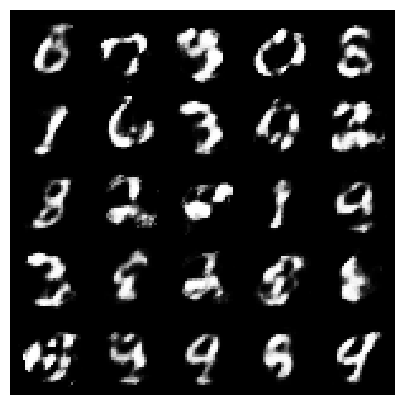

[Epoch 139/200] [Batch 118/938] [D loss: -0.097632] [G loss: -3.565794]


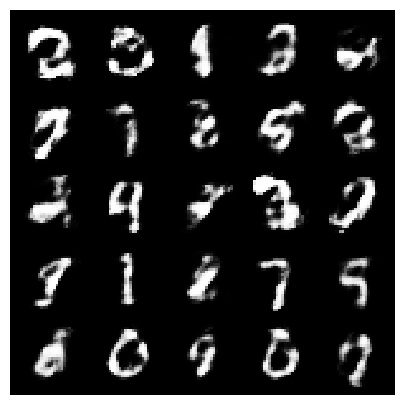

[Epoch 139/200] [Batch 618/938] [D loss: -0.070823] [G loss: -2.778375]


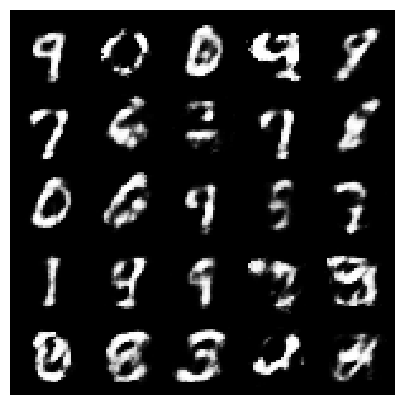

[Epoch 140/200] [Batch 180/938] [D loss: -0.107625] [G loss: -3.326176]


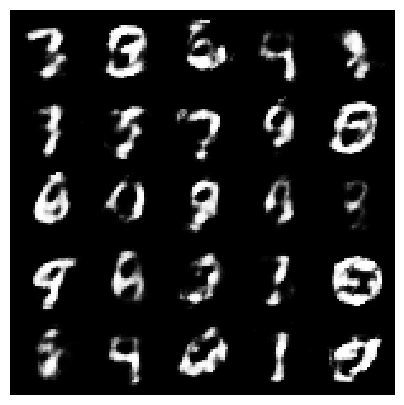

[Epoch 140/200] [Batch 680/938] [D loss: -0.099601] [G loss: -3.227862]


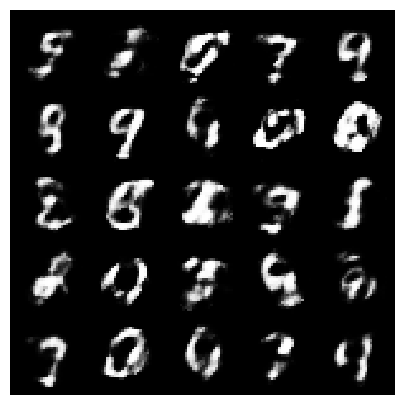

[Epoch 141/200] [Batch 242/938] [D loss: -0.094135] [G loss: -2.921423]


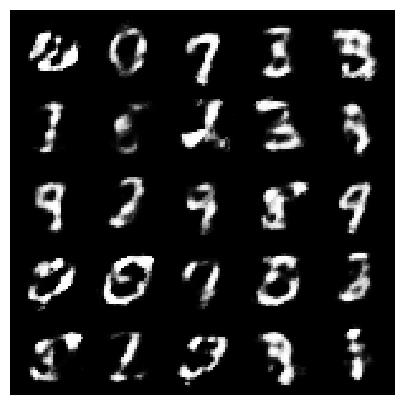

[Epoch 141/200] [Batch 742/938] [D loss: -0.084078] [G loss: -2.592094]


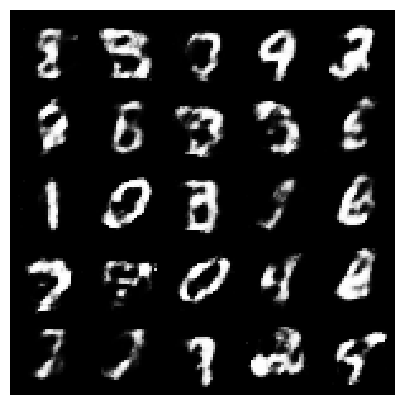

[Epoch 142/200] [Batch 304/938] [D loss: -0.095819] [G loss: -3.125242]


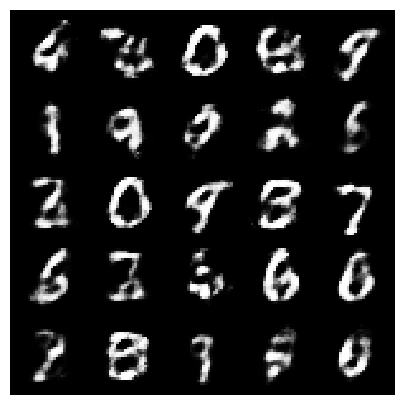

[Epoch 142/200] [Batch 804/938] [D loss: -0.101421] [G loss: -3.180033]


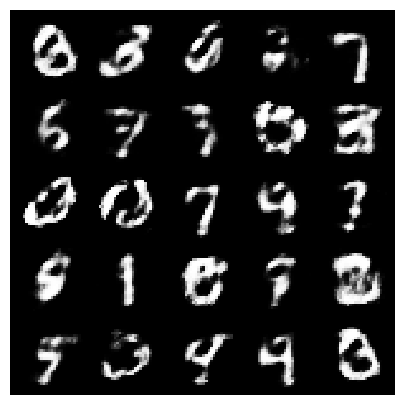

[Epoch 143/200] [Batch 366/938] [D loss: -0.059343] [G loss: -2.976014]


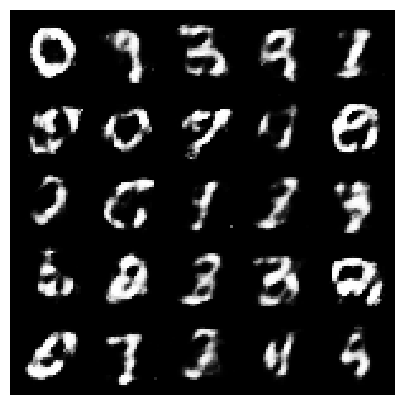

[Epoch 143/200] [Batch 866/938] [D loss: -0.093800] [G loss: -2.605555]


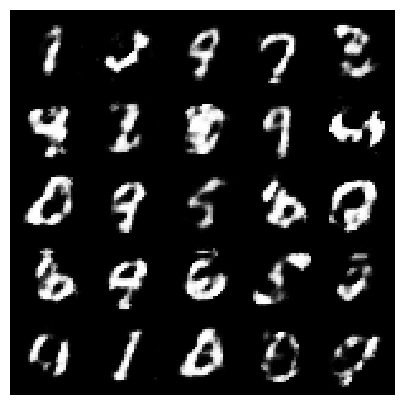

[Epoch 144/200] [Batch 428/938] [D loss: -0.062527] [G loss: -2.878937]


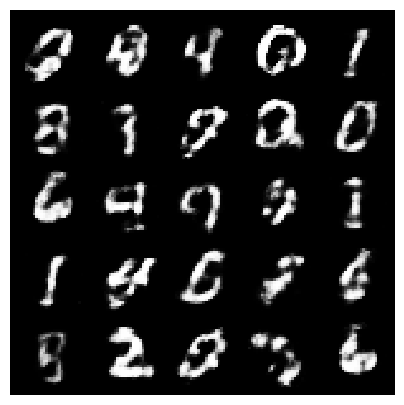

[Epoch 144/200] [Batch 928/938] [D loss: -0.077507] [G loss: -3.071926]


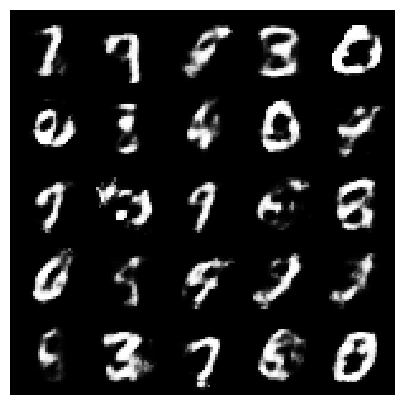

[Epoch 145/200] [Batch 490/938] [D loss: -0.069853] [G loss: -2.926456]


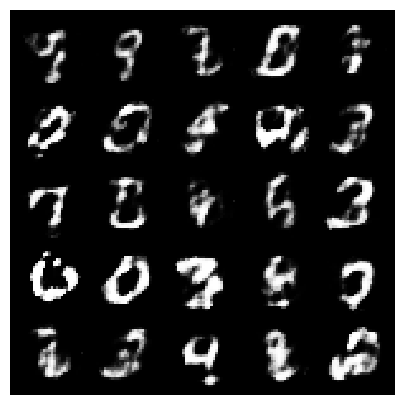

[Epoch 146/200] [Batch 52/938] [D loss: -0.060271] [G loss: -3.288601]


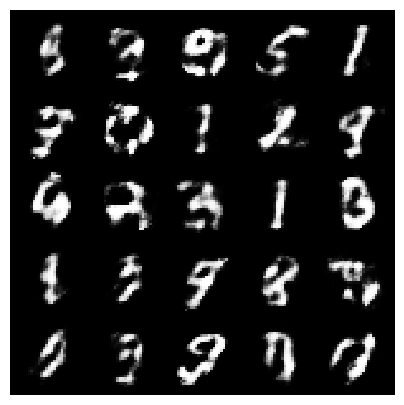

[Epoch 146/200] [Batch 552/938] [D loss: -0.091630] [G loss: -2.886773]


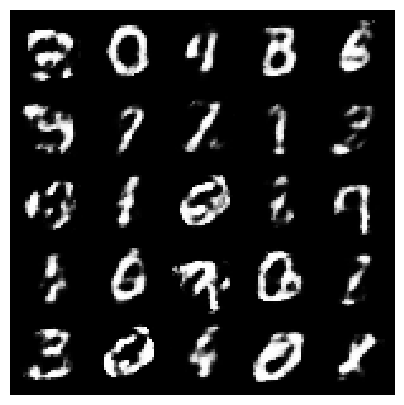

[Epoch 147/200] [Batch 114/938] [D loss: -0.094736] [G loss: -3.204674]


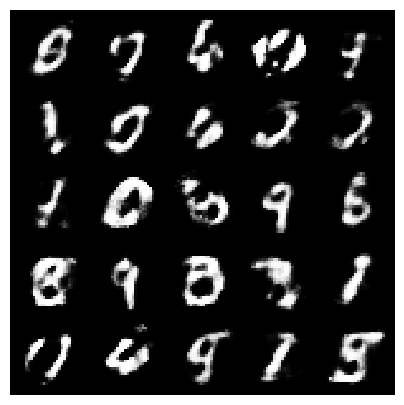

[Epoch 147/200] [Batch 614/938] [D loss: -0.078974] [G loss: -3.199171]


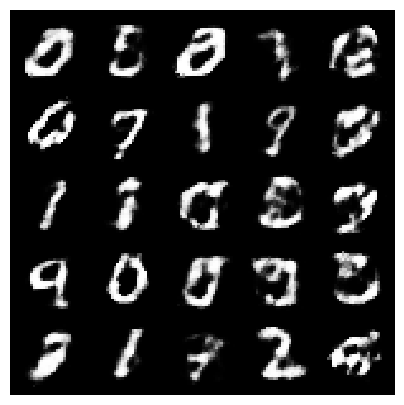

[Epoch 148/200] [Batch 176/938] [D loss: -0.082274] [G loss: -3.014399]


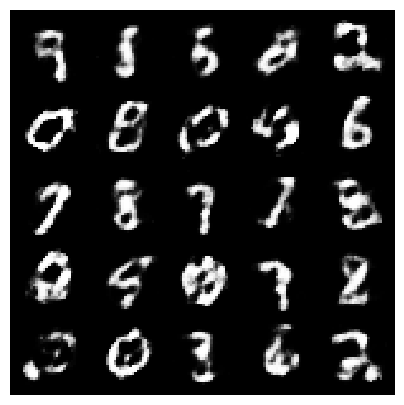

[Epoch 148/200] [Batch 676/938] [D loss: -0.083807] [G loss: -3.180661]


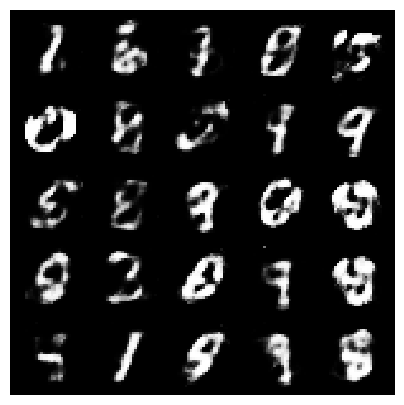

[Epoch 149/200] [Batch 238/938] [D loss: -0.080059] [G loss: -3.260013]


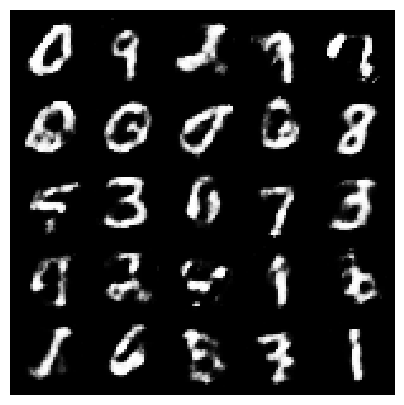

[Epoch 149/200] [Batch 738/938] [D loss: -0.080684] [G loss: -3.095434]


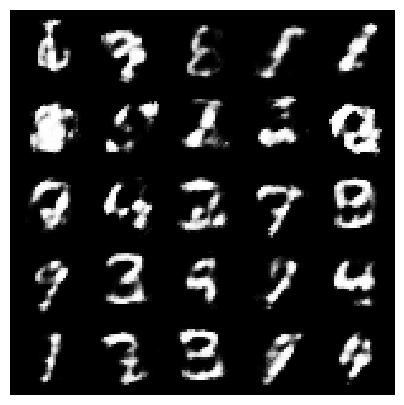

[Epoch 150/200] [Batch 300/938] [D loss: -0.108233] [G loss: -3.272529]


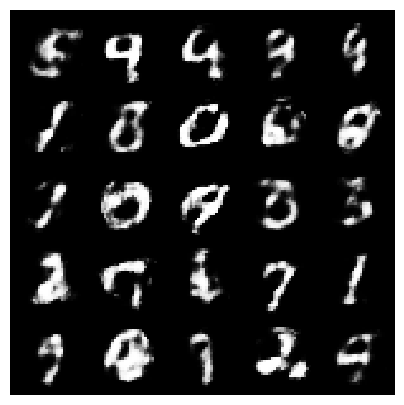

[Epoch 150/200] [Batch 800/938] [D loss: -0.084525] [G loss: -3.435606]


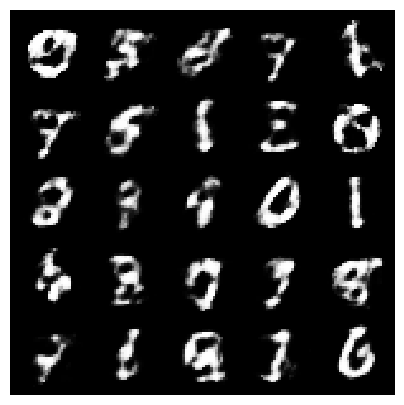

[Epoch 151/200] [Batch 362/938] [D loss: -0.067916] [G loss: -3.478088]


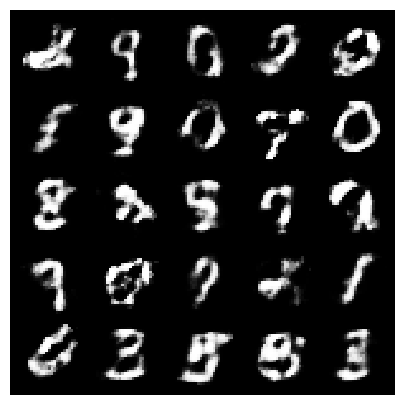

[Epoch 151/200] [Batch 862/938] [D loss: -0.068486] [G loss: -3.543881]


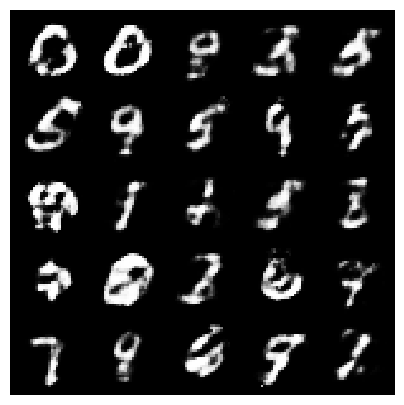

[Epoch 152/200] [Batch 424/938] [D loss: -0.068345] [G loss: -3.776129]


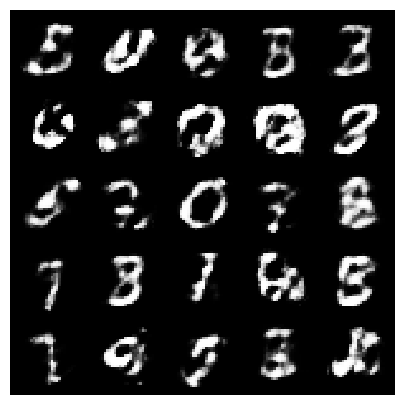

[Epoch 152/200] [Batch 924/938] [D loss: -0.090493] [G loss: -3.487061]


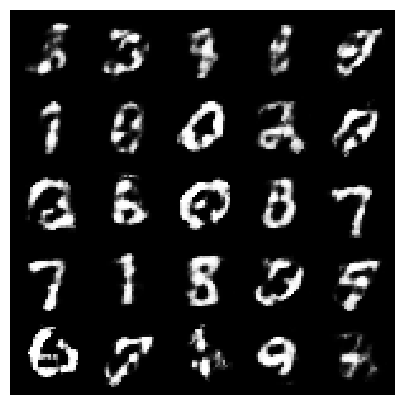

[Epoch 153/200] [Batch 486/938] [D loss: -0.066483] [G loss: -3.368350]


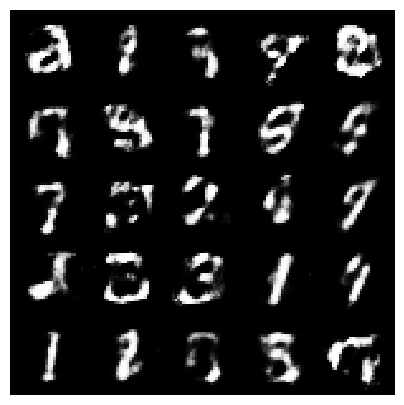

[Epoch 154/200] [Batch 48/938] [D loss: -0.111413] [G loss: -3.251028]


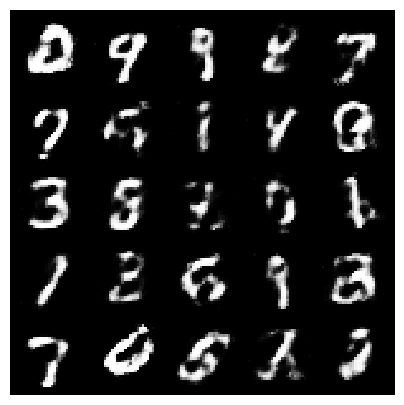

[Epoch 154/200] [Batch 548/938] [D loss: -0.071030] [G loss: -3.177731]


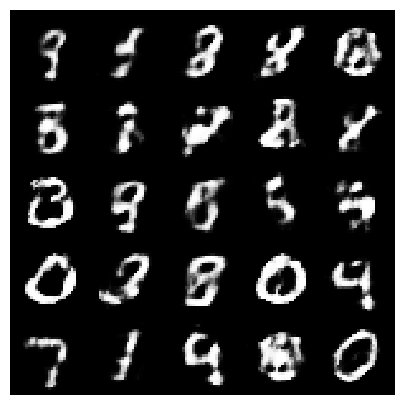

[Epoch 155/200] [Batch 110/938] [D loss: -0.079877] [G loss: -3.101245]


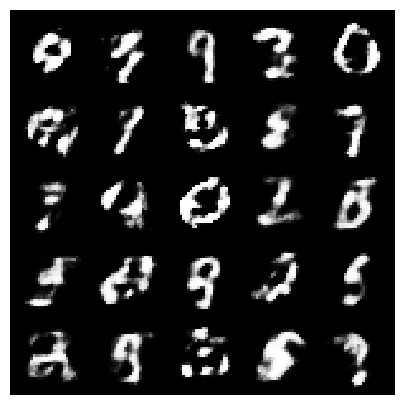

[Epoch 155/200] [Batch 610/938] [D loss: -0.052443] [G loss: -3.220485]


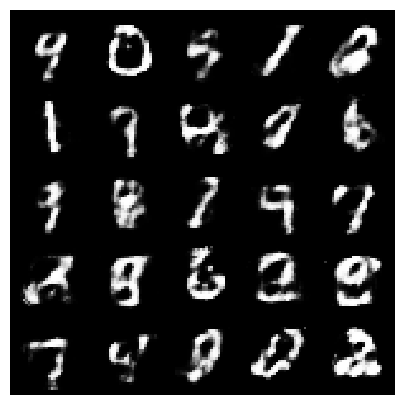

[Epoch 156/200] [Batch 172/938] [D loss: -0.070926] [G loss: -3.095153]


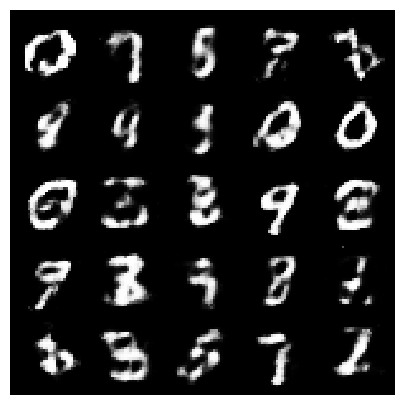

[Epoch 156/200] [Batch 672/938] [D loss: -0.091389] [G loss: -3.316846]


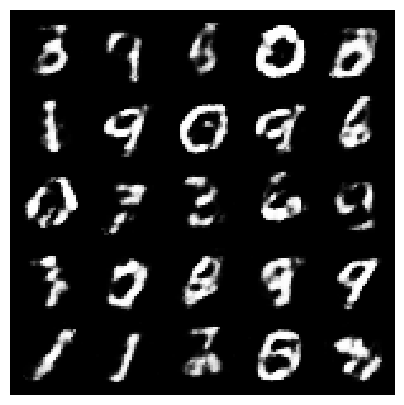

[Epoch 157/200] [Batch 234/938] [D loss: -0.055012] [G loss: -3.384259]


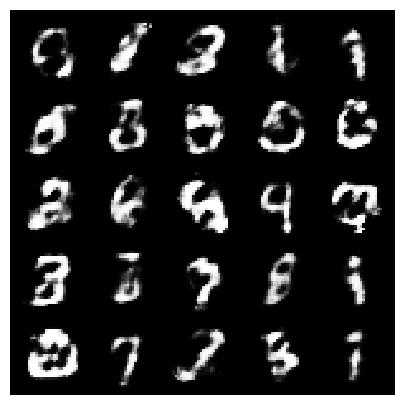

[Epoch 157/200] [Batch 734/938] [D loss: -0.079319] [G loss: -3.175088]


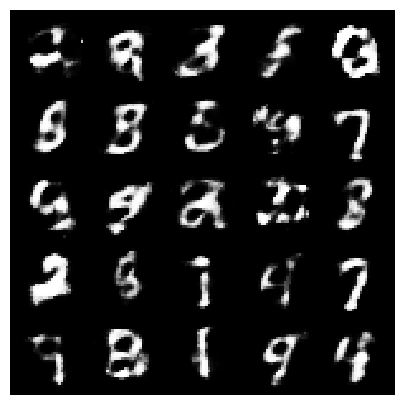

[Epoch 158/200] [Batch 296/938] [D loss: -0.065539] [G loss: -2.914595]


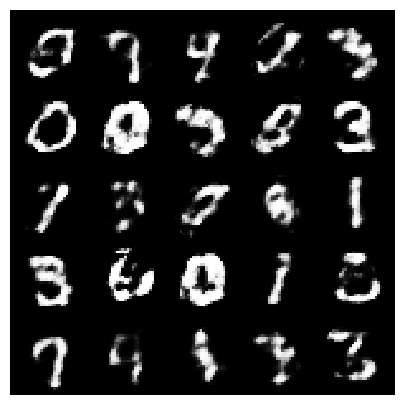

[Epoch 158/200] [Batch 796/938] [D loss: -0.086528] [G loss: -3.040104]


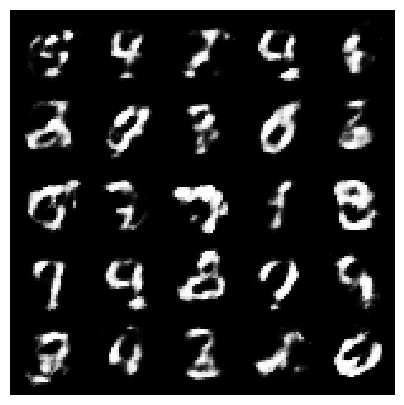

[Epoch 159/200] [Batch 358/938] [D loss: -0.075025] [G loss: -2.849853]


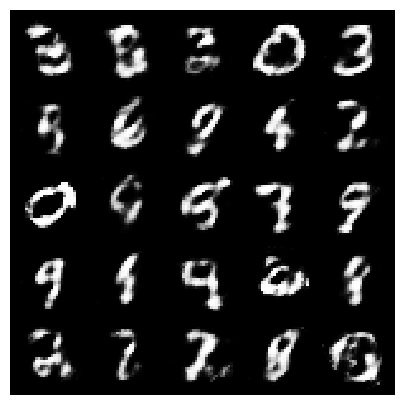

[Epoch 159/200] [Batch 858/938] [D loss: -0.064703] [G loss: -2.558923]


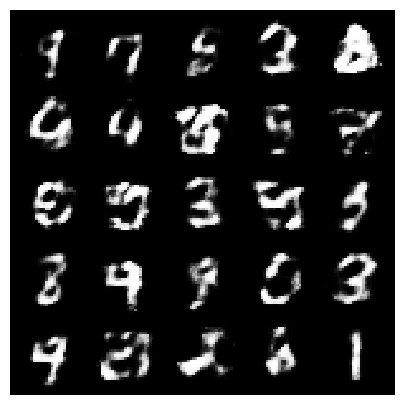

[Epoch 160/200] [Batch 420/938] [D loss: -0.070157] [G loss: -2.844068]


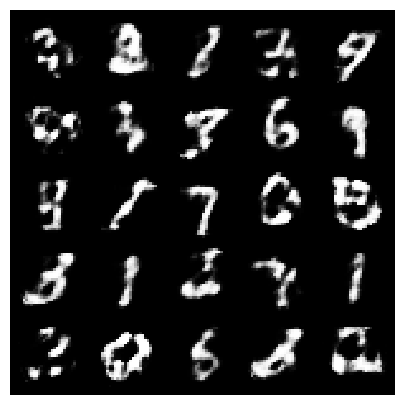

[Epoch 160/200] [Batch 920/938] [D loss: -0.077698] [G loss: -3.104004]


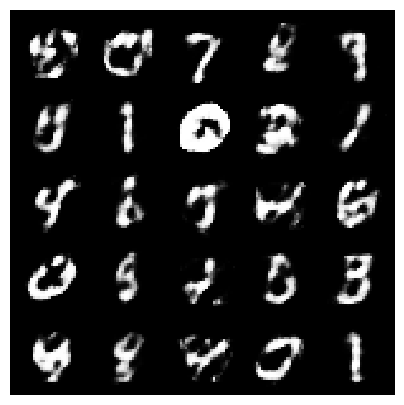

[Epoch 161/200] [Batch 482/938] [D loss: -0.079477] [G loss: -2.900605]


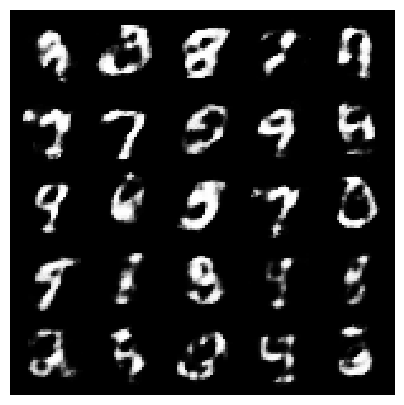

[Epoch 162/200] [Batch 44/938] [D loss: -0.058102] [G loss: -2.751749]


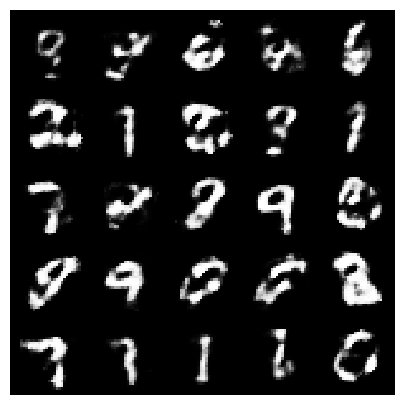

[Epoch 162/200] [Batch 544/938] [D loss: -0.072997] [G loss: -3.135083]


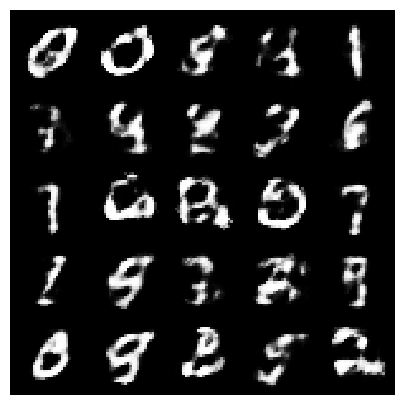

[Epoch 163/200] [Batch 106/938] [D loss: -0.061545] [G loss: -2.752685]


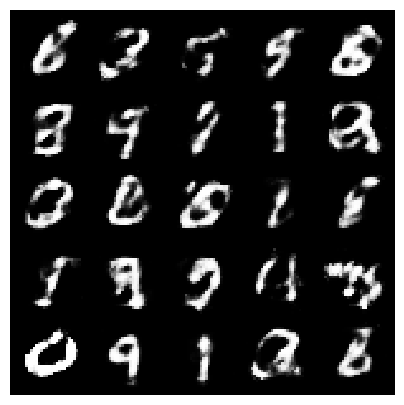

[Epoch 163/200] [Batch 606/938] [D loss: -0.060429] [G loss: -2.932960]


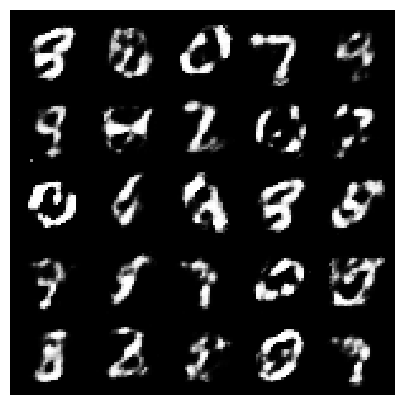

[Epoch 164/200] [Batch 168/938] [D loss: -0.097471] [G loss: -2.671914]


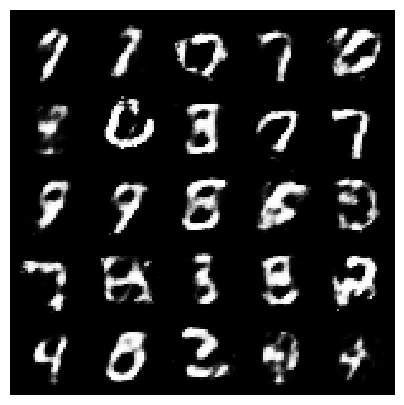

[Epoch 164/200] [Batch 668/938] [D loss: -0.080398] [G loss: -2.542656]


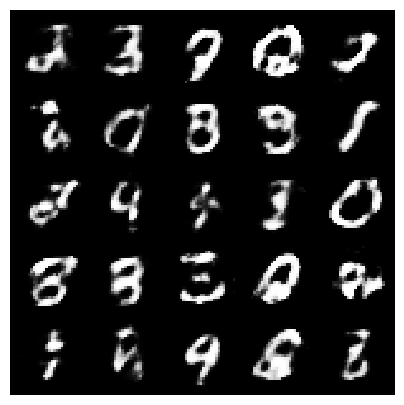

[Epoch 165/200] [Batch 230/938] [D loss: -0.070692] [G loss: -3.055942]


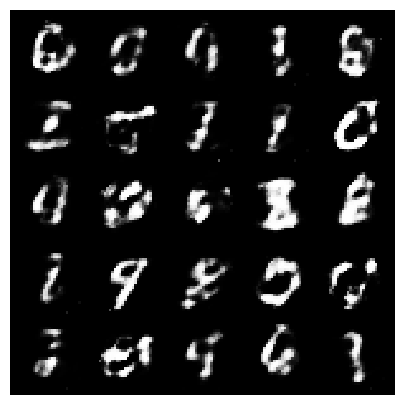

[Epoch 165/200] [Batch 730/938] [D loss: -0.074109] [G loss: -3.422776]


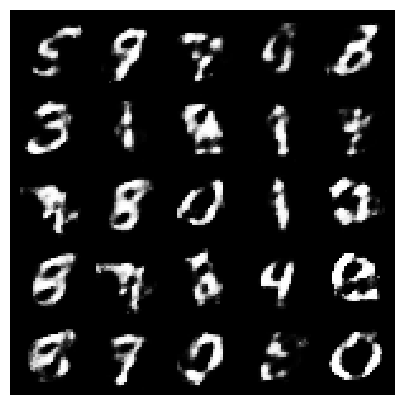

[Epoch 166/200] [Batch 292/938] [D loss: -0.088539] [G loss: -3.134137]


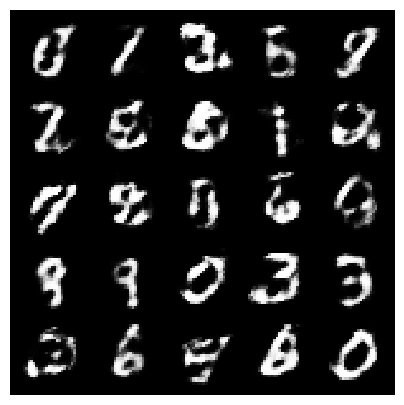

[Epoch 166/200] [Batch 792/938] [D loss: -0.086930] [G loss: -3.087919]


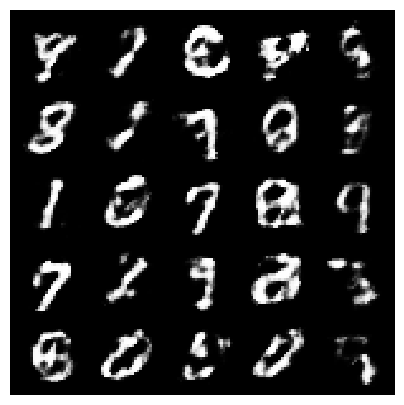

[Epoch 167/200] [Batch 354/938] [D loss: -0.082149] [G loss: -3.238928]


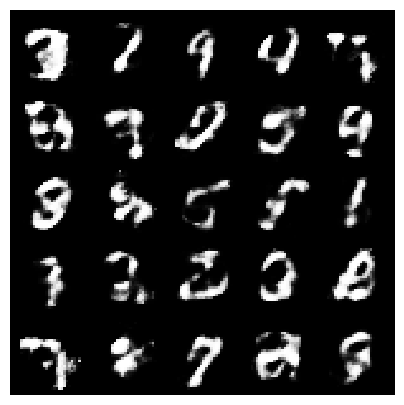

[Epoch 167/200] [Batch 854/938] [D loss: -0.067246] [G loss: -3.374333]


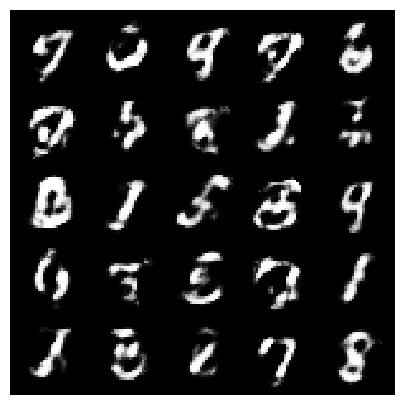

[Epoch 168/200] [Batch 416/938] [D loss: -0.061569] [G loss: -3.296027]


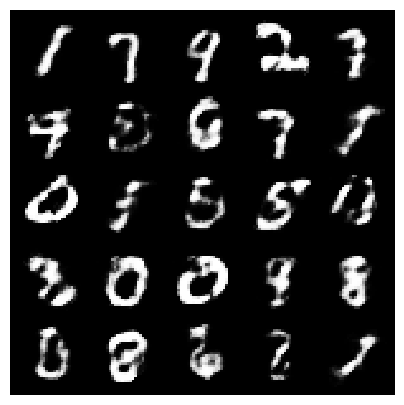

[Epoch 168/200] [Batch 916/938] [D loss: -0.053152] [G loss: -3.416499]


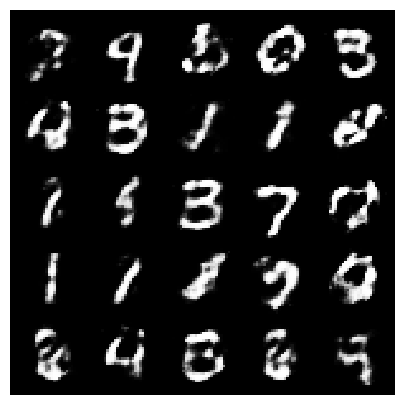

[Epoch 169/200] [Batch 478/938] [D loss: -0.101885] [G loss: -3.113362]


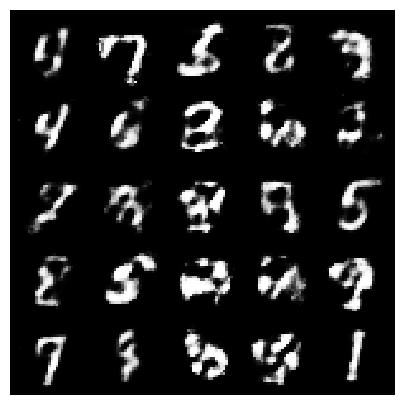

[Epoch 170/200] [Batch 40/938] [D loss: -0.084968] [G loss: -3.192323]


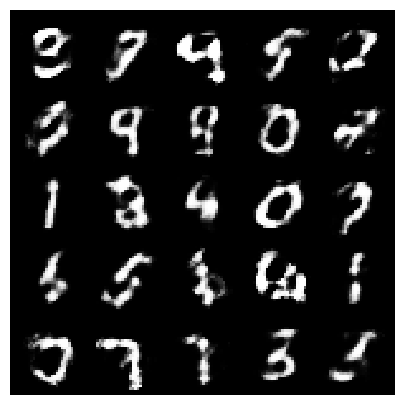

[Epoch 170/200] [Batch 540/938] [D loss: -0.076413] [G loss: -3.237040]


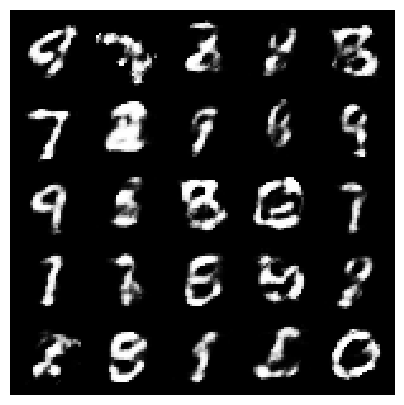

[Epoch 171/200] [Batch 102/938] [D loss: -0.064738] [G loss: -3.095601]


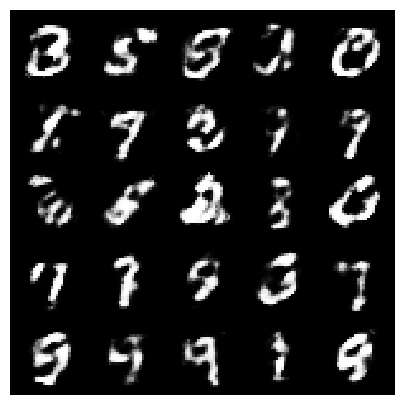

[Epoch 171/200] [Batch 602/938] [D loss: -0.068017] [G loss: -3.236327]


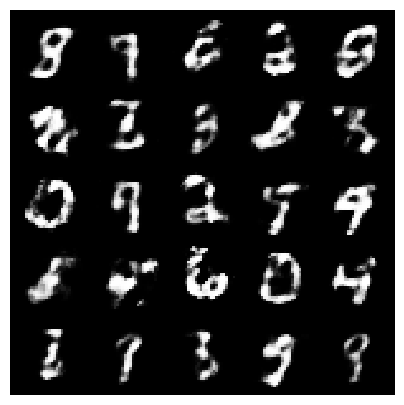

[Epoch 172/200] [Batch 164/938] [D loss: -0.103667] [G loss: -3.261237]


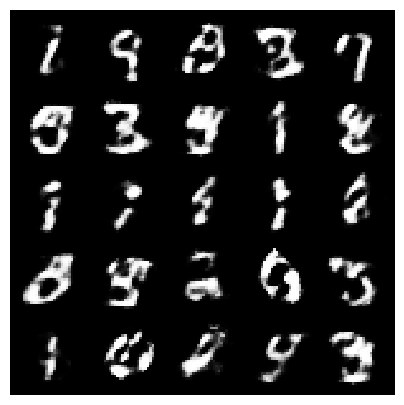

[Epoch 172/200] [Batch 664/938] [D loss: -0.078706] [G loss: -3.480105]


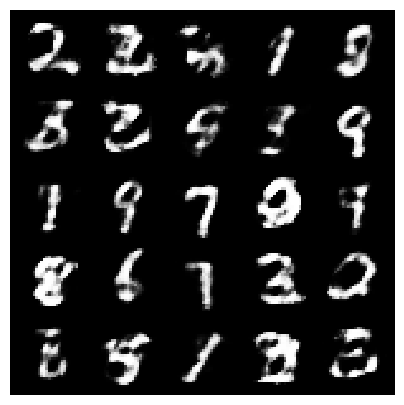

[Epoch 173/200] [Batch 226/938] [D loss: -0.067668] [G loss: -3.643784]


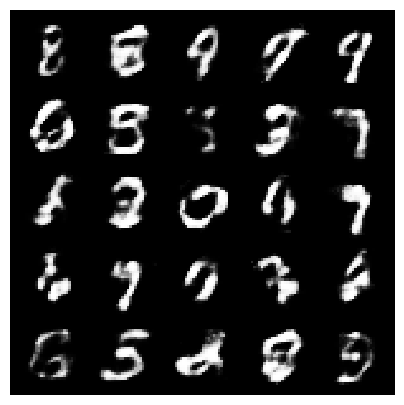

[Epoch 173/200] [Batch 726/938] [D loss: -0.068495] [G loss: -3.560125]


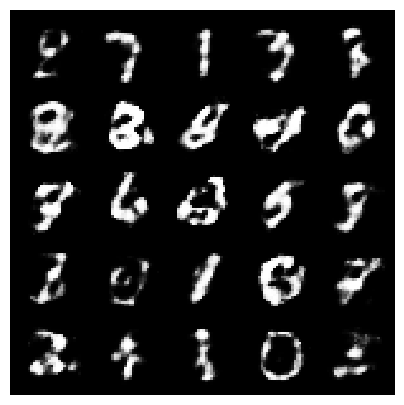

[Epoch 174/200] [Batch 288/938] [D loss: -0.059664] [G loss: -3.870845]


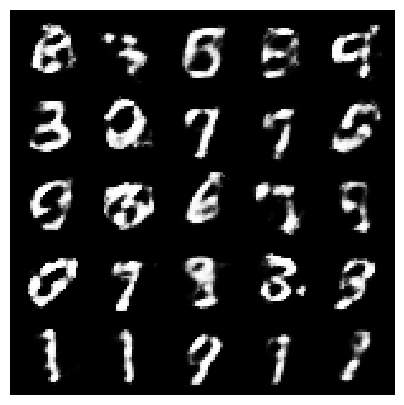

[Epoch 174/200] [Batch 788/938] [D loss: -0.056132] [G loss: -3.478291]


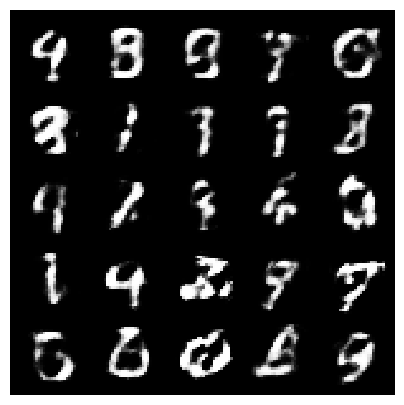

[Epoch 175/200] [Batch 350/938] [D loss: -0.080805] [G loss: -3.800871]


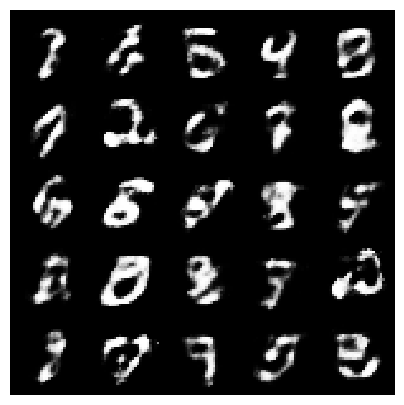

[Epoch 175/200] [Batch 850/938] [D loss: -0.080769] [G loss: -3.573301]


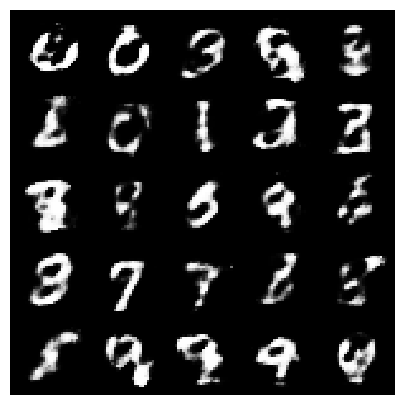

[Epoch 176/200] [Batch 412/938] [D loss: -0.127174] [G loss: -3.353272]


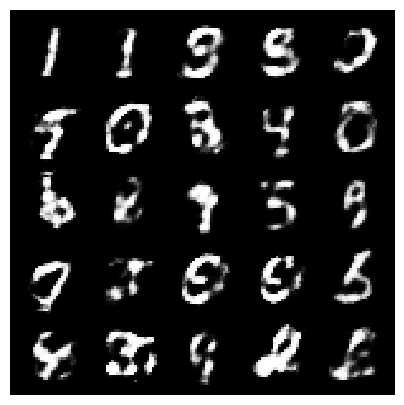

[Epoch 176/200] [Batch 912/938] [D loss: -0.063441] [G loss: -3.324702]


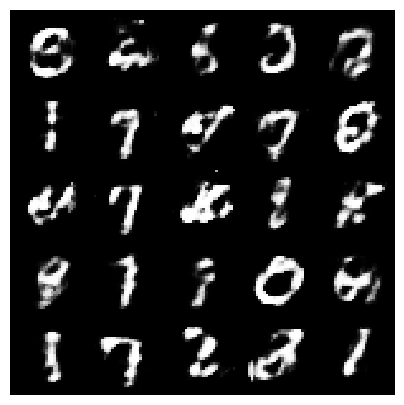

[Epoch 177/200] [Batch 474/938] [D loss: -0.064834] [G loss: -3.287747]


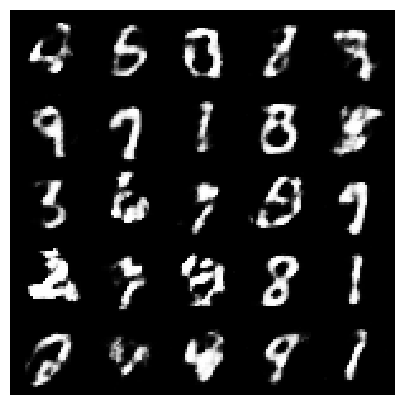

[Epoch 178/200] [Batch 36/938] [D loss: -0.065649] [G loss: -3.297747]


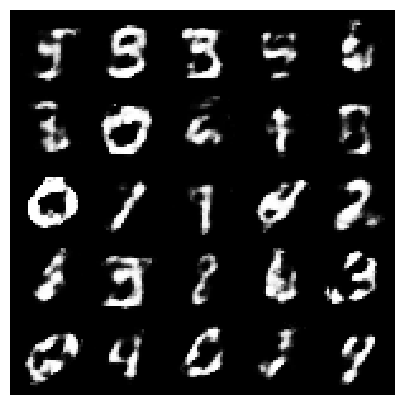

[Epoch 178/200] [Batch 536/938] [D loss: -0.090861] [G loss: -3.441461]


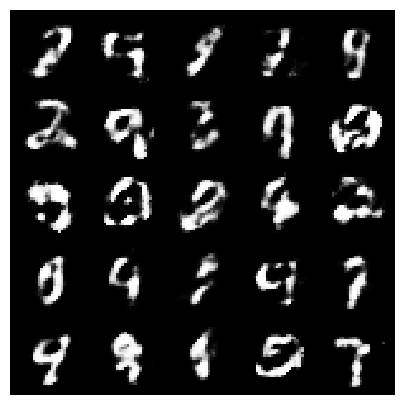

[Epoch 179/200] [Batch 98/938] [D loss: -0.032929] [G loss: -3.106738]


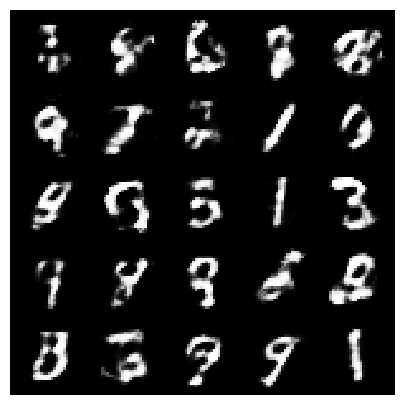

[Epoch 179/200] [Batch 598/938] [D loss: -0.062862] [G loss: -3.278430]


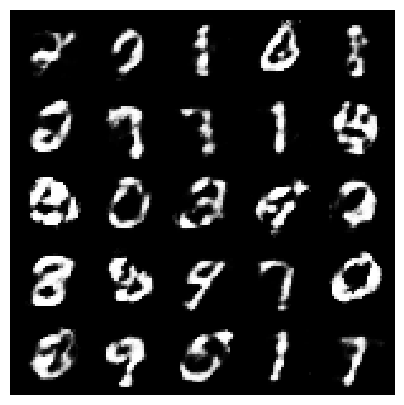

[Epoch 180/200] [Batch 160/938] [D loss: -0.068996] [G loss: -3.307527]


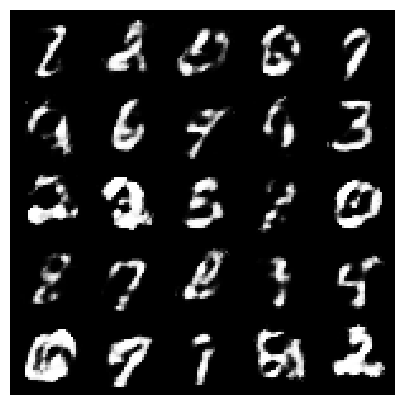

[Epoch 180/200] [Batch 660/938] [D loss: -0.068058] [G loss: -3.063688]


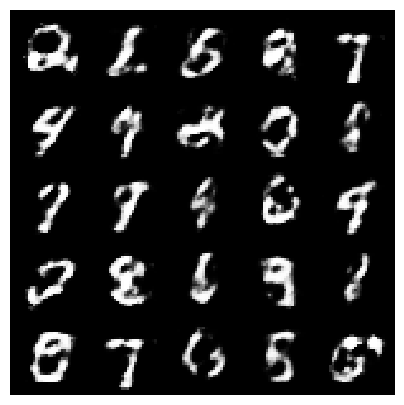

[Epoch 181/200] [Batch 222/938] [D loss: -0.076720] [G loss: -3.433641]


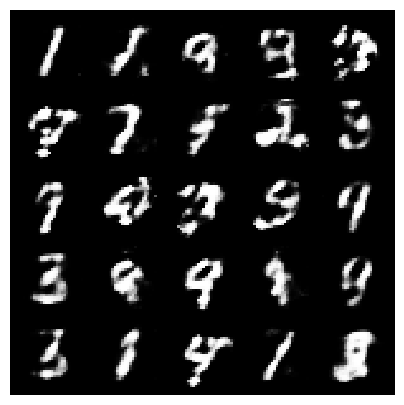

[Epoch 181/200] [Batch 722/938] [D loss: -0.052596] [G loss: -3.174082]


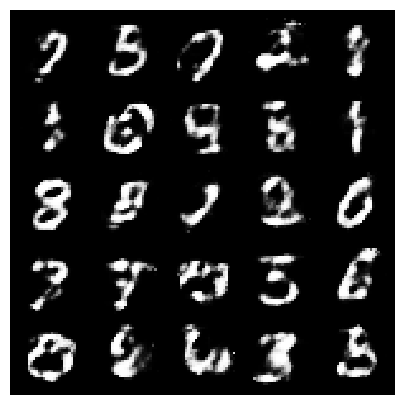

[Epoch 182/200] [Batch 284/938] [D loss: -0.089833] [G loss: -3.269951]


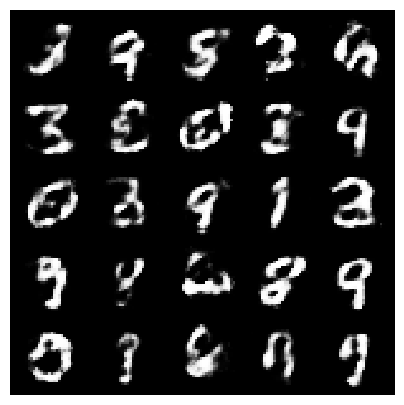

[Epoch 182/200] [Batch 784/938] [D loss: -0.061777] [G loss: -3.138146]


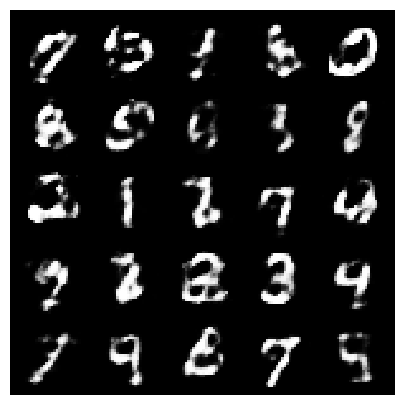

[Epoch 183/200] [Batch 346/938] [D loss: -0.076179] [G loss: -3.234219]


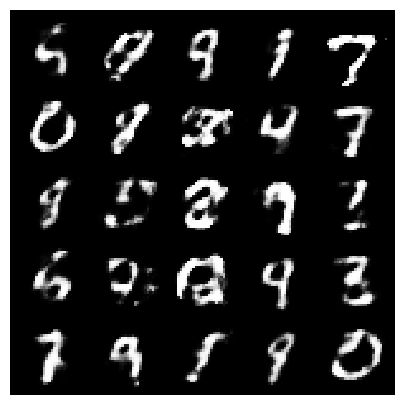

[Epoch 183/200] [Batch 846/938] [D loss: -0.056545] [G loss: -3.310379]


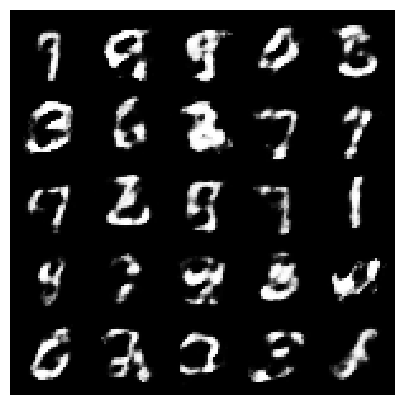

[Epoch 184/200] [Batch 408/938] [D loss: -0.054578] [G loss: -3.478480]


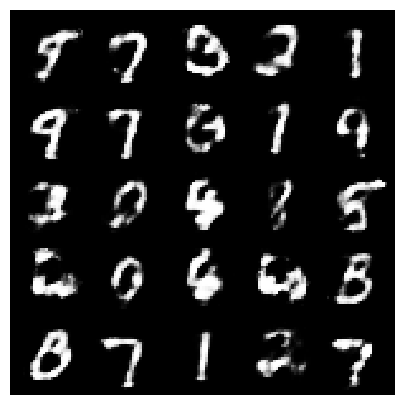

[Epoch 184/200] [Batch 908/938] [D loss: -0.075605] [G loss: -3.100258]


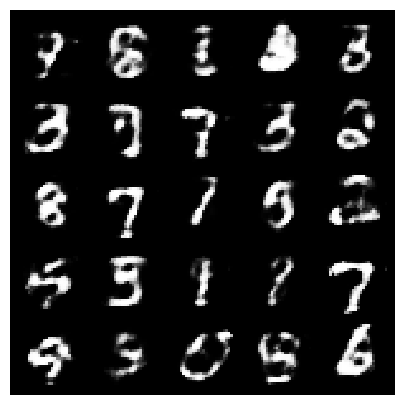

[Epoch 185/200] [Batch 470/938] [D loss: -0.069905] [G loss: -3.234678]


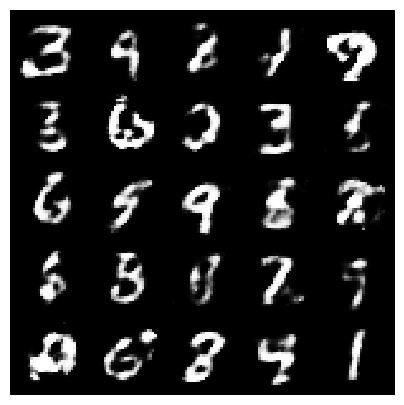

[Epoch 186/200] [Batch 32/938] [D loss: -0.072162] [G loss: -3.062881]


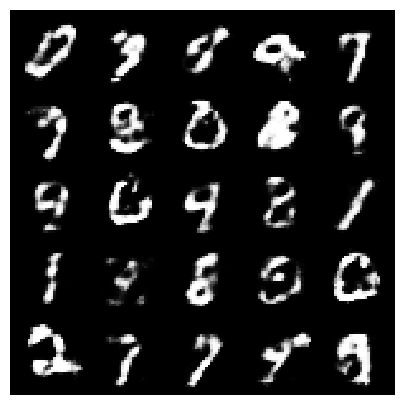

[Epoch 186/200] [Batch 532/938] [D loss: -0.081989] [G loss: -3.075985]


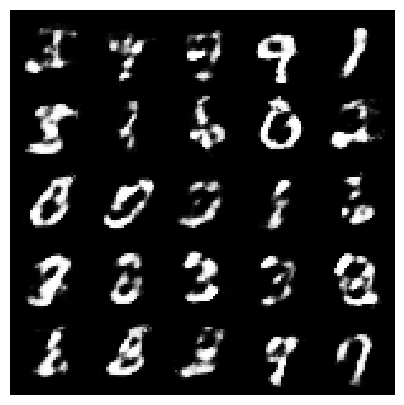

[Epoch 187/200] [Batch 94/938] [D loss: -0.068987] [G loss: -2.941464]


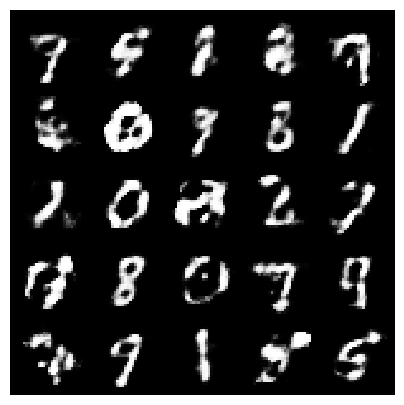

[Epoch 187/200] [Batch 594/938] [D loss: -0.061095] [G loss: -3.225477]


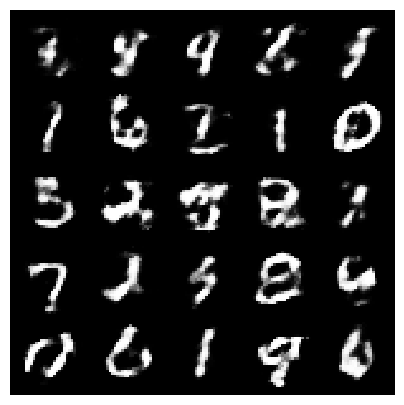

[Epoch 188/200] [Batch 156/938] [D loss: -0.043031] [G loss: -3.105927]


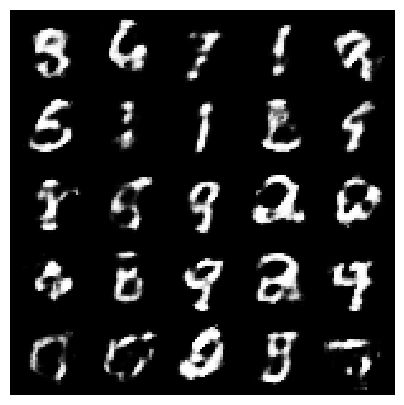

[Epoch 188/200] [Batch 656/938] [D loss: -0.063136] [G loss: -3.005726]


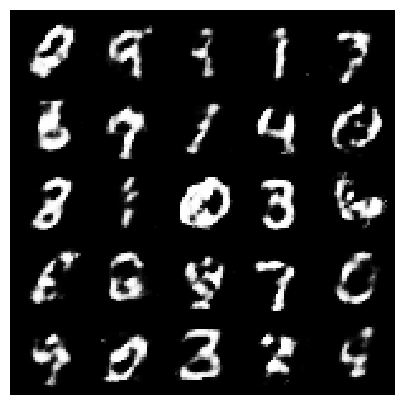

[Epoch 189/200] [Batch 218/938] [D loss: -0.085531] [G loss: -2.662787]


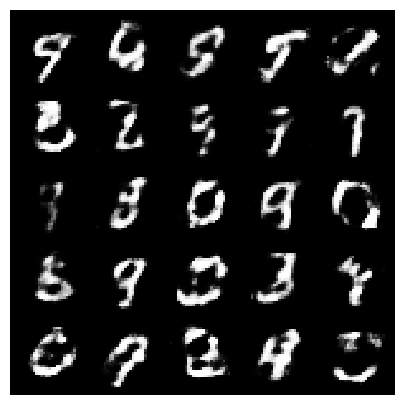

[Epoch 189/200] [Batch 718/938] [D loss: -0.053201] [G loss: -3.049887]


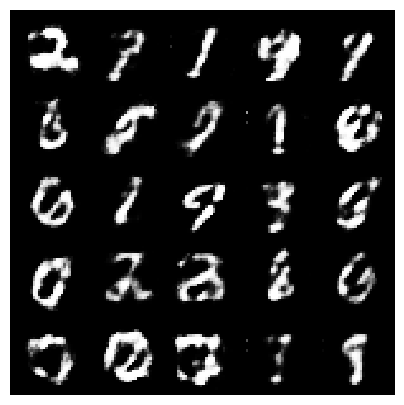

[Epoch 190/200] [Batch 280/938] [D loss: -0.044740] [G loss: -2.946321]


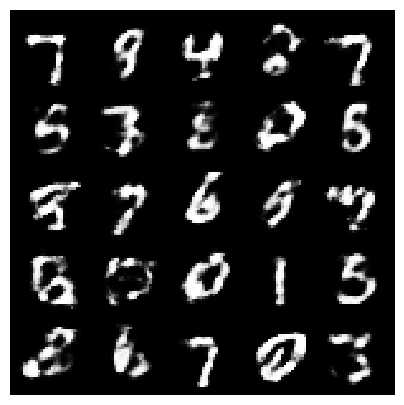

[Epoch 190/200] [Batch 780/938] [D loss: -0.055901] [G loss: -3.016598]


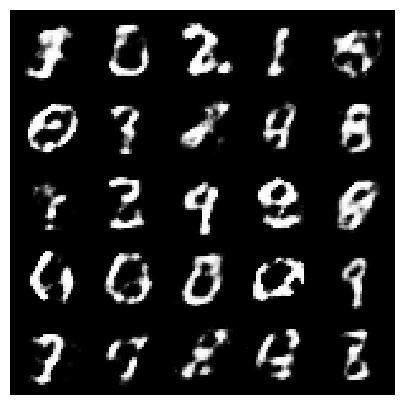

[Epoch 191/200] [Batch 342/938] [D loss: -0.077253] [G loss: -2.585758]


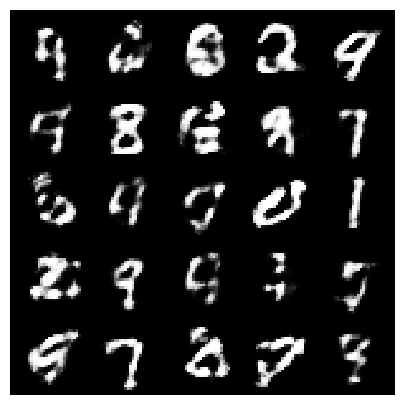

[Epoch 191/200] [Batch 842/938] [D loss: -0.066266] [G loss: -2.881551]


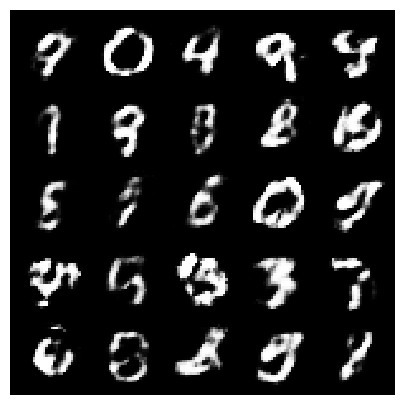

[Epoch 192/200] [Batch 404/938] [D loss: -0.077227] [G loss: -2.979232]


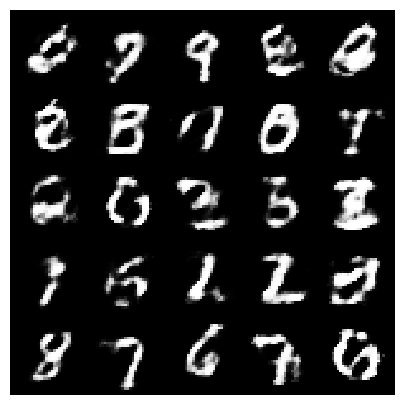

[Epoch 192/200] [Batch 904/938] [D loss: -0.071039] [G loss: -3.113956]


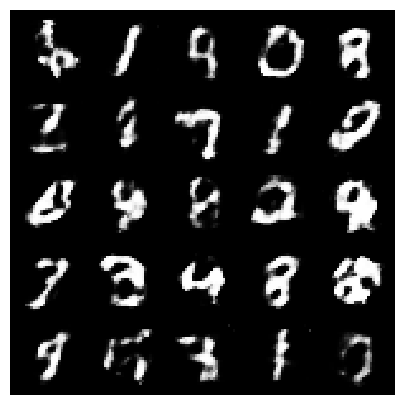

[Epoch 193/200] [Batch 466/938] [D loss: -0.054173] [G loss: -3.063278]


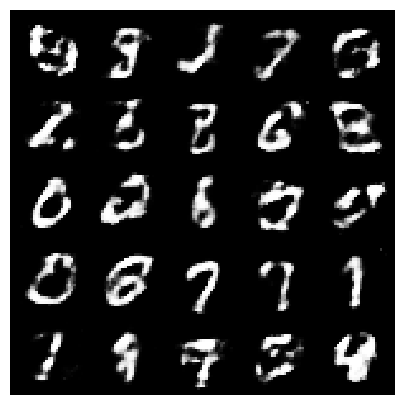

[Epoch 194/200] [Batch 28/938] [D loss: -0.050110] [G loss: -2.889745]


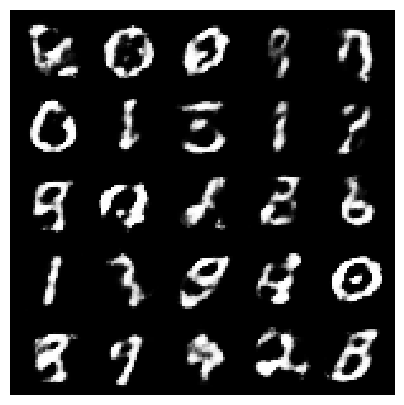

[Epoch 194/200] [Batch 528/938] [D loss: -0.080796] [G loss: -2.857935]


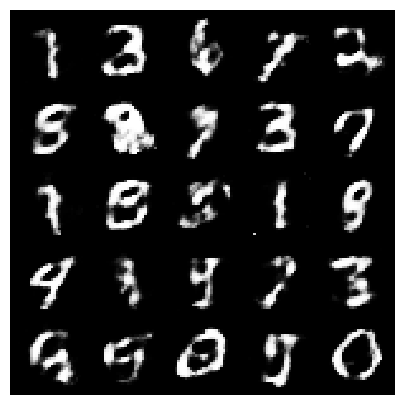

[Epoch 195/200] [Batch 90/938] [D loss: -0.077799] [G loss: -2.834145]


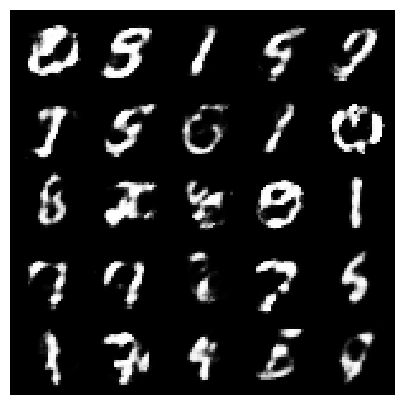

[Epoch 195/200] [Batch 590/938] [D loss: -0.071694] [G loss: -3.116672]


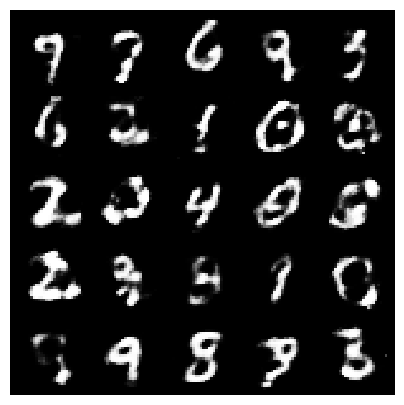

[Epoch 196/200] [Batch 152/938] [D loss: -0.075640] [G loss: -3.068867]


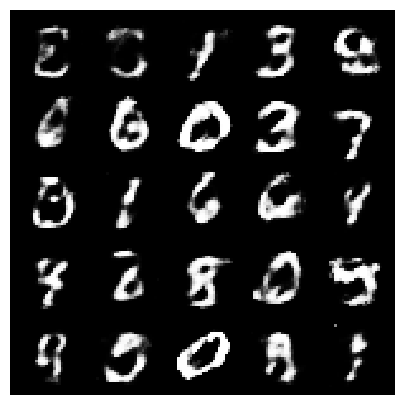

[Epoch 196/200] [Batch 652/938] [D loss: -0.045724] [G loss: -3.402165]


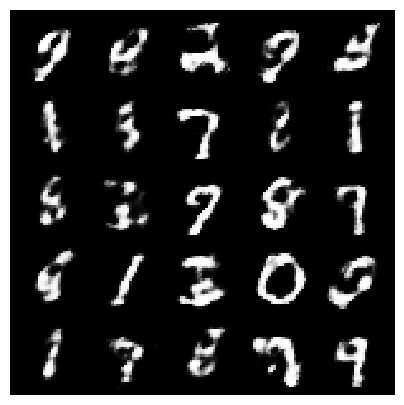

[Epoch 197/200] [Batch 214/938] [D loss: -0.055082] [G loss: -3.277668]


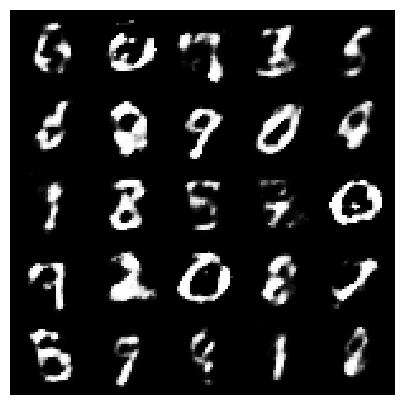

[Epoch 197/200] [Batch 714/938] [D loss: -0.051812] [G loss: -3.471797]


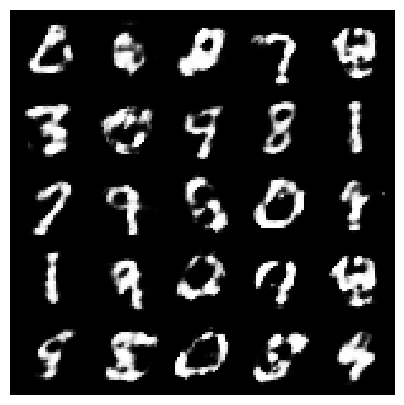

[Epoch 198/200] [Batch 276/938] [D loss: -0.033209] [G loss: -3.321182]


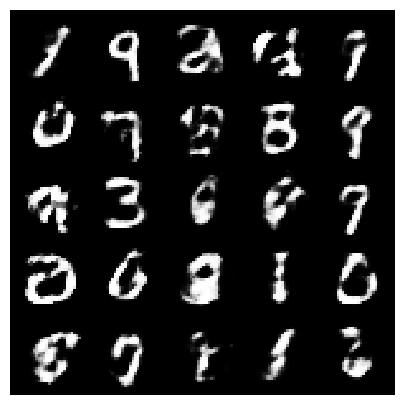

[Epoch 198/200] [Batch 776/938] [D loss: -0.101859] [G loss: -3.538621]


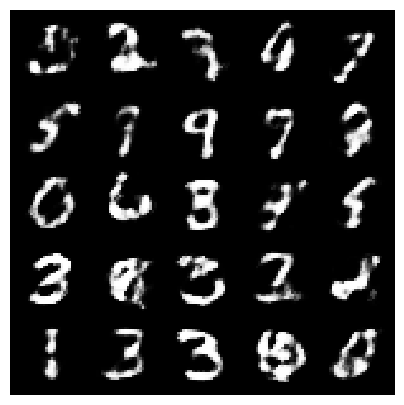

[Epoch 199/200] [Batch 338/938] [D loss: -0.022460] [G loss: -3.316072]


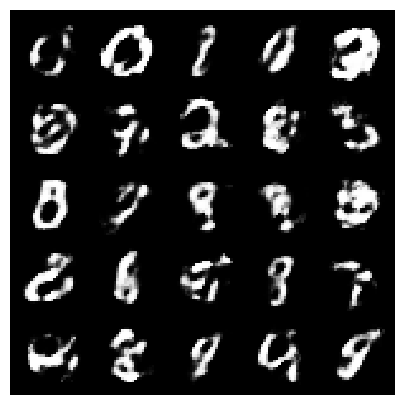

[Epoch 199/200] [Batch 838/938] [D loss: -0.087979] [G loss: -3.468565]


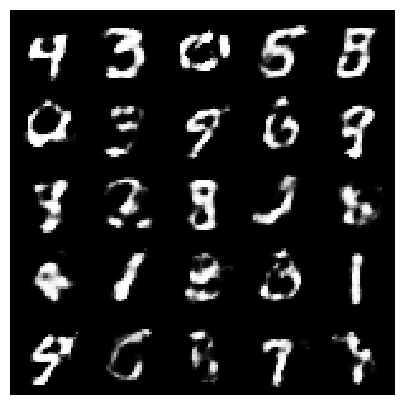

In [5]:

# ----------
#  Training
# ----------

batches_done = 0
for epoch in range(opt.n_epochs):

    for i, (imgs, _) in enumerate(dataloader):

        # Configure input
        real_imgs = Variable(imgs.type(Tensor))

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Sample noise as generator input
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))

        # Generate a batch of images
        fake_imgs = generator(z).detach()
        # Adversarial loss
        loss_D = -torch.mean(discriminator(real_imgs)) + torch.mean(discriminator(fake_imgs))

        loss_D.backward()
        optimizer_D.step()

        # Clip weights of discriminator
        for p in discriminator.parameters():
            p.data.clamp_(-opt.clip_value, opt.clip_value)

        # Train the generator every n_critic iterations
        if i % opt.n_critic == 0:

            # -----------------
            #  Train Generator
            # -----------------

            optimizer_G.zero_grad()

            # Generate a batch of images
            gen_imgs = generator(z)
            # Adversarial loss
            loss_G = -torch.mean(discriminator(gen_imgs))

            loss_G.backward()
            optimizer_G.step()


        batches_done = epoch * len(dataloader) + i
        if batches_done % opt.sample_interval == 0:
            print(
                "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
                % (epoch, opt.n_epochs, batches_done % len(dataloader), len(dataloader), loss_D.item(), loss_G.item())
            )

            save_image(gen_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)

            plt.figure(figsize = (5,5))
            img1 = cv2.imread("images/%d.png" %batches_done)
            plt.imshow(img1, interpolation='nearest')
            plt.axis('off')
            plt.show()